In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from scipy.spatial import distance
from skbio.diversity import beta_diversity
from skbio.diversity import alpha_diversity
from scipy.cluster import hierarchy
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA
import colorcet as cc
from scipy.stats import pearsonr
from scipy.optimize import curve_fit
from matplotlib_venn import venn3
from matplotlib_venn import venn2
from string import ascii_letters
import matplotlib as mpl
from matplotlib.colors import ListedColormap, BoundaryNorm
import random
mpl.rcParams['pdf.fonttype'] = 42

In [2]:
als = pd.read_csv("../ALSCDATA_fish.csv")

In [73]:
als[als["Pond #"] == "070716"]

,Pond #,Pond Name,Town,Quad,Park,Ownership,Wilderness Area,County,Watershed,LTM,...,TGT,AE,FSD,CCS,SAL,MCS,BDS,AW,NF,Fish_Richness
1416,070716,LILY LAKE,Caroga,Canada Lake,Y,Mixed,None,Fulton,Mohawk,N,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,10


In [3]:
als[als.columns.tolist()[29:-1]] = als[als.columns.tolist()[29:-1]].fillna(0)

In [4]:
als["Fish_Richness"] = als[als.columns.tolist()[29:-1]].astype(bool).sum(axis=1)

In [5]:
als.loc[~als["Pond #"].str.contains("A"), "Pond #"] = "0" + als["Pond #"]

In [6]:
spattributes = pd.read_csv("../ALS_fishcodes_with_latin_names.csv")
spattributes.loc[spattributes["habitat"].isna(), "habitat"] = "NA"
spattributes = spattributes[~spattributes["Species"].isin(['BNM', 'FSD-NRD', 'NPD'])].reset_index(drop=True)

In [7]:
deepspp = (spattributes["Species"]
           [spattributes["habitat"].str.contains("offshore deep")]
           [~spattributes["Species"].isin(["TGT", "TM", "SPL", "RT", "KOK", "ST"])].tolist())
deep = als[['Pond #', 'Pond Name', 'Town', 'Quad', 'Park', 'Ownership',
       'Wilderness Area', 'County', ' Watershed', ' LTM', ' Primitive Area',
       ' Wild Forest Area', 'Latitude', 'Longitude', 'Watershed Area (ha)',
       ' Volume(m3)', 'WA/SA ratio', 'Max Depth (m)', 'NYTMN', 'NYTME',
       'Runoff (cm)', 'Littoral Area (ha)', '%Shore Slope >5deg',
       'Mean Depth (m)', 'Elevation (m)', ' Surface Area (ha)',
       'Flushing Rate(times/yr)', 'Shoreline Length (km)', 'Date'] + deepspp]
deep["Fish_Richness"] = deep[deep.columns.tolist()[-len(deepspp):]].astype(bool).sum(axis=1)

/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/2835972995.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deep["Fish_Richness"] = deep[deep.columns.tolist()[-len(deepspp):]].astype(bool).sum(axis=1)


In [8]:
shallow = als[["Pond #", ' Surface Area (ha)', 'Max Depth (m)', "Mean Depth (m)"] + spattributes["Species"][spattributes["habitat"] == "nearshore"].tolist()]
shallow["Fish_Richness"] = shallow[shallow.columns.tolist()[4:]].astype(bool).sum(axis=1)

/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/1321618382.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  shallow["Fish_Richness"] = shallow[shallow.columns.tolist()[4:]].astype(bool).sum(axis=1)


<Axes: xlabel=' Surface Area (ha)', ylabel='Fish_Richness'>

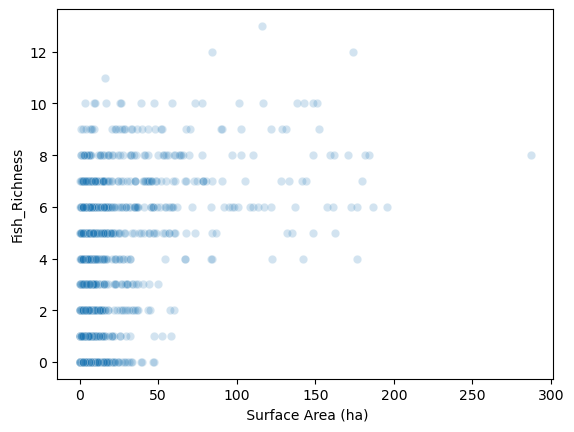

In [9]:
sns.scatterplot(data = shallow, x = ' Surface Area (ha)', y = "Fish_Richness", alpha = 0.2)

<Axes: xlabel='Max Depth (m)', ylabel='Fish_Richness'>

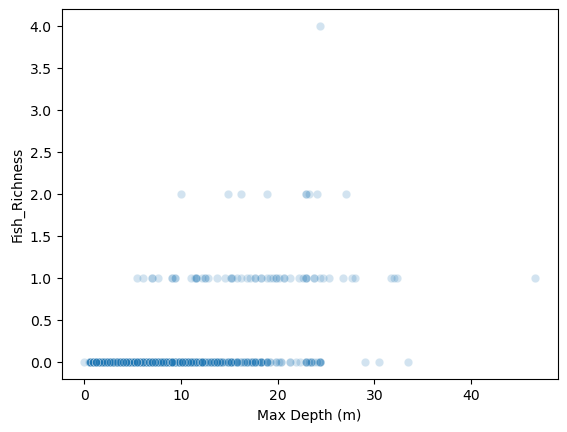

In [10]:
sns.scatterplot(data = deep, x = 'Max Depth (m)', y = "Fish_Richness", alpha = 0.2)

<Axes: xlabel='Max Depth (m)', ylabel='Fish_Richness'>

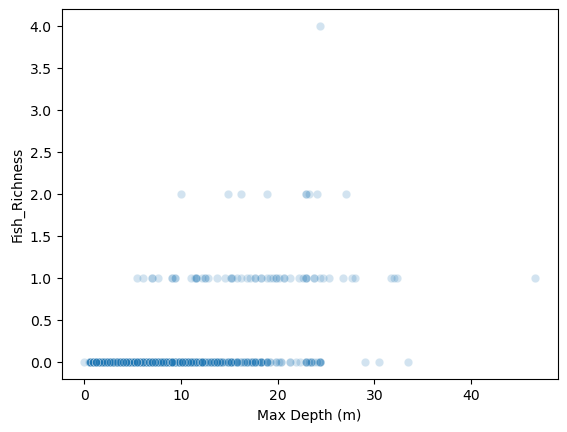

In [11]:
sns.scatterplot(data = deep, x = 'Max Depth (m)', y = "Fish_Richness", alpha = 0.2)

<Axes: xlabel='Max Depth (m)', ylabel='Fish_Richness'>

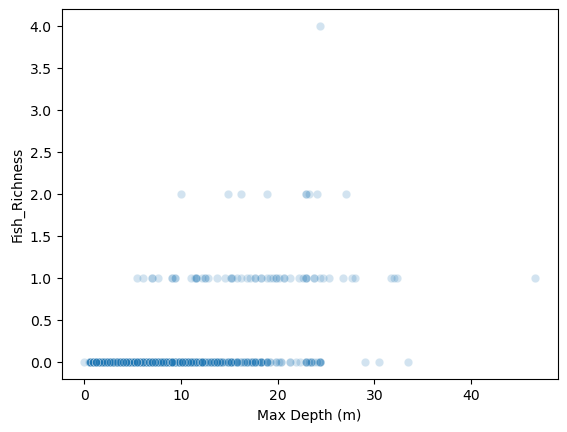

In [12]:
sns.scatterplot(data = deep, x = 'Max Depth (m)', y = "Fish_Richness", alpha = 0.2)

<Axes: xlabel='Mean Depth (m)', ylabel='Fish_Richness'>

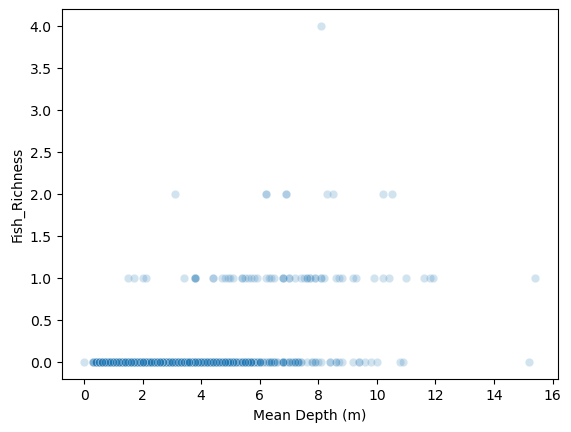

In [13]:
sns.scatterplot(data = deep, x = 'Mean Depth (m)', y = "Fish_Richness", alpha = 0.2)

In [14]:
# Function to calculate RSS
def calculate_rss(y_data, y_model):
    return np.sum((y_data - y_model) ** 2)

# 1. Michaelis-Menten model (Basic)
def michaelis_menten(x, K, C, B):
    return (K * x) / (x + C)

# 2. Hill function model
def hill_function(x, K, C, n):
    return ((K * (x)**n) / (C**n + (x)**n))

# 3. Generalized Logistic model
def generalized_logistic(x, K, B, C):
    return K / (1 + np.exp(-B * (x - C)))

# 4. Logistic Growth (Standard S-shaped curve)
def logistic_growth(x, K, r, x0):
    return K / (1 + np.exp(-r * (x - x0)))

# 5. Richards Curve (generalized logistic curve)
def richards(x, K, r, x0, v):
    return K / (1 + np.exp(-r * (x - x0)))**(1/v)

# 6. Gompertz Curve (asymptotic curve)
def gompertz(x, K, r, x0):
    return K * np.exp(-np.exp(-r * (x - x0)))

# 7. Exponential Decay (Inverted)
def exp_decay(x, A, B, C):
    return A * np.exp(-B * (x - C))

# 8. Shifted Logistic Growth (shifted S-curve)
def shifted_logistic(x, K, r, x0):
    return K / (1 + np.exp(-r * (x - x0)))

# 9. Exponential Growth Model (inverse of decay)
def exp_growth(x, A, r, C):
    return A * np.exp(r * (x - C))

# 10. Monod Equation (a variant of Michaelis-Menten)
def monod(x, K, S, B):
    return (K * x) / (S + x)

# 11. Humboldt Growth Curve (another biological growth model)
def humboldt_growth(x, K, r, x0):
    return K / (1 + np.exp(-r * (x - x0)))

# 12. Barton Curve (used in environmental sciences)
def barton_curve(x, A, B, C):
    return A / (1 + np.exp(-B * (x - C)))

def species_area_power(x, c, z, b):
    return c * x**z + b

models = {
    "Species-Area Power": species_area_power,
    "Michaelis-Menten": michaelis_menten,
    "Hill": hill_function,
    "Generalized Logistic": generalized_logistic,
    "Logistic Growth": logistic_growth,
    "Richards": richards,
    "Gompertz": gompertz,
    "Exponential Decay": exp_decay,
    "Shifted Logistic": shifted_logistic,
    "Exponential Growth": exp_growth,
    "Monod": monod,
    "Humboldt Growth": humboldt_growth,
    "Barton Curve": barton_curve
}

# Initial parameter guesses for each model
initial_guesses = {
    "Species-Area Power": [1, 0.25, 0], 
    "Michaelis-Menten": [50, 10, 2],
    "Hill": [50, 20, 2],
    "Generalized Logistic": [50, 0.1, 20],
    "Logistic Growth": [50, 0.1, 20],
    "Richards": [50, 0.1, 20, 1],
    "Gompertz": [50, 0.1, 20],
    "Exponential Decay": [50, 0.1, 10],
    "Shifted Logistic": [50, 0.1, 20],
    "Exponential Growth": [50, 0.1, 10],
    "Monod": [50, 20, 0.1],
    "Humboldt Growth": [50, 0.1, 20],
    "Barton Curve": [50, 0.1, 20]
}

model_bounds = {
    "Species-Area Power": ([0, 0, -np.inf], [np.inf, 1, np.inf]),
    "Michaelis-Menten": ([0, -np.inf, -np.inf], [80, np.inf, np.inf]),
    "Hill": ([0, -np.inf, -np.inf], [80, np.inf, np.inf]),
    "Generalized Logistic": ([0, -np.inf, -np.inf], [80, np.inf, np.inf]),
    "Logistic Growth": ([0, -np.inf, -np.inf], [80, np.inf, np.inf]),
    "Richards": ([0, -np.inf, -np.inf, -np.inf], [80, np.inf, np.inf, np.inf]),
    "Gompertz": ([0, -np.inf, -np.inf], [80, np.inf, np.inf]),
    "Exponential Decay": ([0, -np.inf, -np.inf], [80, np.inf, np.inf]),
    "Shifted Logistic": ([0, -np.inf, -np.inf], [80, np.inf, np.inf]),
    "Exponential Growth": ([0, -np.inf, -np.inf], [80, np.inf, np.inf]),
    "Monod": ([0, -np.inf, -np.inf], [80, np.inf, np.inf]),
    "Humboldt Growth": ([0, -np.inf, -np.inf], [80, np.inf, np.inf]),
    "Barton Curve": ([0, -np.inf, -np.inf], [80, np.inf, np.inf])
}

In [15]:
bestcorrelates = pd.DataFrame()
for correlate in ['Mean Depth (m)', "Max Depth (m)", " Surface Area (ha)"]:
    # Store results
    best_rss = np.inf
    best_curve = None
    best_params = None
    best_y_fit = None
    
    y_data = np.array(deep["Fish_Richness"])
    x_data = np.array(deep[correlate])
    
    # Try fitting each curve type
    #for curve_name in list(models.keys()):
    for curve_name in ['Michaelis-Menten',
 'Hill',
 'Generalized Logistic',
 'Logistic Growth',
 'Gompertz',
 'Exponential Decay',
 'Shifted Logistic',
 'Exponential Growth',
 'Monod',
 'Humboldt Growth',
 'Barton Curve']:
        try:
            # Fit the curve
            popt, _ = curve_fit(models[curve_name], x_data, y_data, 
                                p0=initial_guesses[curve_name], 
                                bounds=model_bounds[curve_name],
                                maxfev=50000)
    
            # Calculate the fitted values
            y_fit = models[curve_name](x_data, *popt)
    
            # Calculate RSS
            rss = calculate_rss(y_data, y_fit)
    
            # Store the best model
            if rss < best_rss:
                best_rss = rss
                best_curve = curve_name
                best_params = popt
                best_y_fit = y_fit
    
            print(f"Curve: {curve_name}, RSS: {rss}")
    
        except Exception as e:
            print(f"Error fitting {curve_name}: {e}")
    
    x_fit = np.linspace(min(x_data), max(x_data), 1000)
    y_fit = models[best_curve](x_fit, *best_params)
    
    # Output best model and parameters
    print(f"\nBest curve: {best_curve}")
    print(f"Best parameters: {best_params}")
    print(f"Best RSS: {best_rss}")
    tmp = pd.DataFrame(data = [correlate, best_rss, best_curve, best_params, y_fit, x_fit, y_data, x_data]).T
    tmp.columns = ["Correlate", "RSS", "Curve", "Best Params", "Yfitted", "Xfitted", "y", "x"]
    bestcorrelates = pd.concat([bestcorrelates, tmp]).reset_index(drop=True)
    
    #best_models_by_lake[lake] = [best_curve, best_params, best_rss]
    #tmp = pd.DataFrame()
    #tmp["Number of Samples"] = x_fit
    #tmp["Number of Species"] = y_fit
    #tmp["Name"] = lake.split("_")[0]
    #tmp["Season"] = lake.split("_")[1]
    #fitted_data = pd.concat([fitted_data, tmp]).reset_index(drop=True)

Curve: Michaelis-Menten, RSS: 89.73343185518907
Curve: Hill, RSS: 77.68799622445437
Curve: Generalized Logistic, RSS: 77.57393363207271
Curve: Logistic Growth, RSS: 77.57393363207271
Curve: Gompertz, RSS: 77.803939704295
Curve: Exponential Decay, RSS: 91.65412993356179
Curve: Shifted Logistic, RSS: 77.57393363207271
Curve: Exponential Growth, RSS: 89.38533537472867
Curve: Monod, RSS: 89.7334316023863
Curve: Humboldt Growth, RSS: 77.57393363207271
Curve: Barton Curve, RSS: 77.57393363207271

Best curve: Generalized Logistic
Best parameters: [0.74264942 1.0705046  6.75143892]
Best RSS: 77.57393363207271
Curve: Michaelis-Menten, RSS: 88.38290898377674
Curve: Hill, RSS: 78.27375016485739
Curve: Generalized Logistic, RSS: 77.97160829271772
Curve: Logistic Growth, RSS: 77.97160829271772
Curve: Gompertz, RSS: 78.3878631098608
Curve: Exponential Decay, RSS: 89.26311264621735
Curve: Shifted Logistic, RSS: 77.97160829271772
Curve: Exponential Growth, RSS: 89.16889767111883
Curve: Monod, RSS: 88.

<Axes: >

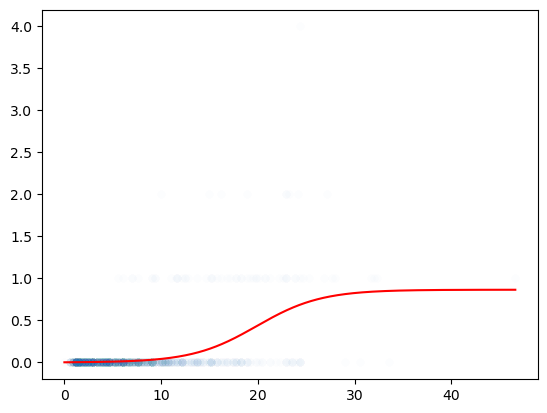

In [16]:
sns.scatterplot(x = bestcorrelates["x"][1], y = bestcorrelates["y"][1], alpha = 0.01)
sns.lineplot(x = bestcorrelates["Xfitted"][1], y = bestcorrelates["Yfitted"][1], color = "Red")

<Axes: >

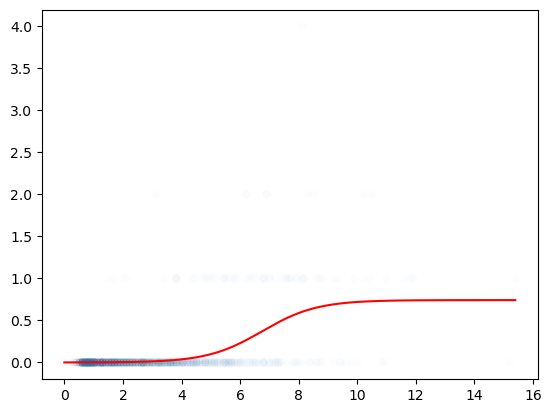

In [17]:
sns.scatterplot(x = bestcorrelates["x"][0], y = bestcorrelates["y"][0], alpha = 0.01)
sns.lineplot(x = bestcorrelates["Xfitted"][0], y = bestcorrelates["Yfitted"][0], color = "Red")

In [74]:
scalelakes = pd.read_csv("../scale_full_selection.csv")
scalelakes["PONDNO"] = scalelakes["PONDNO"].fillna("A")

In [75]:
scalelakes.loc[~scalelakes['PONDNO'].str.contains("A"), 'PONDNO'] = "0" + scalelakes['PONDNO']

In [76]:
scalelakes.loc[scalelakes['PONDNO'] == "A", 'PONDNO'] = np.nan

In [77]:
scalelakes["Pond #"] = scalelakes["PONDNO"]

In [78]:
scalelakes = scalelakes.merge(als[["Pond #", "Fish_Richness"]], how = "left", on = "Pond #")

<Axes: xlabel='Fish_Richness', ylabel='Density'>

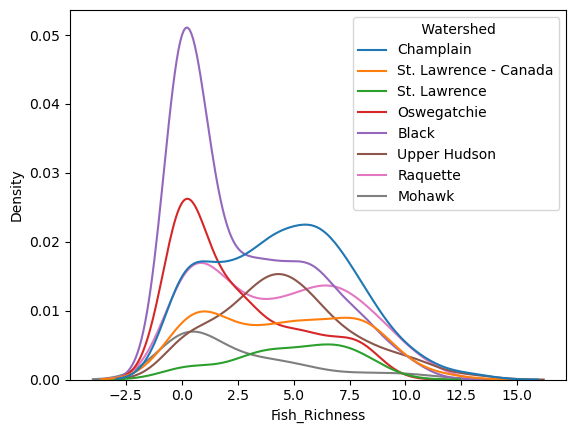

In [23]:
sns.kdeplot(data = als, x = "Fish_Richness", hue = " Watershed")

In [24]:
deep.columns

Index(['Pond #', 'Pond Name', 'Town', 'Quad', 'Park', 'Ownership',
       'Wilderness Area', 'County', ' Watershed', ' LTM', ' Primitive Area',
       ' Wild Forest Area', 'Latitude', 'Longitude', 'Watershed Area (ha)',
       ' Volume(m3)', 'WA/SA ratio', 'Max Depth (m)', 'NYTMN', 'NYTME',
       'Runoff (cm)', 'Littoral Area (ha)', '%Shore Slope >5deg',
       'Mean Depth (m)', 'Elevation (m)', ' Surface Area (ha)',
       'Flushing Rate(times/yr)', 'Shoreline Length (km)', 'Date', 'CIS', 'LT',
       'LWF', 'RWF', 'SS', 'Fish_Richness'],
      dtype='object')

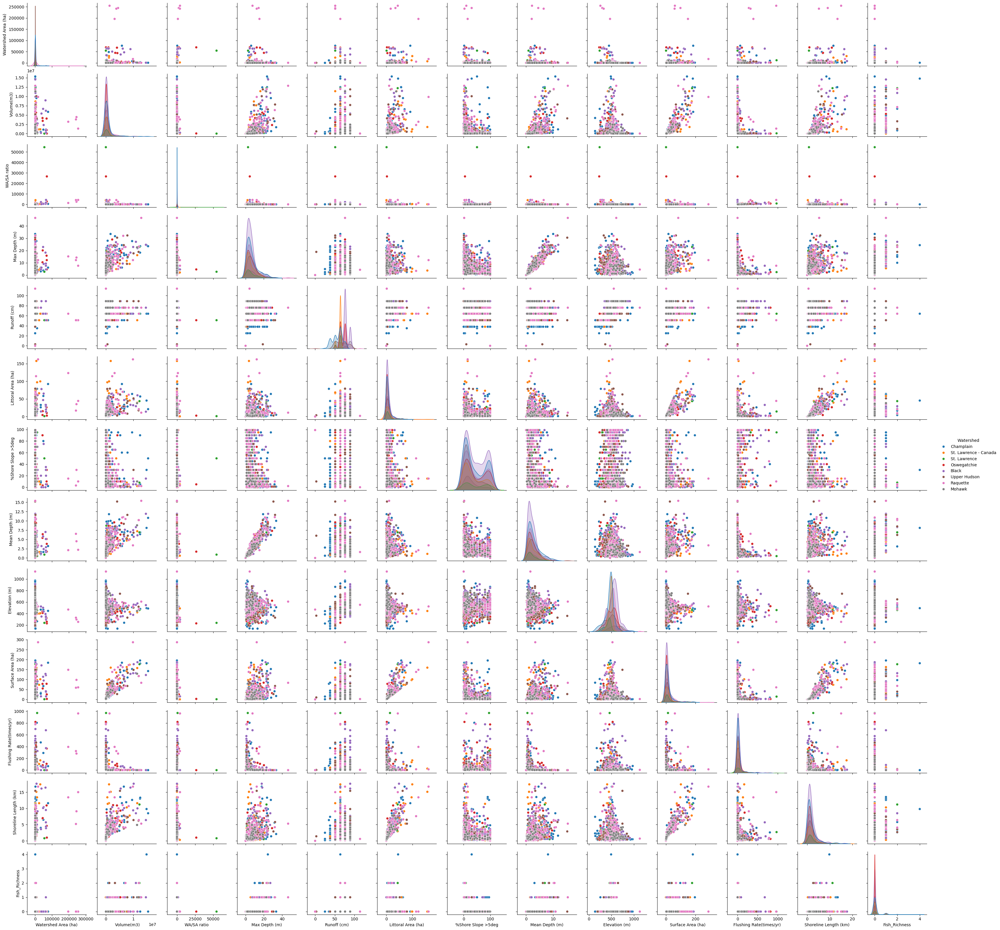

In [25]:
sns.pairplot(deep[[" Watershed", 'Watershed Area (ha)',
       ' Volume(m3)', 'WA/SA ratio', 'Max Depth (m)',
       'Runoff (cm)', 'Littoral Area (ha)', '%Shore Slope >5deg',
       'Mean Depth (m)', 'Elevation (m)', ' Surface Area (ha)',
       'Flushing Rate(times/yr)', 'Shoreline Length (km)', "Fish_Richness"]], hue = " Watershed")

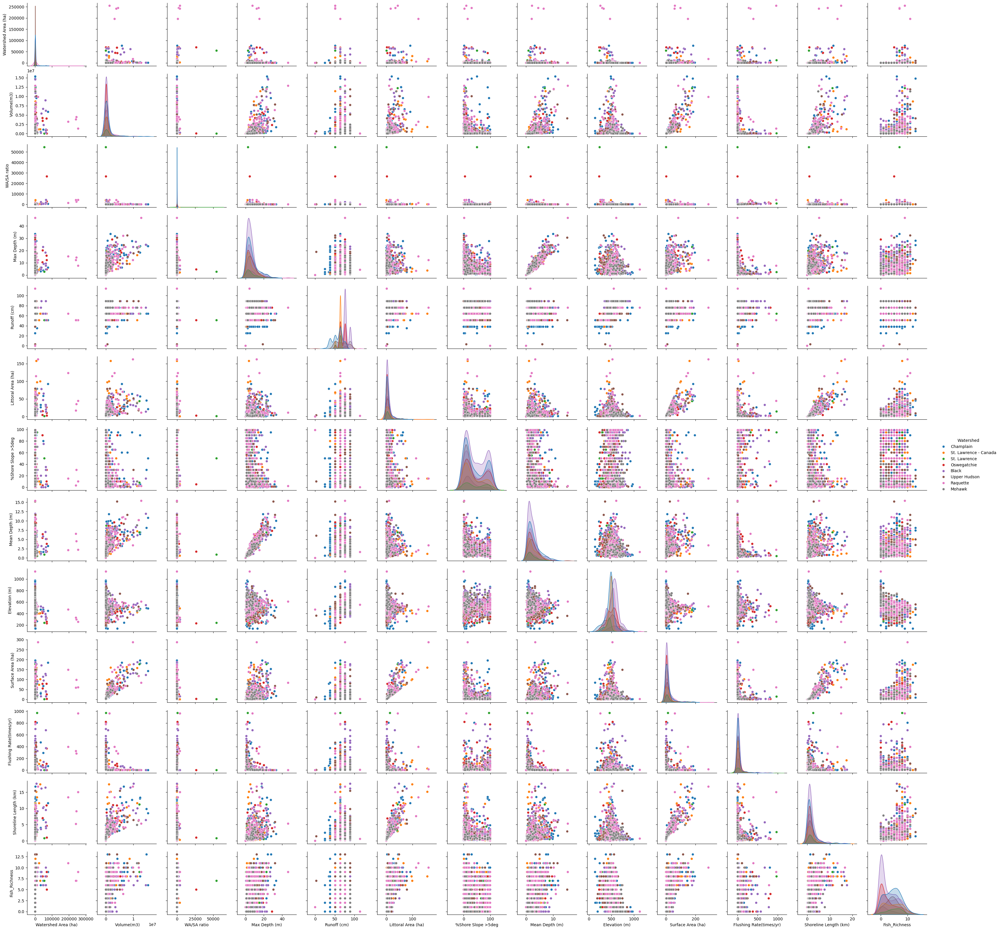

In [26]:
sns.pairplot(als[[" Watershed", 'Watershed Area (ha)',
       ' Volume(m3)', 'WA/SA ratio', 'Max Depth (m)',
       'Runoff (cm)', 'Littoral Area (ha)', '%Shore Slope >5deg',
       'Mean Depth (m)', 'Elevation (m)', ' Surface Area (ha)',
       'Flushing Rate(times/yr)', 'Shoreline Length (km)', "Fish_Richness"]], hue = " Watershed")

In [27]:
bestcorrelates = pd.DataFrame()
for correlate in [' Surface Area (ha)']:
    # Store results
    best_rss = np.inf
    best_curve = None
    best_params = None
    best_y_fit = None
    
    y_data = np.array(als["Fish_Richness"])
    x_data = np.array(als[correlate])
    
    # Try fitting each curve type
    for curve_name in list(models.keys()):
        try:
            # Fit the curve
            popt, _ = curve_fit(models[curve_name], x_data, y_data, 
                                p0=initial_guesses[curve_name], 
                                bounds=model_bounds[curve_name],
                                maxfev=50000)
    
            # Calculate the fitted values
            y_fit = models[curve_name](x_data, *popt)
    
            # Calculate RSS
            rss = calculate_rss(y_data, y_fit)
    
            # Store the best model
            if rss < best_rss:
                best_rss = rss
                best_curve = curve_name
                best_params = popt
                best_y_fit = y_fit
    
            print(f"Curve: {curve_name}, RSS: {rss}")
    
        except Exception as e:
            print(f"Error fitting {curve_name}: {e}")
    
    x_fit = np.linspace(min(x_data), max(x_data), 1000)
    y_fit = models[best_curve](x_fit, *best_params)
    
    # Output best model and parameters
    print(f"\nBest curve: {best_curve}")
    print(f"Best parameters: {best_params}")
    print(f"Best RSS: {best_rss}")
    tmp = pd.DataFrame(data = [correlate, best_rss, best_curve, best_params, y_fit, x_fit, y_data, x_data]).T
    tmp.columns = ["Correlate", "RSS", "Curve", "Best Params", "Yfitted", "Xfitted", "y", "x"]
    bestcorrelates = pd.concat([bestcorrelates, tmp]).reset_index(drop=True)
    
    #best_models_by_lake[lake] = [best_curve, best_params, best_rss]
    #tmp = pd.DataFrame()
    #tmp["Number of Samples"] = x_fit
    #tmp["Number of Species"] = y_fit
    #tmp["Name"] = lake.split("_")[0]
    #tmp["Season"] = lake.split("_")[1]
    #fitted_data = pd.concat([fitted_data, tmp]).reset_index(drop=True)

Curve: Species-Area Power, RSS: 9644.69081723489
Curve: Michaelis-Menten, RSS: 10176.299935089057
Curve: Hill, RSS: 9638.683280907715
Curve: Generalized Logistic, RSS: 9897.794256585177
Curve: Logistic Growth, RSS: 9897.794256585177
Curve: Richards, RSS: 9821.994830384105
Curve: Gompertz, RSS: 9821.985709747983
Curve: Exponential Decay, RSS: 11824.316251016933
Curve: Shifted Logistic, RSS: 9897.794256585177
Curve: Exponential Growth, RSS: 11824.316245924867
Curve: Monod, RSS: 10176.299937660915
Curve: Humboldt Growth, RSS: 9897.794256585177
Curve: Barton Curve, RSS: 9897.794256585177

Best curve: Hill
Best parameters: [2.54095322e+01 6.68236006e+02 4.02358197e-01]
Best RSS: 9638.683280907715


Text(0.5, 0, 'Surface Area (ha)')

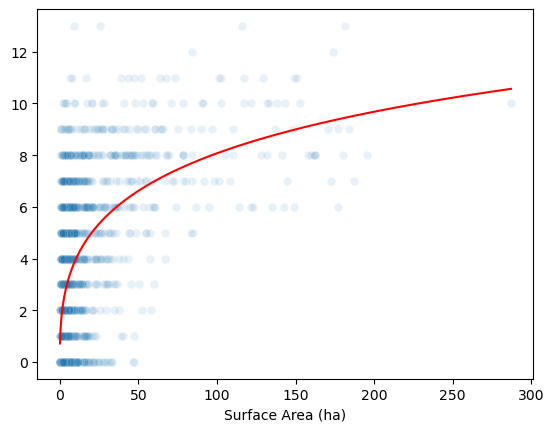

In [28]:
sns.scatterplot(x = bestcorrelates["x"][0], y = bestcorrelates["y"][0], alpha = 0.1)
sns.lineplot(x = bestcorrelates["Xfitted"][0], y = bestcorrelates["Yfitted"][0], color = "Red")
plt.xlabel("Surface Area (ha)")

In [79]:
scalelakes["ALS_Richness"] = scalelakes["Fish_Richness"]

In [80]:
scalelakes["SAC_Richness"] = np.nan
for i in range(len(scalelakes)):
    scalelakes["SAC_Richness"][i] = np.ceil(hill_function([scalelakes["SAREA"][i]], *bestcorrelates["Best Params"][0]))

/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/2502268004.py:3: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  scalelakes["SAC_Richness"][i] = np.ceil(hill_function([scalelakes["SAREA"][i]], *bestcorrelates["Best Params"][0])

In [81]:
scalelakes["Fish_Richness"] = np.nanmax(scalelakes[["ALS_Richness", "SAC_Richness"]].values, axis=1)

In [32]:
historical_spp = pd.read_csv("../historical_species_lists.csv")
historical_spp.loc[historical_spp["Survey Month_Year"].str.contains("-"), "Year"] = 2006
historical_spp.loc[historical_spp["Year"].isna(), "Year"] = historical_spp["Survey Month_Year"]
historical_spp["Year"] = historical_spp["Year"].astype(int)

/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/386579521.py:3: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '['1931' '1931' '1931' '1931' '1931' '1931' '1931' '1931' '1931' '1931'
 '1931' '1982' '1982' '1982' '1982' '1982' '1982' '1982' '1982' '1982'
 '1982' '1982' '1931' '1931' '1931' '1931' '1931' '1931' '1931' '1931'
 '1931' '1931' '1982' '1982' '1982' '1982' '1982' '1982' '1982' '1982'
 '1982' '1982' '1982' '1982' '1982' '1982' '1982' '2024' '2024' '2024'
 '2024' '2024' '2024' '2024' '2024' '2024' '2024' '2024' '2024' '2024'
 '2024' '2024' '2024' '2024' '2024' '2024' '2024' '2024' '2024' '2024'
 '2024' '2024' '2024']' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  historical_spp.loc[historical_spp["Year"].isna(), "Year"] = historical_spp["Survey Month_Year"]


In [33]:
historical_spp = historical_spp.sort_values(["Name", "Species", "Year"]).drop_duplicates(["Name", "Species", "Year"])

In [34]:
metadata = pd.read_csv("../master_metadata.csv")
metadata.loc[metadata["Site"] == "Blank", "Name"] = "Field Blank"
metadata.loc[metadata["Site"] == "Extraction Blank", "Name"] = "Extraction Blank"
metadata.loc[metadata["Site"] == "PCR Blank", "Name"] = "PCR Blank"
metadata = metadata[metadata["EGCF-ID"].notna()].reset_index(drop=True)

In [35]:
asv = pd.read_csv("../dada2_asv_table_with_taxonomy.csv")
asv["Overall_Best"] = asv["Best_Hit_Refseq"]
asv["Overall_Best_Percent_ID"] = asv["Percent_ID_Refseq"]
asv["Overall_Best_Taxonomic_Level"] = asv['Best_Hit_Taxonomic_level_Refseq']
asv.loc[(asv["Percent_ID_Refseq"] < 98) & (asv["evalue_Refseq"] > asv["evalue"]), "Overall_Best"] = asv["Best_Hit"]
asv.loc[(asv["Percent_ID_Refseq"] < 98) & (asv["evalue_Refseq"] > asv["evalue"]), "Overall_Best_Percent_ID"] = asv["Percent_ID"]
asv.loc[(asv["Percent_ID_Refseq"] < 98) & (asv["evalue_Refseq"] > asv["evalue"]), "Overall_Best_Taxonomic_Level"] = asv['Best_Hit_Taxonomic_level']
asv = asv[asv["Class"] == "Actinopteri"].reset_index(drop=True)
fish = asv.copy()

In [36]:
#fish = asv[asv["CountsAcross"] > 10].reset_index(drop=True)
tmp = fish[fish.columns[2:-26].tolist() + ["Overall_Best"]].groupby('Overall_Best').transform('sum')
tmp[[i for i in fish.columns.tolist() if i not in tmp.columns.tolist()]] = fish[[i for i in fish.columns.tolist() if i not in tmp.columns.tolist()]]
tmp = tmp.drop_duplicates(fish.columns[2:-26].tolist() + ["Overall_Best"]).reset_index(drop=True)
fish = tmp.copy()
fish["Primer"] = "MiFish"

In [37]:
for samp in fish.columns[0:-29].tolist():
    fish.loc[fish[samp] < (fish[samp].sum() * 0.001), samp] = 0

In [38]:
fish["in_nsamps"] = fish[fish.columns[0:-29].tolist()].astype(bool).sum(axis=1)
fish = fish[fish["in_nsamps"] > 1].reset_index(drop=True)

In [39]:
asv = pd.read_csv("../dada2_mussels_asv_table_with_taxonomy.csv")
asv = asv[asv["CountsAcross"] > 10].reset_index(drop=True)
mussels = asv[asv["Best_Hit"].notna()][asv["Best_Hit"] != "NA"].reset_index(drop=True)
mussels["Overall_Best"] = mussels["Best_Hit"]
tmp = mussels[mussels.columns[2:-24].tolist() + ["Best_Hit"]].groupby('Best_Hit').transform('sum')
tmp[[i for i in mussels.columns.tolist() if i not in tmp.columns.tolist()]] = mussels[[i for i in mussels.columns.tolist() if i not in tmp.columns.tolist()]]
tmp = tmp.drop_duplicates(mussels.columns[2:-24].tolist() + ["Best_Hit"]).reset_index(drop=True)
mussels = tmp.copy()
mussels["Overall_Best"] = mussels["Best_Hit"]
mussels["Primer"] = "Mussel"
for samp in mussels.columns[0:-27].tolist():
    mussels.loc[mussels[samp] < (mussels[samp].sum() * 0.001), samp] = 0

/fs/s6k/fast/scratch/8922583_noge4093_mpcs043/ipykernel_4097827/2494241999.py:1: DtypeWarning: Columns (394,395,396,397,398,399,400,403,404,405,406,407,408,409,412,414) have mixed types. Specify dtype option on import or set low_memory=False.
  asv = pd.read_csv("../dada2_mussels_asv_table_with_taxonomy.csv")
/fs/s6k/fast/scratch/8922583_noge4093_mpcs043/ipykernel_4097827/2494241999.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  mussels = asv[asv["Best_Hit"].notna()][asv["Best_Hit"] != "NA"].reset_index(drop=True)


In [40]:
mussels["in_nsamps"] = mussels[mussels.columns[0:-27].tolist()].astype(bool).sum(axis=1)
mussels = mussels[mussels["in_nsamps"] > 1].reset_index(drop=True)

In [41]:
asv = pd.read_csv("../dada2_insects_asv_table_with_taxonomy.csv")
asv = asv[asv["CountsAcross"] > 10].reset_index(drop=True)
insects = asv[asv["Best_Hit"].notna()][asv["Best_Hit"] != "NA"][asv["Best_Hit_Taxonomic_level"].isin(["Species", "Genus", "Family"])].reset_index(drop=True)
insects = insects[insects.columns[2:-21].tolist() + ["Family", 'Order', "Class", "Phylum"]]
tmp = insects.groupby('Family').transform('sum')
tmp[[i for i in insects.columns.tolist() if i not in tmp.columns.tolist()]] = insects[[i for i in insects.columns.tolist() if i not in tmp.columns.tolist()]]
tmp = tmp.drop_duplicates(insects.columns[2:-21].tolist() + ["Family"]).reset_index(drop=True)
insects = tmp.copy()
insects["Overall_Best"] = insects["Family"]
insects["Primer"] = "Insects"
for samp in insects.columns[0:-8].tolist():
    insects.loc[insects[samp] < (insects[samp].sum() * 0.001), samp] = 0

/fs/s6k/fast/scratch/8922583_noge4093_mpcs043/ipykernel_4097827/1398026162.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  insects = asv[asv["Best_Hit"].notna()][asv["Best_Hit"] != "NA"][asv["Best_Hit_Taxonomic_level"].isin(["Species", "Genus", "Family"])].reset_index(drop=True)
/fs/s6k/fast/scratch/8922583_noge4093_mpcs043/ipykernel_4097827/1398026162.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  insects = asv[asv["Best_Hit"].notna()][asv["Best_Hit"] != "NA"][asv["Best_Hit_Taxonomic_level"].isin(["Species", "Genus", "Family"])].reset_index(drop=True)


In [42]:
insects["in_nsamps"] = insects[insects.columns[0:-8].tolist()].astype(bool).sum(axis=1)
insects = insects[insects["in_nsamps"] > 1].reset_index(drop=True)

In [43]:
mosslake = insects.columns[0:-6].tolist()

In [44]:
joined = pd.concat([fish, mussels, insects]).reset_index(drop=True)
joined = joined[joined["Overall_Best"].notna()].reset_index(drop=True)

In [45]:
rename = metadata[["EGCF-ID", "Name", "Description"]]
rename.columns = ["index", "Name", "Description"]
rename = rename.fillna("NA")

In [46]:
metadata["Merged"] = metadata["Name"] + "_" + metadata["Season"]

In [47]:
metadata = metadata[metadata["Merged"].notna()].reset_index(drop=True)

In [48]:
metadata.loc[metadata["Merged"].str.contains("Blank"), "Merged"] = "Blank"

In [49]:
subset = joined[joined["Primer"] == "MiFish"].reset_index(drop=True)

In [50]:
subset.loc[subset["Overall_Best"] == "Luxilus", "Overall_Best"] = "Luxilus cornutus"
subset.loc[subset["Overall_Best"] == "Coregonus", "Overall_Best"] = "Coregonus clupeaformis"
subset.loc[subset["Overall_Best"] == "Luxilus cornutus", "Overall_Best_Taxonomic_Level"] = "Species"
subset.loc[subset["Overall_Best"] == "Coregonus clupeaformis", "Overall_Best_Taxonomic_Level"] = "Species"

In [51]:
subset = subset[subset["Overall_Best_Taxonomic_Level"] == "Species"].reset_index(drop=True)

In [52]:
cov = subset.loc[:, (subset != 0).any(axis=0)]
coverages = []
for samp in cov.columns[:-33].tolist():
    coverages = coverages + [cov[samp].sum()]
q1, q3 = np.percentile(coverages, [25, 75])
iqr = q3 - q1
lowcov = q1 - (1.5 * iqr)

In [53]:
import pandas as pd

# Set up the final outputs
df_all_lakes = pd.DataFrame(columns = ['Family', "Genus", "Overall_Best", "Overall_Best_Taxonomic_Level"])
taxonomy_updated_flags = {}

# Loop through all unique lakes
for lake in metadata["Name"].unique():
    sample_cols = metadata["EGCF-ID"][metadata["Name"] == lake].tolist()

    # Filter and clean the data
    test = subset[sample_cols + ["Family", "Genus", "Overall_Best", "Overall_Best_Taxonomic_Level"]]
    test = test[~(test[sample_cols].fillna(0).astype(float) == 0).all(axis=1)].copy()

    df = test.copy()

    # --------- Genus-to-Species updates ---------
    genus_df = df[df["Overall_Best_Taxonomic_Level"] == "Genus"]
    species_df = df[df["Overall_Best_Taxonomic_Level"] == "Species"]

    for genus_idx, genus_row in genus_df.iterrows():
        genus = genus_row["Genus"]
        genus_samples = genus_row[sample_cols]
        species_matches = species_df[species_df["Genus"] == genus]

        for _, species_row in species_matches.iterrows():
            species_samples = species_row[sample_cols]

            if (genus_samples > 0).equals(species_samples > 0):
                df.at[genus_idx, "Overall_Best"] = species_row["Overall_Best"]
                df.at[genus_idx, "Overall_Best_Taxonomic_Level"] = "Species"
                taxonomy_updated_flags[genus + "_" + lake] = True
                break

    # --------- Family-to-Species updates ---------
    family_df = df[df["Overall_Best_Taxonomic_Level"] == "Family"]
    species_df = df[df["Overall_Best_Taxonomic_Level"] == "Species"]

    for family_idx, family_row in family_df.iterrows():
        family = family_row["Family"]
        family_samples = family_row[sample_cols]
        species_matches = species_df[species_df["Family"] == family]

        for _, species_row in species_matches.iterrows():
            species_samples = species_row[sample_cols]

            if (family_samples > 0).equals(species_samples > 0):
                df.at[family_idx, "Overall_Best"] = species_row["Overall_Best"]
                df.at[family_idx, "Overall_Best_Taxonomic_Level"] = "Species"
                taxonomy_updated_flags[family + "_" + lake] = True
                break

    # Append processed lake data
    tmp = df.groupby(['Family', "Genus", "Overall_Best", "Overall_Best_Taxonomic_Level"]).transform('sum')
    column_sums = tmp.sum(axis=0)
    cols_to_drop = column_sums[column_sums < lowcov].index
    tmp = tmp.drop(columns=cols_to_drop)
    try:
        tmp = pd.concat([tmp, df[['Family', "Genus", "Overall_Best", "Overall_Best_Taxonomic_Level"]]], axis = 1)
        df = tmp.drop_duplicates(subset=['Family', "Genus", "Overall_Best", "Overall_Best_Taxonomic_Level"])
        df_all_lakes = df_all_lakes.merge(df, how = "outer", on = ['Family', "Genus", "Overall_Best", "Overall_Best_Taxonomic_Level"])
    except:
        pass
df_all_lakes = df_all_lakes.fillna(0)

In [54]:
set1 = set(metadata["EGCF-ID"][metadata["Merged"].notna()].tolist())
set2 = set(df_all_lakes.columns.tolist())
overlap_set = set1.intersection(set2)
overlap_list = list(overlap_set)

In [55]:
metadata = metadata[metadata["Merged"].notna()].reset_index(drop=True)

In [56]:
combination = df_all_lakes[overlap_list + ["Overall_Best"]].set_index("Overall_Best").fillna(0)

In [57]:
outliers = ['387', '45', '373', '68', '221', '220', '217', '218', '113', '214',
 '136', '239', '126', '231', '76', '75', '367', '368', '71', '282', '55',
 '290', '281', '53', '285', '21', '264', '274', '6', '7', '330', '349',
 '318', '323', '335', '90', '96', '91', '154', '145', '155', '141',
 '150', '142', '162', '157', '176', '180', '179', '196', '202']

In [58]:
metadata.loc[metadata["Description"] == "Near Shore", "Description"] = "Nearshore"

In [59]:
metadata = metadata[~metadata["EGCF-ID"].isin(outliers)].reset_index(drop=True)

In [60]:
distinct = [["Deep"], ["Shallow"], ["Nearshore"]]
integrated = [["Deep", "Shallow"], ["Nearshore"]]
subsamples = 20

In [121]:
fakedataset = pd.DataFrame()
lakes = [i for i in metadata["Name"].unique().tolist() if "Blank" not in i]
for lake in lakes:
    fakelake = pd.DataFrame()
    for season in ["Spring", "Early Fall"]:
        for i in integrated:
            fakehabitat = pd.DataFrame()
            for iteration in range(0,subsamples):
                try:
                    fakesample = combination[random.choices((metadata["EGCF-ID"]
                            [metadata["Name"] == lake]
                            [metadata["Season"] == season]
                            [metadata["Description"].isin(i)].tolist()), 
                           k = 13)].sum(axis=1)
                    fakesample = pd.DataFrame(data = [fakesample]).T
                    fakesample.columns = [lake + "_" + season + "_" + "".join(i) + "_" + str(iteration)]
                    fakehabitat = pd.concat([fakehabitat, fakesample], axis = 1)
                except:
                    pass
            fakelake = pd.concat([fakelake, fakehabitat], axis = 1)
    fakedataset = pd.concat([fakedataset, fakelake], axis = 1)

In [122]:
fakemetadata = pd.DataFrame(data = fakedataset.columns, columns = ["EGCF-ID"])
fakemetadata["Name"] = fakemetadata["EGCF-ID"].str.split("_", expand = True)[0]
fakemetadata["Season"] = fakemetadata["EGCF-ID"].str.split("_", expand = True)[1]
fakemetadata["Habitat"] = fakemetadata["EGCF-ID"].str.split("_", expand = True)[2]
fakemetadata["Merged"] = fakemetadata["Name"] + "_" + fakemetadata["Season"]

In [123]:
accumulation_curves = pd.DataFrame()
for merge in fakemetadata["Merged"].unique().tolist():
    lake = merge.split("_")[0]
    season = merge.split("_")[1]
    tmp = fakedataset.reset_index(drop=False)
    tmp = tmp[fakemetadata["EGCF-ID"][fakemetadata["Merged"] == merge].tolist() + ["Overall_Best"]]
    tmp['sum'] = tmp.sum(axis=1, numeric_only=True)
    tmp = tmp[tmp["sum"] > 0].reset_index(drop=True)
    tmp = tmp.set_index("Overall_Best").T.reset_index(drop=False)

In [125]:
accumulation_curves = pd.DataFrame()
for merge in fakemetadata["Merged"].unique().tolist():
    lake = merge.split("_")[0]
    season = merge.split("_")[1]
    tmp = fakedataset.reset_index(drop=False)
    tmp = tmp[fakemetadata["EGCF-ID"][fakemetadata["Merged"] == merge].tolist() + ["Overall_Best"]]
    tmp['sum'] = tmp.sum(axis=1, numeric_only=True)
    tmp = tmp[tmp["sum"] > 0].reset_index(drop=True)
    tmp = tmp.set_index("Overall_Best").T.reset_index(drop=False)
    tmp = tmp[tmp.columns[1:]]
    shuffles = []
    for shuff in list(range(0,100)):
        tmp1 = tmp.copy()
        for tax in tmp.columns:
            tmp1[tax] = np.random.permutation(tmp[tax].values)
        for nsamps in list(range(1, len(tmp))):
            shuffles = shuffles + [[tmp1.sample(nsamps).agg({'sum'}).astype(bool).sum(axis=1).reset_index(drop=True)[0], nsamps]]
    shuffles = pd.DataFrame(shuffles, columns = ["Number of Species", "Number of Samples"])
    shuffles["Name"] = lake
    shuffles["Season"] = season
    accumulation_curves = pd.concat([accumulation_curves, shuffles]).reset_index(drop=True)

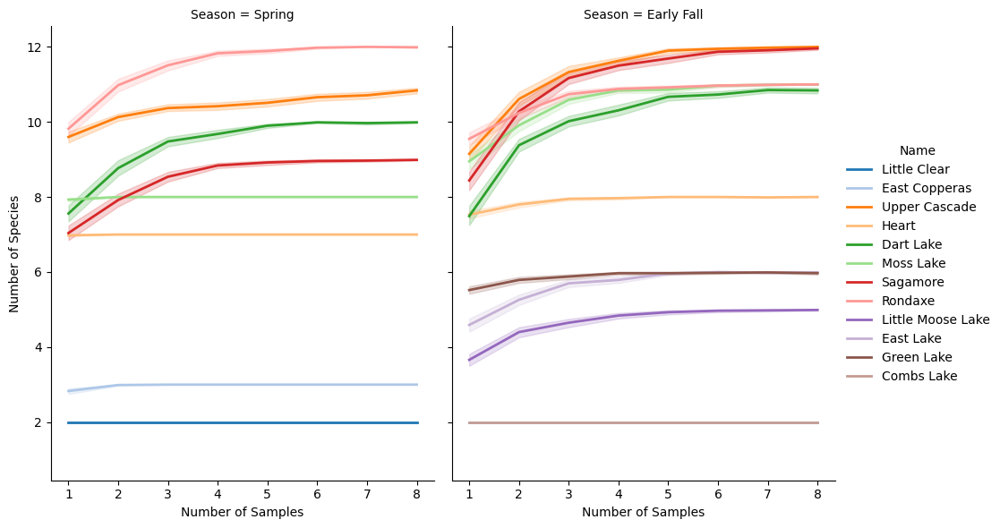

In [126]:
g = sns.FacetGrid(accumulation_curves[accumulation_curves["Number of Samples"] <= 8].reset_index(drop=True),
                  col="Season", hue = "Name", palette = "tab20", height=6, aspect=0.8)

# Map a scatterplot to the grid
g.map_dataframe(sns.lineplot, x = "Number of Samples", y = "Number of Species", lw = 2)
g.add_legend()
#plt.savefig("../accumulation_plot_15samps.pdf", dpi = 300, bbox_inches='tight')

In [127]:
fakedataset = pd.DataFrame()
lakes = [i for i in metadata["Name"].unique().tolist() if "Blank" not in i]
for lake in lakes:
    fakelake = pd.DataFrame()
    for season in ["Spring", "Early Fall"]:
        for i in distinct:
            fakehabitat = pd.DataFrame()
            for iteration in range(0,subsamples):
                try:
                    fakesample = combination[random.choices((metadata["EGCF-ID"]
                            [metadata["Name"] == lake]
                            [metadata["Season"] == season]
                            [metadata["Description"].isin(i)].tolist()), 
                           k = 13)].sum(axis=1)
                    fakesample = pd.DataFrame(data = [fakesample]).T
                    fakesample.columns = [lake + "_" + season + "_" + "".join(i) + "_" + str(iteration)]
                    fakehabitat = pd.concat([fakehabitat, fakesample], axis = 1)
                except:
                    pass
            fakelake = pd.concat([fakelake, fakehabitat], axis = 1)
    fakedataset = pd.concat([fakedataset, fakelake], axis = 1)

In [128]:
fakemetadata = pd.DataFrame(data = fakedataset.columns, columns = ["EGCF-ID"])
fakemetadata["Name"] = fakemetadata["EGCF-ID"].str.split("_", expand = True)[0]
fakemetadata["Season"] = fakemetadata["EGCF-ID"].str.split("_", expand = True)[1]
fakemetadata["Habitat"] = fakemetadata["EGCF-ID"].str.split("_", expand = True)[2]
fakemetadata["Merged"] = fakemetadata["Name"] + "_" + fakemetadata["Season"]

In [ ]:
accumulation_curves = pd.DataFrame()
for merge in fakemetadata["Merged"].unique().tolist():
    lake = merge.split("_")[0]
    season = merge.split("_")[1]
    tmp = fakedataset.reset_index(drop=False)
    tmp = tmp[fakemetadata["EGCF-ID"][fakemetadata["Merged"] == merge].tolist() + ["Overall_Best"]]
    tmp['sum'] = tmp.sum(axis=1, numeric_only=True)
    tmp = tmp[tmp["sum"] > 0].reset_index(drop=True)
    tmp = tmp.set_index("Overall_Best").T.reset_index(drop=False)
    tmp = tmp[tmp.columns[1:]]
    shuffles = []
    for shuff in list(range(0,100)):
        tmp1 = tmp.copy()
        for tax in tmp.columns:
            tmp1[tax] = np.random.permutation(tmp[tax].values)
        for nsamps in list(range(1, len(tmp))):
            shuffles = shuffles + [[tmp1.sample(nsamps).agg({'sum'}).astype(bool).sum(axis=1).reset_index(drop=True)[0], nsamps]]
    shuffles = pd.DataFrame(shuffles, columns = ["Number of Species", "Number of Samples"])
    shuffles["Name"] = lake
    shuffles["Season"] = season
    accumulation_curves = pd.concat([accumulation_curves, shuffles]).reset_index(drop=True)

In [ ]:
g = sns.FacetGrid(accumulation_curves[accumulation_curves["Number of Samples"] <= 8].reset_index(drop=True),
                  col="Season", hue = "Name", palette = "tab20", height=6, aspect=0.8)

# Map a scatterplot to the grid
g.map_dataframe(sns.lineplot, x = "Number of Samples", y = "Number of Species", lw = 2)
g.add_legend()
#plt.savefig("../accumulation_plot_15samps.pdf", dpi = 300, bbox_inches='tight')

All of these asymptote by 5. This means that we should be able to get the same number of species in 15, 150mL samples in 5 samples if we switch the volume to 2L.

In [36]:
# Function to calculate RSS
def calculate_rss(y_data, y_model):
    return np.sum((y_data - y_model) ** 2)

# 1. Michaelis-Menten model (Basic)
def michaelis_menten(x, K, C, B):
    return (K * x) / (x + C)

# 2. Hill function model
def hill_function(x, K, C, n):
    return (K * x**n) / (C**n + x**n)

# 3. Generalized Logistic model
def generalized_logistic(x, K, B, C):
    return K / (1 + np.exp(-B * (x - C)))

# 4. Logistic Growth (Standard S-shaped curve)
def logistic_growth(x, K, r, x0):
    return K / (1 + np.exp(-r * (x - x0)))

# 5. Richards Curve (generalized logistic curve)
def richards(x, K, r, x0, v):
    return K / (1 + np.exp(-r * (x - x0)))**(1/v)

# 6. Gompertz Curve (asymptotic curve)
def gompertz(x, K, r, x0):
    return K * np.exp(-np.exp(-r * (x - x0)))

# 7. Exponential Decay (Inverted)
def exp_decay(x, A, B, C):
    return A * np.exp(-B * (x - C))

# 8. Shifted Logistic Growth (shifted S-curve)
def shifted_logistic(x, K, r, x0):
    return K / (1 + np.exp(-r * (x - x0)))

# 9. Exponential Growth Model (inverse of decay)
def exp_growth(x, A, r, C):
    return A * np.exp(r * (x - C))

# 10. Monod Equation (a variant of Michaelis-Menten)
def monod(x, K, S, B):
    return (K * x) / (S + x)

# 11. Humboldt Growth Curve (another biological growth model)
def humboldt_growth(x, K, r, x0):
    return K / (1 + np.exp(-r * (x - x0)))

# 12. Barton Curve (used in environmental sciences)
def barton_curve(x, A, B, C):
    return A / (1 + np.exp(-B * (x - C)))

models = {
    "Michaelis-Menten": michaelis_menten,
    "Hill": hill_function,
    "Generalized Logistic": generalized_logistic,
    "Logistic Growth": logistic_growth,
    "Richards": richards,
    "Gompertz": gompertz,
    "Exponential Decay": exp_decay,
    "Shifted Logistic": shifted_logistic,
    "Exponential Growth": exp_growth,
    "Monod": monod,
    "Humboldt Growth": humboldt_growth,
    "Barton Curve": barton_curve
}

# Initial parameter guesses for each model
initial_guesses = {
    "Michaelis-Menten": [50, 10, 2],
    "Hill": [50, 20, 2],
    "Generalized Logistic": [50, 0.1, 20],
    "Logistic Growth": [50, 0.1, 20],
    "Richards": [50, 0.1, 20, 1],
    "Gompertz": [50, 0.1, 20],
    "Exponential Decay": [50, 0.1, 10],
    "Shifted Logistic": [50, 0.1, 20],
    "Exponential Growth": [50, 0.1, 10],
    "Monod": [50, 20, 0.1],
    "Humboldt Growth": [50, 0.1, 20],
    "Barton Curve": [50, 0.1, 20]
}

model_bounds = {
    "Michaelis-Menten": ([0, -np.inf, -np.inf], [80, np.inf, np.inf]),
    "Hill": ([0, -np.inf, -np.inf], [80, np.inf, np.inf]),
    "Generalized Logistic": ([0, -np.inf, -np.inf], [80, np.inf, np.inf]),
    "Logistic Growth": ([0, -np.inf, -np.inf], [80, np.inf, np.inf]),
    "Richards": ([0, -np.inf, -np.inf, -np.inf], [80, np.inf, np.inf, np.inf]),
    "Gompertz": ([0, -np.inf, -np.inf], [80, np.inf, np.inf]),
    "Exponential Decay": ([0, -np.inf, -np.inf], [80, np.inf, np.inf]),
    "Shifted Logistic": ([0, -np.inf, -np.inf], [80, np.inf, np.inf]),
    "Exponential Growth": ([0, -np.inf, -np.inf], [80, np.inf, np.inf]),
    "Monod": ([0, -np.inf, -np.inf], [80, np.inf, np.inf]),
    "Humboldt Growth": ([0, -np.inf, -np.inf], [80, np.inf, np.inf]),
    "Barton Curve": ([0, -np.inf, -np.inf], [80, np.inf, np.inf])
}

In [83]:
metadata = pd.read_csv("../master_metadata.csv")
metadata.loc[metadata["Site"] == "Blank", "Name"] = "Field Blank"
metadata.loc[metadata["Site"] == "Extraction Blank", "Name"] = "Extraction Blank"
metadata.loc[metadata["Site"] == "PCR Blank", "Name"] = "PCR Blank"
metadata = metadata[metadata["EGCF-ID"].notna()].reset_index(drop=True)
metadata["Merged"] = metadata["Name"] + "_" + metadata["Season"]

In [84]:
lakes = metadata[metadata["Merged"].notna()].reset_index(drop=True)
lakes = lakes["Merged"][~lakes["Merged"].str.contains("Blank")].unique().tolist()

In [85]:
accumulation_curves = pd.read_csv("../accumulation_curves_outlier_removed.csv")

In [86]:
best_models_by_lake = {}
fitted_data = pd.DataFrame()
for lake in lakes:
    # Store results
    best_rss = np.inf
    best_curve = None
    best_params = None
    best_y_fit = None
    
    rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]
           [accumulation_curves["Season"] == lake.split("_")[1]])
    rawdata = rawdata.groupby(["Name", "Season", "Number of Samples"]).mean().reset_index()
    x_data = np.append([0], np.array(rawdata["Number of Samples"]))
    y_data = np.append([0], np.array(rawdata["Number of Species"]))

    # Try fitting each curve type
    for curve_name in list(models.keys()):
        try:
            # Fit the curve
            popt, _ = curve_fit(models[curve_name], x_data, y_data, 
                                p0=initial_guesses[curve_name], 
                                bounds=model_bounds[curve_name],
                                maxfev=50000)

            # Calculate the fitted values
            y_fit = models[curve_name](x_data, *popt)

            # Calculate RSS
            rss = calculate_rss(y_data, y_fit)

            # Store the best model
            if rss < best_rss:
                best_rss = rss
                best_curve = curve_name
                best_params = popt
                best_y_fit = y_fit

            #print(f"Curve: {curve_name}, RSS: {rss}")

        except Exception as e:
            print(f"Error fitting {curve_name}: {e}")

    x_fit = np.linspace(min(x_data), max(x_data) + 1000, 1000)
    y_fit = models[best_curve](x_fit, *best_params)

    # Output best model and parameters
    print(f"\nBest curve: {best_curve}")
    print(f"Best parameters: {best_params}")
    print(f"Best RSS: {best_rss}")
    
    best_models_by_lake[lake] = [best_curve, best_params, best_rss]
    tmp = pd.DataFrame()
    tmp["Number of Samples"] = x_fit
    tmp["Number of Species"] = y_fit
    tmp["Name"] = lake.split("_")[0]
    tmp["Season"] = lake.split("_")[1]
    fitted_data = pd.concat([fitted_data, tmp]).reset_index(drop=True)

/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]
/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]



Best curve: Hill
Best parameters: [2.0490319  0.49279308 1.31470121]
Best RSS: 0.004563990086006248

Best curve: Hill
Best parameters: [2.14872841 0.58661195 1.0063491 ]
Best RSS: 0.006990410172337877


/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]
/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]



Best curve: Hill
Best parameters: [1.74989217e+01 3.79029590e+02 3.67781456e-01]
Best RSS: 0.0033094195191570243

Best curve: Hill
Best parameters: [8.00000000e+01 1.07710525e+04 4.58599135e-01]
Best RSS: 0.04254137782296014


/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]
/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3696820392.py:11: RuntimeWarning: divide by zero encountered in power
  return (K * x**n) / (C**n + x**n)
/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3696820392.py:11: RuntimeWarning: invalid value encountered in divide
  return (K * x**n) / (C**n + x**n)
/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]
/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3696820392.py:11: RuntimeWarning: divide by zero encountered in power
  return (K * x**n) / (C**n + x**n)
/fs/s6


Best curve: Hill
Best parameters: [12.46498895  1.55060439  0.95501166]
Best RSS: 0.009554280487418115

Best curve: Hill
Best parameters: [16.51964445  3.07843418  0.84066772]
Best RSS: 0.033357235775555


/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]
/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3696820392.py:11: RuntimeWarning: divide by zero encountered in power
  return (K * x**n) / (C**n + x**n)
/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3696820392.py:11: RuntimeWarning: invalid value encountered in divide
  return (K * x**n) / (C**n + x**n)
/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]
/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3696820392.py:11: RuntimeWarning: divide by zero encountered in power
  return (K * x**n) / (C**n + x**n)
/fs/s6


Best curve: Hill
Best parameters: [9.4252298  0.73930499 0.6107601 ]
Best RSS: 0.006051892843972282

Best curve: Hill
Best parameters: [8.17682483 0.87063768 1.59490098]
Best RSS: 0.01966680692010693


/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]
/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3696820392.py:11: RuntimeWarning: divide by zero encountered in power
  return (K * x**n) / (C**n + x**n)
/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3696820392.py:11: RuntimeWarning: invalid value encountered in divide
  return (K * x**n) / (C**n + x**n)
/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]



Best curve: Hill
Best parameters: [13.54391399  2.46461235  0.82869092]
Best RSS: 0.015345586346130034

Best curve: Hill
Best parameters: [15.43699887  6.24797326  0.74802983]
Best RSS: 0.3039968284341316


/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]
/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3696820392.py:11: RuntimeWarning: divide by zero encountered in power
  return (K * x**n) / (C**n + x**n)
/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3696820392.py:11: RuntimeWarning: invalid value encountered in divide
  return (K * x**n) / (C**n + x**n)
/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]
/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3696820392.py:11: RuntimeWarning: divide by zero encountered in power
  return (K * x**n) / (C**n + x**n)
/fs/s6


Best curve: Hill
Best parameters: [14.76196129  4.73140162  0.75426842]
Best RSS: 0.013321544509648838

Best curve: Hill
Best parameters: [17.49826656  6.03029598  0.65809764]
Best RSS: 0.027136722051786983


/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]
/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]
/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3696820392.py:11: RuntimeWarning: divide by zero encountered in power
  return (K * x**n) / (C**n + x**n)
/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3696820392.py:11: RuntimeWarning: invalid value encountered in divide
  return (K * x**n) / (C**n + x**n)



Best curve: Hill
Best parameters: [13.13981791  2.76138404  0.94448925]
Best RSS: 0.0516026973497503

Best curve: Hill
Best parameters: [9.89066465 1.56485275 1.28484088]
Best RSS: 0.08364136947626186


/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]
/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3696820392.py:11: RuntimeWarning: divide by zero encountered in power
  return (K * x**n) / (C**n + x**n)
/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3696820392.py:11: RuntimeWarning: invalid value encountered in divide
  return (K * x**n) / (C**n + x**n)
/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]
/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3696820392.py:11: RuntimeWarning: divide by zero encountered in power
  return (K * x**n) / (C**n + x**n)
/fs/s6


Best curve: Hill
Best parameters: [30.04411316 18.60890671  0.4790068 ]
Best RSS: 0.11796581573336332

Best curve: Hill
Best parameters: [12.73521694  0.93121894  0.66299468]
Best RSS: 0.014093601763187268


/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]
/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]



Best curve: Hill
Best parameters: [8.00000000e+01 9.42889009e+04 2.98474791e-01]
Best RSS: 0.009229510256029645

Best curve: Hill
Best parameters: [6.26749855 1.08049207 1.41861249]
Best RSS: 0.07203789081303963


/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]
/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3696820392.py:11: RuntimeWarning: divide by zero encountered in power
  return (K * x**n) / (C**n + x**n)
/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3696820392.py:11: RuntimeWarning: invalid value encountered in divide
  return (K * x**n) / (C**n + x**n)
/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]
/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3696820392.py:11: RuntimeWarning: divide by zero encountered in power
  return (K * x**n) / (C**n + x**n)
/fs/s6


Best curve: Hill
Best parameters: [6.19913278 0.59719854 0.91092905]
Best RSS: 0.036262604302969376

Best curve: Generalized Logistic
Best parameters: [ 2.         48.05963509  0.49434507]
Best RSS: 1.2256923446780371e-20


In [87]:
fitted_data = pd.read_csv("../fitted_data_outlier_removed.csv")

In [88]:
best_models = pd.DataFrame(best_models_by_lake).T.reset_index(drop=False)
best_models.columns = ["Lake", "Function", "Parameters", "RSS"]

In [89]:
best_models = pd.read_csv("../fitted_curves_outlier_removed.csv")

In [90]:
plotting_accumulation = accumulation_curves.groupby(["Name", "Season", "Number of Samples"]).mean().reset_index()

In [91]:
all_lakes = metadata["Name"].unique()
all_lakes = [i for i in all_lakes if i not in ["PCR Blank", "Extraction Blank", "Field Blank", np.nan]]

In [92]:
asymptote = pd.DataFrame()
for i in all_lakes:
    for season in ["Early Fall", "Spring"]:
        try:
            if ((fitted_data["Number of Species"]
                  [fitted_data["Name"] == i]
                  [fitted_data["Season"] == season]
                  [fitted_data["Number of Samples"] > 16]).reset_index(drop=True).head(1)[0] 
                 > (best_models_by_lake[i + "_" + season][1][0] * 0.9)*0.75):
                #if best_models_by_lake[i + "_" + season][0] in ["Hill",'Michaelis-Menten']:
                tmp = (fitted_data
                 [fitted_data["Name"] == i]
                 [fitted_data["Season"] == season]
                 [fitted_data["Number of Species"] > (best_models_by_lake[i + "_" + season][1][0] * 0.9)]
                 .reset_index(drop=True).head(1))
                asymptote = pd.concat([asymptote, tmp]).reset_index(drop=True)
        except:
            pass
asymptote["2L_scaled"] = asymptote["Number of Samples"] / 3
asymptote.loc[asymptote["2L_scaled"] < 1, "2L_scaled"] = 1
# ---- Sample Data (Replace with yours) ----
x_data = np.array(asymptote["Number of Species"])
y_data = np.array(asymptote["2L_scaled"])  # Replace with your actual data

/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/47130350.py:11: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  tmp = (fitted_data
/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/47130350.py:11: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  tmp = (fitted_data
/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/47130350.py:11: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  tmp = (fitted_data
/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/47130350.py:11: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  tmp = (fitted_data
/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/47130350.py:11: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  tmp = (fitted_data
/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/47130350.py:11: UserWarning: Boolean Series key wil

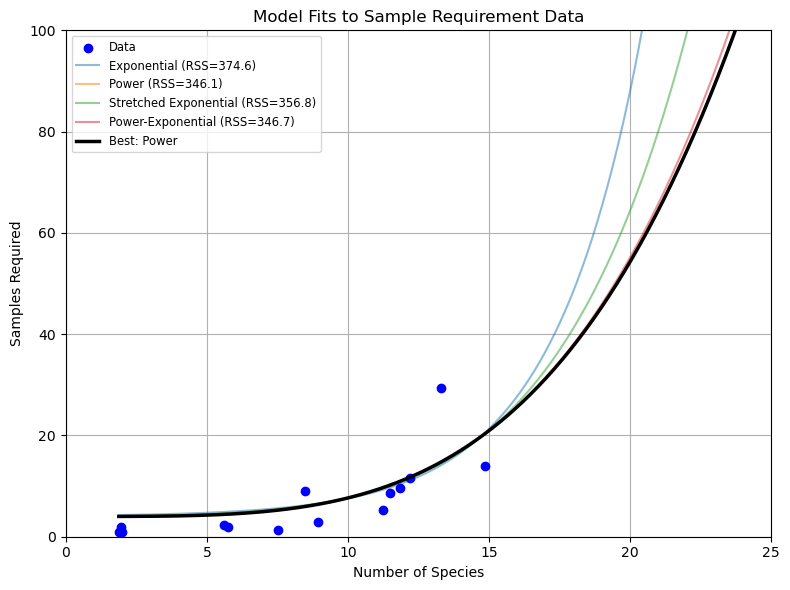

In [93]:
def exp(x, a, b):
    return a * np.exp(b * x) + 4

def power(x, a, b):
    return a * x ** b + 4

def stretched_exp(x, a, b, p):
    return a * np.exp((x / b) ** p) + 4

def exp_power(x, a, b, p):
    return a * x ** p * np.exp(b * x) + 4

functions = [
    (exp, "Exponential", [0.5, 0.2], ([0, 0], [10, 1])),
    (power, "Power", [0.5, 1.5], ([0, 0], [10, 10])),
    (stretched_exp, "Stretched Exponential", [1, 5, 1], ([0, 0.1, 0.1], [100, 50, 5])),
    (exp_power, "Power-Exponential", [0.1, 0.05, 1], ([0, 0.01, 0.1], [10, 0.5, 5]))
]

# Fit each model and calculate RSS
results = []
x_fit = np.linspace(min(x_data), max(x_data) + 10, 500)

for func, name, p0, bounds in functions:
    try:
        popt, _ = curve_fit(func, x_data, y_data, p0=p0, bounds=bounds)
        y_pred = func(x_data, *popt)
        rss = np.sum((y_data - y_pred) ** 2)

        # Check for monotonicity
        if np.all(np.diff(func(x_fit, *popt)) >= 0):  # strictly increasing
            results.append((name, func, popt, rss))
        else:
            print(f"Rejected {name}: not monotonic")
    except Exception as e:
        print(f"Failed to fit {name}: {e}")
        results.append((name, func, None, np.inf))
        
# Find best fit
best_model = min(results, key=lambda x: x[3])
best_name, best_func, best_params, best_rss = best_model

# Plot all models
plt.figure(figsize=(8, 6))
plt.scatter(x_data, y_data, color='blue', label='Data', zorder=10)

for name, func, popt, rss in results:
    if popt is not None and rss < np.inf:
        y_curve = func(x_fit, *popt)
        plt.plot(x_fit, y_curve, label=f"{name} (RSS={rss:.1f})", alpha=0.5)

# Highlight best fit
y_best = best_func(x_fit, *best_params)
plt.plot(x_fit, y_best, color='black', linewidth=2.5, label=f"Best: {best_name}", zorder=15)

plt.xlabel("Number of Species")
plt.ylabel("Samples Required")
plt.title("Model Fits to Sample Requirement Data")
plt.legend(fontsize='small', loc='upper left')
plt.grid(True)
plt.ylim(0,100)
plt.xlim(0,25)
plt.tight_layout()
plt.show()

In [94]:
scalelakes["2L_Samples_Required"] = np.nan
scalelakes["2L_Samples_Required0.8"] = np.nan
for i in range(len(scalelakes)):
    #scalelakes["2L_Samples_Required"][i] = generalized_logistic([scalelakes["Fish_Richness"][i]], *params).round(0)
    scalelakes["2L_Samples_Required"][i] = np.ceil(best_func(scalelakes["Fish_Richness"][i], *best_params))
    scalelakes["2L_Samples_Required0.8"][i] = np.ceil(best_func(scalelakes["Fish_Richness"][i]*0.8, *best_params))

/fs/s6k/fast/scratch/9343966_noge4093_mpcs047/ipykernel_1474522/3398277859.py:5: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  scalelakes["2L_Samples_Required"][i] = np.ceil(best_func(scalelakes["Fish_Richness"][i], *best_params))
/fs/s6k/fa

In [95]:
y1 = pd.read_csv("../SCALE_year1_LakeList.csv")

In [96]:
y1.columns = ["intensity", "nhdid", "lat", "long", "PONDNAME", "PONDNO"]

In [97]:
y1intense = y1[y1["intensity"] != "low year 1"].reset_index(drop=True)
y1low = y1[y1["intensity"] == "low year 1"].reset_index(drop=True)

In [98]:
y1low = pd.read_csv("../Low Priority Lake List for PCP app.csv")

In [99]:
scalelakes["nhdid"] = scalelakes["nhdid"].astype(str)
y1low["nhdid"] = y1low["nhdid"].astype(str)
y1intense["nhdid"] = y1intense["nhdid"].astype(str)

In [100]:
scalelakes = scalelakes.drop_duplicates(["nhdid", "PONDNAME"]).reset_index(drop=True)

In [101]:
y1low = y1low[["nhdid", "PONDNAME", "ALSC PONDNO"]].merge(scalelakes, on = ["nhdid", "PONDNAME"], how = "left")
y1intense = y1intense[["nhdid", "PONDNAME", "intensity", "PONDNO"]].merge(scalelakes, on = ["nhdid", "PONDNAME"], how = "left")

In [102]:
y1low["joined"] = y1low["nhdid"].astype(str) + y1low["PONDNAME"].astype(str)
y1intense["joined"] = y1intense["nhdid"].astype(str) + y1intense["PONDNAME"].astype(str)
scalelakes["joined"] = scalelakes["nhdid"].astype(str) + scalelakes["PONDNAME"].astype(str)

In [105]:
y1low["Floor"] = y1low["2L_Samples_Required"]
y1intense["Floor"] = y1intense["2L_Samples_Required"]
print(np.floor((1400 - 
                       len(y1low) - 
                       sum(y1low["Floor"]) -
                       (len(y1intense[y1intense["intensity"] == "high year 1"]) * 3) -
                       (sum(y1intense["Floor"][y1intense["intensity"] == "high year 1"]) * 3)) 
                      / (y1intense["Floor"][y1intense["intensity"] == "high 3 year"].sum() +
                         len(y1intense[y1intense["intensity"] == "high 3 year"]))))

10.0


In [84]:
y1low["Floor"] = y1low["2L_Samples_Required"]
y1intense["Floor"] = y1intense["2L_Samples_Required"]
print(np.floor((1400 - 
                       len(y1low) - 
                       sum(y1low["Floor"]) -
                       (len(y1intense[y1intense["intensity"] == "high year 1"]) * 3) -
                       (sum(y1intense["Floor"][y1intense["intensity"] == "high year 1"]) * 3)) 
                      / (y1intense["Floor"][y1intense["intensity"] == "high 3 year"].sum() +
                         len(y1intense[y1intense["intensity"] == "high 3 year"]))))

6.0


In [110]:
(y1low["Floor"].sum() + len(y1low))*3 + (4 * (y1intense["Floor"].sum() + len(y1intense)))

1014.0

In [ ]:
y1low["Floor"].sum() + len(y1low)

In [107]:
scalelakes.to_csv("../sample_requirements_all_candidates.csv", sep = ",", index = False)

In [99]:
y1 = pd.concat([y1intense, y1low]).reset_index(drop=True)
y1["intensity"] = y1["intensity"].fillna("low")
y1.to_csv("../sample_requirements_y1.csv", sep = ",", index = False)

In [106]:
y1 = pd.concat([y1intense, y1low]).reset_index(drop=True)
y1["intensity"] = y1["intensity"].fillna("low")
y1.to_csv("../sample_requirements_PCP_app.csv", sep = ",", index = False)

In [790]:
1400 -len(y1low) - sum(y1low["Floor"]) - (len(y1intense[y1intense["intensity"] == "high year 1"]) * 3) - (sum(y1intense["Floor"][y1intense["intensity"] == "high year 1"]) * 3)

347.0

In [791]:
(y1intense["Floor"][y1intense["intensity"] == "high 3 year"].sum() +
                         len(y1intense[y1intense["intensity"] == "high 3 year"])) * 5

365.0

In [613]:
lakemeta = pd.read_csv("../lake_metadata.csv")

In [614]:
asymptote = asymptote.merge(lakemeta[["Name", "surface_area (ha)"]], how = "left", on = "Name")

In [442]:
y1low["LAT_NHD"][81]

44.6479031

In [615]:
scalelakes[scalelakes["PONDNAME"] == "LAKE GEORGE"]

,nhdid,PONDNO,PONDNAME,LAKETYPE,OWN,ELEV,WAREA,SAREA,MAXDEPTH,HU8NAME,...,LONG_NHD,HIGH_INT,ACCESS,NOTES,Pond #,Fish_Richness,ALS_Richness,SAC_Richness,2L_Samples_Required,joined
427,92083789,NaN,LAKE GEORGE,NaN,NaN,66.079727,60347.0,11536.6,60.0,NaN,...,43.60192,1.0,NaN,NaN,NaN,20.0,NaN,20.0,71.0,92083789LAKE GEORGE


In [502]:
y1low

,nhdid,PONDNAME,PONDNO_x,PONDNO_y,LAKETYPE,OWN,ELEV,WAREA,SAREA,MAXDEPTH,...,HIGH_INT,ACCESS,NOTES,Pond #,Fish_Richness,ALS_Richness,SAC_Richness,2L_Samples_Required,joined,Floor
0,132859738,CRANBERRY POND,30314,030314,Flow seepage,Public,302.0,299.9,8.1,1.1,...,0.0,NaN,NaN,030314,4.0,4.0,4.0,2.0,132859738CRANBERRY POND,4.0
1,132876224,FISHPOLE POND,30033,030033,Salt impacted,Private,450.0,44.8,1.5,1.5,...,0.0,NaN,NaN,030033,4.0,4.0,3.0,2.0,132876224FISHPOLE POND,4.0
2,132876070,BRADLEY POND,30007,030007,Salt impacted,Private,501.0,1655.6,44.2,3.4,...,0.0,EASY,NaN,030007,8.0,8.0,7.0,4.0,132876070BRADLEY POND,6.0
3,115353641,DOYLE POND,020309B,0020309B,Carbonate influenced,Private,262.0,336.1,3.6,4.0,...,0.0,NaN,NaN,0020309B,4.0,4.0,3.0,2.0,115353641DOYLE POND,4.0
4,131845700,NICKS LAKE,40804,040804,Salt impacted,Public,519.0,1052.9,84.4,5.2,...,2.0,NaN,NaN,040804,8.0,5.0,8.0,4.0,131845700NICKS LAKE,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,135271439,MIKES POND,030268A,030268A,Mounded seepage low DOC,Public,497.0,2.4,0.5,10.4,...,0.0,MODERATE,Coordinates off. 3 Possible ponds with moderat...,030268A,2.0,0.0,2.0,2.0,135271439MIKES POND,4.0
96,133099147,GRASSY POND,40366,040366,Thick till drainage low DOC,Public,611.0,411.2,11.7,7.9,...,0.0,DIFFICULT,NaN,040366,5.0,0.0,5.0,2.0,133099147GRASSY POND,4.0
97,92083457,JABE POND,20394,020394,Carbonate influenced,Public,400.0,230.4,59.8,22.9,...,2.0,NaN,NaN,020394,7.0,3.0,7.0,3.0,92083457JABE POND,5.0
98,132859280,GRASS RIVER FLOW,30366,030366,Salt impacted,Private,460.0,11762.7,14.2,2.4,...,0.0,EASY,Need private access,030366,8.0,8.0,5.0,4.0,132859280GRASS RIVER FLOW,6.0


In [440]:
y1low[y1low["Fish_Richness"] == 8].sort_values("Floor")

,nhdid,PONDNAME,PONDNO_x,PONDNO_y,LAKETYPE,OWN,ELEV,WAREA,SAREA,MAXDEPTH,...,LONG_NHD,HIGH_INT,ACCESS,NOTES,Pond #,Fish_Richness,Richness_Estimate_Source,2L_Samples_Required,joined,Floor
2,132876070,BRADLEY POND,30007,030007,Salt impacted,Private,501.0,1655.6,44.2,3.4,...,-73.887708,0.0,EASY,NaN,030007,8.0,ALS Catch,5.0,132876070BRADLEY POND,7.0
8,129691154,SQUARE POND,20125,020125,Flow seepage,Public,480.0,427.3,58.0,16.8,...,-74.369680,2.0,NaN,NaN,020125,8.0,ALS Catch,5.0,129691154SQUARE POND,7.0
9,129691020,FOLLENSBY CLEAR POND,20116,020116,Salt impacted,Public,480.0,1029.1,195.5,18.3,...,-74.347036,2.0,NaN,NaN,020116,8.0,ALS Catch,5.0,129691020FOLLENSBY CLEAR POND,7.0
34,135271075,BEAVER VALLEY POND,30201,030201,Medium till drainage,Mixed,503.0,63.5,4.4,1.8,...,-74.252209,0.0,NaN,NaN,030201,8.0,ALS Catch,5.0,135271075BEAVER VALLEY POND,7.0
79,132876535,RAGGED LAKE,30058,030058,Thick till drainage,Private,528.0,3108.7,110.1,15.2,...,-74.069241,0.0,NaN,NaN,030058,8.0,ALS Catch,5.0,132876535RAGGED LAKE,7.0
98,132859280,GRASS RIVER FLOW,30366,030366,Salt impacted,Private,460.0,11762.7,14.2,2.4,...,-74.730070,0.0,EASY,Need private access,030366,8.0,ALS Catch,5.0,132859280GRASS RIVER FLOW,7.0


In [399]:
y1low["Floor"] = y1low["2L_Samples_Required"].clip(lower=2).copy() + 4
y1intense["Floor"] = y1intense["2L_Samples_Required"].clip(lower=4)
print(np.floor((1400 - 
                       len(y1low) - 
                       sum(y1low["Floor"]) -
                       (len(y1intense[y1intense["intensity"] == "high year 1"]) * 3) -
                       (sum(y1intense["Floor"][y1intense["intensity"] == "high year 1"]) * 3)) 
                      / (y1intense["Floor"][y1intense["intensity"] == "high 3 year"].sum() +
                         len(y1intense[y1intense["intensity"] == "high 3 year"]))))

4.0


In [108]:
y1low["Floor"] = y1low["2L_Samples_Required"].clip(lower=2).copy() + 4
y1intense["Floor"] = y1intense["2L_Samples_Required"].clip(lower=4)
print(np.floor((1400 - 
                       len(y1low) - 
                       sum(y1low["Floor"]) -
                       (len(y1intense[y1intense["intensity"] == "high year 1"]) * 3) -
                       (sum(y1intense["Floor"][y1intense["intensity"] == "high year 1"]) * 3)) 
                      / (y1intense["Floor"][y1intense["intensity"] == "high 3 year"].sum() +
                         len(y1intense[y1intense["intensity"] == "high 3 year"]))))

5.0


In [104]:
y1low["Floor"] = y1low["2L_Samples_Required"].clip(lower=6).copy()
y1intense["Floor"] = y1intense["2L_Samples_Required"].clip(lower=4)
print(np.floor((1400 - 
                       len(y1low) - 
                       sum(y1low["Floor"]) -
                       (len(y1intense[y1intense["intensity"] == "high year 1"]) * 3) -
                       (sum(y1intense["Floor"][y1intense["intensity"] == "high year 1"]) * 3)) 
                      / (y1intense["Floor"][y1intense["intensity"] == "high 3 year"].sum() +
                         len(y1intense[y1intense["intensity"] == "high 3 year"]))))

6.0


In [105]:
y1low["2L_Samples_Required"].clip(lower=6).copy().sum()

731.0

In [106]:
(y1low["2L_Samples_Required"].clip(lower=2).copy() + 4).sum()

811.0

In [101]:
y1low["2L_Samples_Required"].clip(lower=2).copy()

0     2.0
1     2.0
2     4.0
3     2.0
4     2.0
     ... 
95    2.0
96    2.0
97    2.0
98    4.0
99    2.0
Name: 2L_Samples_Required, Length: 100, dtype: float64

In [100]:
y1low[["SAREA", "LAT_NHD", "LONG_NHD"]][y1low["Fish_Richness"] == 0].sort_values("SAREA")

,SAREA,LAT_NHD,LONG_NHD
84,0.4,44.750347,-74.187709
95,0.5,44.391290,-74.276270
83,0.7,44.369375,-74.274819
22,0.7,43.628242,-74.749356
29,0.7,44.283136,-74.690687
32,0.8,44.246584,-73.879459
87,0.9,44.008796,-74.858964
19,1.0,43.815789,-75.181744
15,1.1,43.477678,-74.553418
73,1.2,44.314417,-74.384352


In [79]:
y1low["Floor"] = y1low["2L_Samples_Required"].clip(lower=7)
y1intense["Floor"] = y1intense["2L_Samples_Required"].clip(lower=4)
print(np.floor((1400 - 
                       len(y1low) - 
                       sum(y1low["Floor"]) -
                       (len(y1intense[y1intense["intensity"] == "high year 1"]) * 3) -
                       (sum(y1intense["Floor"][y1intense["intensity"] == "high year 1"]) * 3)) 
                      / (y1intense["Floor"][y1intense["intensity"] == "high 3 year"].sum() +
                         len(y1intense[y1intense["intensity"] == "high 3 year"]))))

5.0


In [96]:
for floor in [4, 5, 6, 7, 8]:
    y1low["Floor"] = y1low["2L_Samples_Required"].clip(lower=floor)
    y1intense["Floor"] = y1intense["2L_Samples_Required"].clip(lower=floor)
    print(floor, np.floor((1400 - len(y1low) - sum(y1low["Floor"])) / (y1intense["Floor"].sum() + len(y1intense))))

4 6.0
5 4.0
6 3.0
7 2.0
8 2.0


In [95]:
for floor in [4, 5, 6, 7, 8]:
    y1low["Floor"] = y1low["2L_Samples_Required"].clip(lower=floor)
    y1intense["Floor"] = y1intense["2L_Samples_Required"].clip(lower=floor)
    print(floor, np.floor((1400 - 
                           len(y1low) - 
                           sum(y1low["Floor"]) -
                           (len(y1intense[y1intense["intensity"] == "high year 1"]) * 1) -
                           (sum(y1intense["Floor"][y1intense["intensity"] == "high year 1"]) * 1) -
                          (sum(y1intense["Floor"][y1intense["intensity"] == "high 3 year"]) * 1)) 
                          / ((y1intense["Floor"][y1intense["intensity"] == "high 3 year"].sum()*(4/3)) +
                             len(y1intense[y1intense["intensity"] == "high 3 year"]))))

4 8.0
5 6.0
6 4.0
7 2.0
8 1.0


In [94]:
for floor in [4, 5, 6, 7, 8]:
    y1low["Floor"] = y1low["2L_Samples_Required"].clip(lower=floor)
    y1intense["Floor"] = y1intense["2L_Samples_Required"].clip(lower=floor)
    print(floor, np.floor((1400 - 
                           len(y1low) - 
                           sum(y1low["Floor"]) -
                           (len(y1intense[y1intense["intensity"] == "high year 1"]) * 1) -
                           (sum(y1intense["Floor"][y1intense["intensity"] == "high year 1"]) * 1)) 
                          / ((y1intense["Floor"][y1intense["intensity"] == "high 3 year"].sum()*(3/3)) +
                             len(y1intense[y1intense["intensity"] == "high 3 year"]))))

4 11.0
5 8.0
6 6.0
7 4.0
8 3.0


In [93]:
for floor in [4, 5, 6, 7, 8]:
    y1low["Floor"] = y1low["2L_Samples_Required"].clip(lower=floor)
    y1intense["Floor"] = y1intense["2L_Samples_Required"].clip(lower=floor)
    print(floor, np.floor((1400 - 
                           len(y1low) - 
                           sum(y1low["Floor"]) -
                           (len(y1intense[y1intense["intensity"] == "high year 1"]) * 2) -
                           (sum(y1intense["Floor"][y1intense["intensity"] == "high year 1"]) * 2)) 
                          / (y1intense["Floor"][y1intense["intensity"] == "high 3 year"].sum() +
                             len(y1intense[y1intense["intensity"] == "high 3 year"]))))

4 10.0
5 7.0
6 5.0
7 3.0
8 2.0


In [92]:
for floor in [4, 5, 6, 7, 8]:
    y1low["Floor"] = y1low["2L_Samples_Required"].clip(lower=floor)
    y1intense["Floor"] = y1intense["2L_Samples_Required"].clip(lower=floor)
    print(floor, np.floor((1400 - 
                           len(y1low) - 
                           sum(y1low["Floor"]) -
                           (len(y1intense[y1intense["intensity"] == "high year 1"]) * 3) -
                           (sum(y1intense["Floor"][y1intense["intensity"] == "high year 1"]) * 3)) 
                          / (y1intense["Floor"][y1intense["intensity"] == "high 3 year"].sum() +
                             len(y1intense[y1intense["intensity"] == "high 3 year"]))))

4 9.0
5 6.0
6 4.0
7 2.0
8 1.0


In [91]:
for floor in [4, 5, 6, 7, 8]:
    y1low["Floor"] = y1low["2L_Samples_Required"].clip(lower=floor)
    y1intense["Floor"] = y1intense["2L_Samples_Required"].clip(lower=floor)
    print(floor, np.floor((1400 - 
                           len(y1low) - 
                           sum(y1low["Floor"]) -
                           (len(y1intense[y1intense["intensity"] == "high year 1"]) * 4) -
                           (sum(y1intense["Floor"][y1intense["intensity"] == "high year 1"]) * 4)) 
                          / (y1intense["Floor"][y1intense["intensity"] == "high 3 year"].sum() +
                             len(y1intense[y1intense["intensity"] == "high 3 year"]))))

4 8.0
5 5.0
6 3.0
7 1.0
8 0.0


In [89]:
y1low["joined"] = y1low["nhdid"] + y1low["PONDNAME"]
y1intense["joined"] = y1intense["nhdid"] + y1intense["PONDNAME"]
scalelakes["joined"] = scalelakes["nhdid"] + scalelakes["PONDNAME"]

In [124]:
LG = []
nsamps = []
notdoneyet = (scalelakes[~scalelakes["joined"].isin(y1low["joined"].tolist() + y1intense["joined"].tolist())]).reset_index(drop=True)
for i in range(0,10000):
    randomlow = notdoneyet[notdoneyet["HIGH_INT"] == 0].sample(100).reset_index(drop=True)
    randomlow["Floor"] = randomlow["2L_Samples_Required"].clip(lower=5)
    randomhigh = notdoneyet[notdoneyet["HIGH_INT"] != 0].sample(10).reset_index(drop=True)
    randomhigh["Floor"] = randomhigh["2L_Samples_Required"].clip(lower=5)
    high = y1intense[y1intense["intensity"] == "high 3 year"].copy()
    high["Floor"] = high["2L_Samples_Required"].clip(lower=5)
    nsamps = nsamps + [len(randomlow) + randomlow["Floor"].sum() + 
          (3*(len(randomhigh))) + (3*(randomhigh["Floor"].sum())) + 
          (6*(len(high))) + (6*(high["Floor"].sum()))]
    if "LAKE GEORGE" in randomhigh["PONDNAME"].tolist():
        LG = LG + ["YES"]
    else:
        LG = LG + ["NO"]

In [132]:
notdoneyet.sort_values("SAREA")

,nhdid,PONDNO,PONDNAME,LAKETYPE,OWN,ELEV,WAREA,SAREA,MAXDEPTH,HU8NAME,...,LAT_NHD,LONG_NHD,HIGH_INT,ACCESS,NOTES,Pond #,Fish_Richness,Richness_Estimate_Source,2L_Samples_Required,joined
67,92083133,020327,BULLET POND,Flow seepage,Public,469.000000,16.5,0.3,1.2,Lake Champlain,...,44.123068,-73.723283,0.0,NaN,NaN,020327,0.0,ALS Catch,0.0,92083133BULLET POND
56,115353875,020259,UNNAMED POND,Medium till drainage,Public,685.000000,39.5,0.3,1.8,Ausable River,...,44.241359,-73.883229,0.0,NaN,NaN,020259,1.0,ALS Catch,0.0,115353875UNNAMED POND
133,132859261,030353,EGG POND,Mounded seepage,Private,466.000000,4.5,0.3,1.2,Grass,...,44.263991,-74.769174,0.0,MODERATE,NaN,030353,0.0,ALS Catch,0.0,132859261EGG POND
291,132435382,060125A,UNNAMED POND,Flow seepage high DOC,Private,539.000000,24.1,0.4,5.5,NaN,...,44.084177,-74.526426,0.0,EASY,NaN,060125A,0.0,ALS Catch,0.0,132435382UNNAMED POND
118,135271076,030189,UNNAMED POND,Mounded seepage,Public,476.000000,11.3,0.4,7.0,St. Regis,...,44.503513,-74.293274,0.0,NaN,NaN,030189,0.0,ALS Catch,0.0,135271076UNNAMED POND
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
378,89364675,NaN,SCHROON LAKE,NaN,NaN,246.000000,NaN,1723.0,44.0,NaN,...,43.789692,-73.771163,2.0,EASY,NaN,NaN,14.0,Projected from ALS species-area curve,22.0,89364675SCHROON LAKE
372,{CE57E4DF-187C-4AFB-9523-1D0345861DE0},NaN,INDIAN LAKE,NaN,NaN,503.000000,NaN,1893.0,16.0,NaN,...,43.682041,-74.335379,2.0,EASY,NaN,NaN,15.0,Projected from ALS species-area curve,28.0,{CE57E4DF-187C-4AFB-9523-1D0345861DE0}INDIAN LAKE
355,150563204,NaN,UPPER SARANAC LAKE,NaN,Unk,482.000000,19580.0,1912.0,26.0,Saranac River,...,44.294798,-74.320518,1.0,NaN,NaN,NaN,15.0,Projected from ALS species-area curve,28.0,150563204UPPER SARANAC LAKE
371,133098825,NaN,CRANBERRY LAKE,NaN,NaN,453.000000,NaN,2796.0,9.5,NaN,...,44.168758,-74.831684,2.0,EASY,NaN,NaN,15.0,Projected from ALS species-area curve,28.0,133098825CRANBERRY LAKE


/fs/s6k/fast/scratch/7827652_noge4093_mpcs045/ipykernel_2667389/1817285683.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(nsamps)


<Axes: ylabel='Density'>

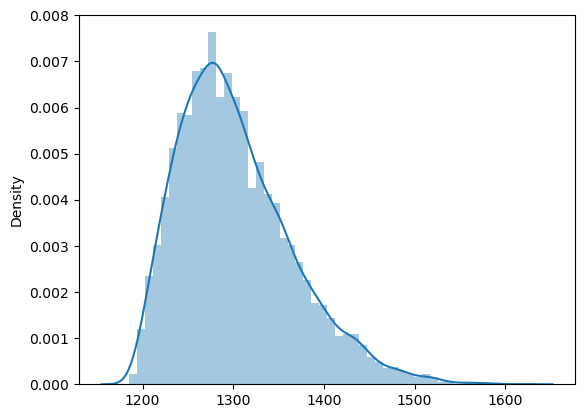

In [126]:
sns.distplot(nsamps)

In [127]:
len = pd.DataFrame(data = [LG, nsamps]).T

In [129]:
len[len[1] < 1500]

,0,1
0,NO,1226.0
1,YES,1386.0
2,NO,1288.0
3,NO,1288.0
4,NO,1300.0
...,...,...
9995,NO,1361.0
9996,YES,1361.0
9997,NO,1232.0
9998,NO,1269.0


In [86]:
nsamps = []
notdoneyet = (scalelakes[~scalelakes["joined"].isin(y1low["joined"].tolist() + y1intense["joined"].tolist())]).reset_index(drop=True)
for i in range(0,20000):
    randomlow = notdoneyet[notdoneyet["HIGH_INT"] == 0].sample(100).reset_index(drop=True)
    randomlow["Floor"] = randomlow["2L_Samples_Required"].clip(lower=5)
    randomhigh = notdoneyet[notdoneyet["HIGH_INT"] != 0].sample(10).reset_index(drop=True)
    randomhigh["Floor"] = randomhigh["2L_Samples_Required"].clip(lower=5)
    nsamps = nsamps + ([((scalelakes["2L_Samples_Required"]
                          [scalelakes["HIGH_INT"] == 0]
                          [~scalelakes["joined"].isin(y1low["joined"])].sample(200).sum())/2 + 
    (scalelakes["2L_Samples_Required"][scalelakes["HIGH_INT"].isin([1,2])]
     [~scalelakes["joined"].isin(y1intense["joined"])].sample(20).sum()*6)/2 + 
    (y1intense["2L_Samples_Required"][y1intense["group"] == 3].sum()*6)) + 220])

In [73]:
notdoneyet = (scalelakes[~scalelakes["joined"].isin(y1low["joined"].tolist() + y1intense["joined"].tolist())]).reset_index(drop=True)

In [77]:
notdoneyet[notdoneyet["HIGH_INT"] != 0].sample(10).reset_index(drop=True)

,nhdid,PONDNO,PONDNAME,LAKETYPE,OWN,ELEV,WAREA,SAREA,MAXDEPTH,HU8NAME,...,LAT_NHD,LONG_NHD,HIGH_INT,ACCESS,NOTES,Pond #,Fish_Richness,Richness_Estimate_Source,2L_Samples_Required,joined
0,132436462,NaN,LOWS LAKE,NaN,NaN,531.000000,NaN,1136.000000,16.8,NaN,...,44.075555,-74.773122,2.0,MODERATE,NaN,NaN,14.0,Projected from ALS species-area curve,22.0,132436462LOWS LAKE
1,131844719,040739,LAKE RONDAXE,Thick till drainage low DOC,Mixed,524.000000,14282.9,90.500000,10.1,NaN,...,43.766959,-74.901492,1.0,EASY,NaN,040739,10.0,ALS Catch,8.0,131844719LAKE RONDAXE
2,89365151,NaN,LOON LAKE,NaN,Unk,264.480011,3363.0,212.471079,10.7,Upper Hudson,...,43.678724,-73.855728,2.0,NaN,NaN,NaN,10.0,Projected from ALS species-area curve,8.0,89365151LOON LAKE
3,129690808,020059,BIG HOPE POND,Thick till drainage high DOC,Public,522.000000,194.2,8.900000,11.5,NaN,...,44.513690,-74.126585,1.0,EASY,NaN,020059,7.0,ALS Catch,3.0,129690808BIG HOPE POND
4,129691060,020180,WHEY POND,Thick till drainage,Public,481.000000,132.9,43.300000,6.1,Saranac River,...,44.307770,-74.392162,2.0,NaN,NaN,020180,4.0,ALS Catch,1.0,129691060WHEY POND
5,129691021,NaN,FLOODWOOD POND,NaN,Unk,480.015892,NaN,94.291800,NaN,Saranac River,...,44.331950,-74.397623,2.0,NaN,Size mined from web searches,NaN,8.0,Projected from ALS species-area curve,4.0,129691021FLOODWOOD POND
6,135271223,030206,JONES POND,Salt impacted,Mixed,504.000000,1131.6,56.600000,2.7,St. Regis,...,44.451757,-74.188994,2.0,NaN,NaN,030206,6.0,ALS Catch,2.0,135271223JONES POND
7,131845587,040706,GRASS POND,Thick till drainage low DOC,Public,546.000000,236.7,5.300000,5.2,NaN,...,43.692495,-75.061361,1.0,MODERATE,NaN,040706,5.0,ALS Catch,2.0,131845587GRASS POND
8,131845828,040874,BROOK TROUT LAKE,Thick till drainage low DOC,Public,722.000000,176.9,28.700000,23.2,NaN,...,43.603269,-74.662731,1.0,DIFFICULT,NaN,040874,0.0,ALS Catch,0.0,131845828BROOK TROUT LAKE
9,47726211,050131A,MINER MILL VLY,Medium till drainage,Private,477.000000,557.7,3.300000,1.8,Sacandaga,...,43.234264,-73.994763,1.0,EASY,NaN,050131A,4.0,ALS Catch,1.0,47726211MINER MILL VLY


In [72]:
(scalelakes[~scalelakes["joined"].isin(y1low["joined"].tolist() + y1intense["joined"].tolist())])

,nhdid,PONDNO,PONDNAME,LAKETYPE,OWN,ELEV,WAREA,SAREA,MAXDEPTH,HU8NAME,...,LAT_NHD,LONG_NHD,HIGH_INT,ACCESS,NOTES,Pond #,Fish_Richness,Richness_Estimate_Source,2L_Samples_Required,joined
0,92080871,020008,MOON POND,Carbonate influenced,Public,411.0,686.8,1.9,2.1,Lake Champlain,...,44.851552,-73.855459,0.0,NaN,NaN,020008,5.0,ALS Catch,2.0,92080871MOON POND
1,129690692,020039,WHISTLE POND,Carbonate influenced,Mixed,431.0,40.2,3.6,3.1,Saranac River,...,44.568648,-73.817681,0.0,NaN,NaN,020039,3.0,ALS Catch,1.0,129690692WHISTLE POND
2,92081613,020040,MUD POND,Thick till drainage,Private,359.0,384.6,7.3,1.2,Lake Champlain,...,44.589174,-73.773102,0.0,NaN,NaN,020040,5.0,ALS Catch,2.0,92081613MUD POND
3,129690712,020042,MUD POND,Carbonate influenced,Mixed,418.0,946.4,44.1,1.5,NaN,...,44.562193,-73.923746,0.0,DIFFICULT,NaN,020042,6.0,ALS Catch,2.0,129690712MUD POND
4,129690762,020046A,LINE POND,Thick till drainage low DOC,Private,511.0,10.0,1.9,10.7,NaN,...,44.544368,-74.080012,0.0,MODERATE,NaN,020046A,0.0,ALS Catch,0.0,129690762LINE POND
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
490,132436462,NaN,LOWS LAKE,NaN,NaN,531.0,NaN,1136.0,16.8,NaN,...,44.075555,-74.773122,2.0,MODERATE,NaN,NaN,14.0,Projected from ALS species-area curve,22.0,132436462LOWS LAKE
491,150563205,NaN,MIDDLE SARANAC LAKE,NaN,NaN,469.0,NaN,573.0,17.1,NaN,...,44.260936,-74.266302,2.0,EASY,NaN,NaN,12.0,Projected from ALS species-area curve,14.0,150563205MIDDLE SARANAC LAKE
492,115353807,NaN,MIRROR LAKE,NaN,NaN,566.0,NaN,50.5,16.8,NaN,...,44.290569,-73.980685,1.0,EASY,NaN,NaN,7.0,Projected from ALS species-area curve,3.0,115353807MIRROR LAKE
493,89363377,NaN,PARADOX LAKE,NaN,NaN,249.0,NaN,378.0,18.5,NaN,...,43.885987,-73.693169,2.0,EASY,NaN,NaN,11.0,Projected from ALS species-area curve,11.0,89363377PARADOX LAKE


In [87]:
np.min(nsamps)

1199.0

In [418]:
np.max(nsamps)

1917.5

In [419]:
np.median(nsamps)

1454.0

<Axes: >

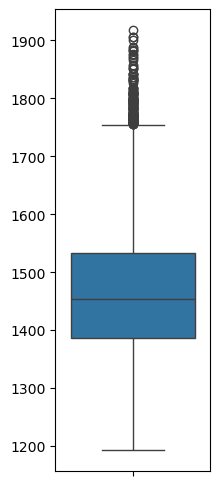

In [420]:
plt.figure(figsize=(2,6))
sns.boxplot(nsamps)

In [195]:
len(y1intense)*6

120

In [196]:
len(y1low)

100

In [198]:
y1low["2L_Samples_Required"].sum()

595.0

In [202]:
(y1intense["2L_Samples_Required"].sum())

100.0

In [421]:
(y1intense["2L_Samples_Required"].sum()*6) + y1low["2L_Samples_Required"].sum() + (len(y1intense)*6) + len(y1low)

1407.0

In [427]:
scalelakes["HIGH_INT"]

0      0.0
1      0.0
2      0.0
3      0.0
4      0.0
      ... 
494    2.0
495    NaN
496    NaN
497    NaN
498    NaN
Name: HIGH_INT, Length: 499, dtype: float64

In [432]:
scalelakes

,nhdid,PONDNO,PONDNAME,LAKETYPE,OWN,ELEV,WAREA,SAREA,MAXDEPTH,HU8NAME,...,LAT_NHD,LONG_NHD,HIGH_INT,ACCESS,NOTES,Pond #,Fish_Richness,Richness_Estimate_Source,2L_Samples_Required,joined
0,92080871,020008,MOON POND,Carbonate influenced,Public,411.0,686.8,1.9,2.1,Lake Champlain,...,44.851552,-73.855459,0.0,NaN,NaN,020008,5.0,ALS Catch,4.0,92080871020008MOON POND
1,129690692,020039,WHISTLE POND,Carbonate influenced,Mixed,431.0,40.2,3.6,3.1,Saranac River,...,44.568648,-73.817681,0.0,NaN,NaN,020039,3.0,ALS Catch,4.0,129690692020039WHISTLE POND
2,92081613,020040,MUD POND,Thick till drainage,Private,359.0,384.6,7.3,1.2,Lake Champlain,...,44.589174,-73.773102,0.0,NaN,NaN,020040,5.0,ALS Catch,4.0,92081613020040MUD POND
3,129690712,020042,MUD POND,Carbonate influenced,Mixed,418.0,946.4,44.1,1.5,NaN,...,44.562193,-73.923746,0.0,DIFFICULT,NaN,020042,6.0,ALS Catch,4.0,129690712020042MUD POND
4,129690762,020046A,LINE POND,Thick till drainage low DOC,Private,511.0,10.0,1.9,10.7,NaN,...,44.544368,-74.080012,0.0,MODERATE,NaN,020046A,0.0,ALS Catch,4.0,129690762020046ALINE POND
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
494,89364675,NaN,SCHROON LAKE,NaN,NaN,246.0,NaN,1723.0,44.0,NaN,...,43.789692,-73.771163,2.0,EASY,NaN,NaN,15.0,Projected from ALS species-area curve,28.0,89364675nanSCHROON LAKE
495,89362297,NaN,WOLF LAKE,NaN,NaN,556.0,673.0,56.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,7.0,Projected from ALS species-area curve,4.0,89362297nanWOLF LAKE
496,129691062,NaN,LITTLE ECHO POND,NaN,NaN,479.0,7.0,1.0,4.6,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,2.0,Projected from ALS species-area curve,4.0,129691062nanLITTLE ECHO POND
497,115353991,NaN,UPPER AUSABLE LAKE,NaN,NaN,607.0,4119.0,62.0,14.6,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,7.0,Projected from ALS species-area curve,4.0,115353991nanUPPER AUSABLE LAKE


/fs/dss/scratch/7669748_noge4093_mpcs043/ipykernel_2609343/1523007068.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(scalelakes["SAREA"][scalelakes["HIGH_INT"].isin([1, 2])])


<Axes: xlabel='SAREA', ylabel='Density'>

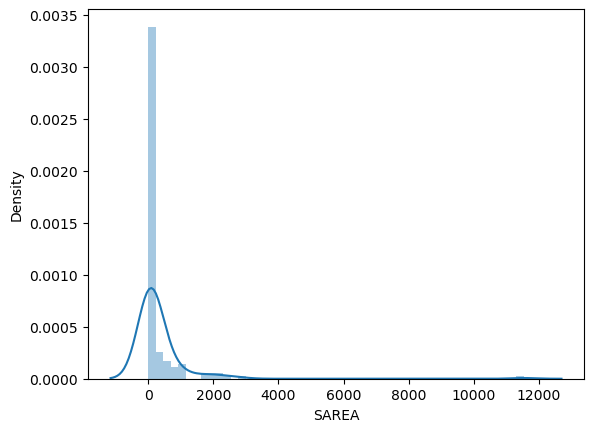

In [434]:
sns.distplot(scalelakes["SAREA"][scalelakes["HIGH_INT"].isin([1, 2])])

/fs/dss/scratch/7669748_noge4093_mpcs043/ipykernel_2609343/2707918039.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(scalelakes["SAREA"][scalelakes["HIGH_INT"].isin([0])])


<Axes: xlabel='SAREA', ylabel='Density'>

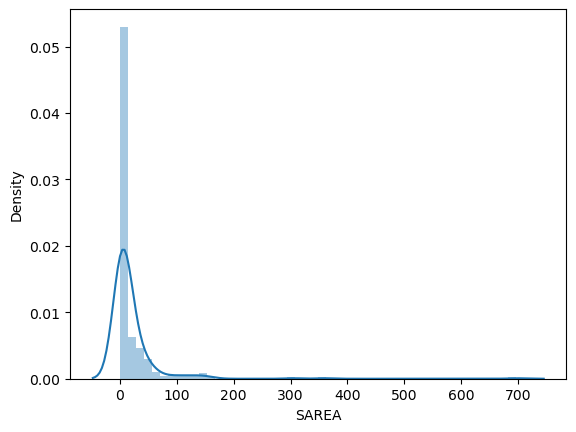

In [433]:
sns.distplot(scalelakes["SAREA"][scalelakes["HIGH_INT"].isin([0])])

/fs/dss/scratch/7669748_noge4093_mpcs043/ipykernel_2609343/1460293944.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y1low["2L_Samples_Required"])


<Axes: xlabel='2L_Samples_Required', ylabel='Density'>

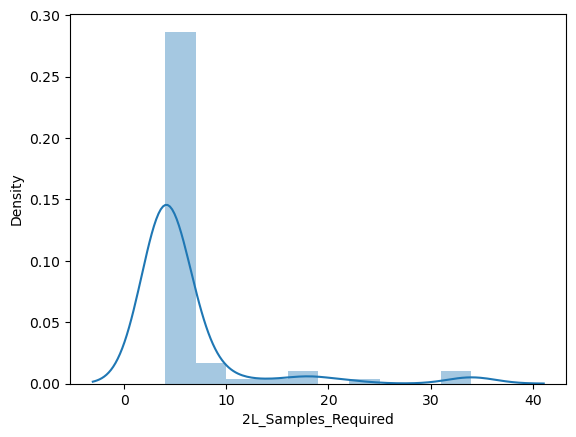

In [141]:
sns.distplot(y1low["2L_Samples_Required"])

In [144]:
len(y1low[y1low["2L_Samples_Required"] < 5])

82

In [ ]:
len(y1low[y1low["2L_Samples_Required"] < 5])

In [143]:
len(y1low[y1low["2L_Samples_Required"] > 10])

9

In [286]:
scalelakes["2L_Samples_Required"].sum()

1270.0

In [287]:
scalelakes["2L_Samples_Required"][scalelakes["HIGH_INT"] > 0 ].sum() * 6

3216.0

In [290]:
scalelakes["2L_Samples_Required"][scalelakes["HIGH_INT"] == 0].sum()

734.0

In [307]:
print("N Blanks Required (1/lake visit): ", ((len(scalelakes[scalelakes["HIGH_INT"] == 0])) + 
 (len(scalelakes[scalelakes["HIGH_INT"] == 1]) * 8) + 
 (len(scalelakes[scalelakes["HIGH_INT"] == 2]) * 16)))

N Blanks Required (1/lake visit):  2324


In [305]:
500/4500

0.1111111111111111

In [330]:
(len(scalelakes[scalelakes["HIGH_INT"] == 2]))

95

In [335]:
scalelakes["NOTES"].value_counts()

NOTES
Size mined from web searches                                 12
Need private access                                           3
Bay of Lowes Lake                                             3
Saranac River between Lower and Oseetah                       2
difficult unless acess through Brandreth                      2
Impoundment of the Beaver River                               2
Impoundment of the Oswegatchie River                          2
Flow through                                                  1
1984 Na and Cl do not indicate salt impact                    1
Coordinates off. 3 Possible ponds with easy acess             1
Lomg Pond?                                                    1
Need acess. Very private.                                     1
Part of Muskat Pond                                           1
NEED ACCESS VERY PRIVATE                                      1
Impoundment of Wolf Creek                                     1
Coordinates off. 3 Possible ponds 

In [1350]:
metadata = metadata[["Merged", "EGCF-ID"]][metadata["Merged"].notna()].reset_index(drop=True)
metadata.columns = ["Group", "Sample"]
metadata = metadata.set_index("Sample")

In [1351]:
edna_data = subset[overlap_list + ["Overall_Best"]].set_index("Overall_Best").T.fillna(0)

In [1352]:
non_empty = edna_data.sum(axis=1) > 0
edna_data = edna_data[non_empty]
metadata = metadata.loc[edna_data.index]

In [1174]:
edna_data = edna_data.div(edna_data.sum(axis=1), axis=0)

test = fish[fish.columns[2:-26].tolist() + ["ASV"]].set_index("ASV").T.fillna(0)

test = test.div(test.sum(axis=1), axis=0)

test = test.fillna(0)

edna_data = test.copy()

In [1175]:
edna_data = (edna_data > 0).astype(int)

In [1176]:
# ---- 2. Sample richness & lake richness stats ----
sample_richness = edna_data.sum(axis=1)
metadata['Lake'] = metadata['Group'].str.split('_').str[0]
lake_stats = sample_richness.groupby(metadata['Lake']).agg(['mean', 'std']).rename(
    columns={'mean': 'lake_mean', 'std': 'lake_std'}
)
metadata = metadata.join(lake_stats, on='Lake')

In [1260]:
import numpy as np
import pandas as pd
from scipy.spatial.distance import pdist, squareform

# ---- 1. Calculate full Jaccard dissimilarity matrix ----
jaccard_matrix = pd.DataFrame(
    squareform(pdist(edna_data, metric='jaccard')),
    index=edna_data.index,
    columns=edna_data.index
)

# ---- 2. Calculate species richness for all samples ----
sample_richness = edna_data.sum(axis=1)

# ---- 3. Group-wise outlier detection ----
outlier_records = []
unique_groups = metadata.Group.unique()
all_outliers = set()

# First pass: Identify outliers
group_outliers_dict = {}
for group in unique_groups:
    group_samples = metadata[metadata['Group'] == group].index

    if len(group_samples) < 3:
        print(f"Skipping group {group} (only {len(group_samples)} samples)")
        continue

    group_distances = jaccard_matrix.loc[group_samples, group_samples]
    mean_dissim = group_distances.mean(axis=1)

    threshold = np.percentile(mean_dissim, 90)
    initial_outliers = mean_dissim[mean_dissim > threshold].index
    group_outliers_dict[group] = set(initial_outliers)
    all_outliers.update(initial_outliers)

# Second pass: Calculate metrics, now with access to all_outliers
for group in unique_groups:
    group_samples = metadata[metadata['Group'] == group].index

    if group not in group_outliers_dict:
        continue

    initial_outliers = group_outliers_dict[group]
    non_outlier_samples = group_samples.difference(initial_outliers)

    if len(non_outlier_samples) < 2:
        print(f"Skipping group {group} (not enough non-outliers to compare)")
        continue

    group_distances = jaccard_matrix.loc[group_samples, group_samples]
    full_group_avg_dissim = group_distances.where(~np.eye(len(group_distances), dtype=bool)).mean().mean()

    reduced_distances = jaccard_matrix.loc[non_outlier_samples, non_outlier_samples]
    reduced_group_avg_dissim = reduced_distances.where(~np.eye(len(reduced_distances), dtype=bool)).mean().mean()

    for sample_id in initial_outliers:
        # Compare to non-outlier samples in the same group
        sample_distances_to_group = jaccard_matrix.loc[sample_id, non_outlier_samples]
        mean_dissim_to_group = sample_distances_to_group.mean()

        # Compare to other lakes for group similarity
        original_lake = group.split("_")[0]
        sample_distances = jaccard_matrix.loc[sample_id]

        group_avgs = {}
        group_sample_ids = {}
        for other_group in unique_groups:
            other_lake = other_group.split("_")[0]
            if other_lake == original_lake:
                continue

            other_ids = metadata[metadata['Group'] == other_group].index.difference(all_outliers)
            if len(other_ids) == 0:
                continue

            avg_dissim = sample_distances[other_ids].mean()
            group_avgs[other_group] = avg_dissim
            group_sample_ids[other_group] = other_ids

        most_similar_group = None
        mean_dissim_to_most_similar_group = None

        if group_avgs:
            most_similar_group = min(group_avgs, key=group_avgs.get)
            mean_dissim_to_most_similar_group = group_avgs[most_similar_group]

        # Most similar sample(s) excluding all outliers
        distances_to_all_others = sample_distances.drop(sample_id)
        non_outlier_candidates = distances_to_all_others.index.difference(all_outliers)

        if len(non_outlier_candidates) > 0:
            distances_to_non_outliers = distances_to_all_others[non_outlier_candidates]
            min_dist = distances_to_non_outliers.min()
            tied_samples = distances_to_non_outliers[distances_to_non_outliers == min_dist].index.tolist()
        else:
            min_dist = np.nan
            tied_samples = []

        most_similar_samples = tied_samples
        dissimilarity_to_most_similar_sample = min_dist
        most_similar_sample_lakes = [metadata.loc[sample, 'Group'].split('_')[0] for sample in tied_samples]

        # Asymmetric richness filter
        lake_row = metadata.loc[sample_id]
        lake_mean = lake_row['lake_mean']
        lake_std = lake_row['lake_std']
        rich = sample_richness[sample_id]
        exceeds_richness_threshold = lake_std > 0 and rich > lake_mean + 2 * lake_std

        outlier_records.append({
            'Sample': sample_id,
            'Group': group,
            'Richness': rich,
            'Lake_Mean_Richness': lake_mean,
            'Lake_Std_Richness': lake_std,
            'Dissimilarity_to_Own_Group_Excl_Outliers': mean_dissim_to_group,
            'Group_Avg_Dissimilarity_Incl_Outliers': full_group_avg_dissim,
            'Group_Avg_Dissimilarity_Excl_Outliers': reduced_group_avg_dissim,
            'Most_Similar_Group': most_similar_group,
            'Mean_Dissimilarity_to_Most_Similar_Group': mean_dissim_to_most_similar_group,
            'Most_Similar_Sample': most_similar_samples,
            'Most_Similar_Sample_Lakes': list(set(most_similar_sample_lakes)),
            'N_Similar_Lake_Samples': len(set(most_similar_sample_lakes)),
            'Len_Similar_Sample_Lakes': len(most_similar_sample_lakes),
            'Dissimilarity_to_Most_Similar_Sample': dissimilarity_to_most_similar_sample
        })

# ---- 4. Convert results to DataFrame ----
outliers_df = pd.DataFrame(outlier_records)


In [1261]:
outliers_df['Similarity_Score'] = outliers_df['Mean_Dissimilarity_to_Most_Similar_Group'] - outliers_df['Dissimilarity_to_Own_Group_Excl_Outliers']

In [1262]:
outliers_df["Lake"] = outliers_df["Group"].str.split("_", n = 1, expand = True)[0]

In [1263]:
outliers_df = outliers_df[outliers_df["Dissimilarity_to_Most_Similar_Sample"] != 1].reset_index(drop=True)

In [ ]:
outliers_df["Most_Similar_Sample_Lakes_splitted"] = np.nan
for i in range(len(outliers_df)):
    if len(outliers_df["Most_Similar_Sample_Lakes"][i]) == 1:
        outliers_df["Most_Similar_Sample_Lakes_splitted"][i] = outliers_df["Most_Similar_Sample_Lakes"][i][0]

In [1294]:
outliers_df = outliers_df[(outliers_df["Lake"] != outliers_df["Most_Similar_Sample_Lakes_splitted"])].reset_index(drop=True)

In [1328]:
filtered = pd.DataFrame()
for i in range(len(outliers_df)):
    if outliers_df["Most_Similar_Group"][i].split("_")[0] in outliers_df["Most_Similar_Sample_Lakes"][i]:
        tmp = outliers_df.iloc[i:i+1].reset_index(drop=True)
        filtered = pd.concat([filtered, tmp]).reset_index(drop=True)
    elif outliers_df["Dissimilarity_to_Own_Group_Excl_Outliers"][i] == 1:
        tmp = outliers_df.iloc[i:i+1].reset_index(drop=True)
        filtered = pd.concat([filtered, tmp]).reset_index(drop=True)

In [1329]:
filtered

,Sample,Group,Richness,Lake_Mean_Richness,Lake_Std_Richness,...,Len_Similar_Sample_Lakes,Dissimilarity_to_Most_Similar_Sample,Similarity_Score,Lake,Most_Similar_Sample_Lakes_splitted
0,221,East Copperas_Early Fall,1,1.714286,0.809991,...,5,0.750000,-0.156624,East Copperas,NaN
1,214,East Copperas_Early Fall,1,1.714286,0.809991,...,2,0.000000,-0.227183,East Copperas,Dart Lake
2,237,Upper Cascade_Early Fall,1,5.161290,2.570302,...,4,0.000000,-0.101116,Upper Cascade,NaN
3,269,Moss Lake_Early Fall,3,3.733333,1.507071,...,3,0.333333,0.025482,Moss Lake,NaN
4,253,Rondaxe_Early Fall,3,6.483871,2.278464,...,6,0.250000,0.011146,Rondaxe,NaN
5,290,Dart Lake_Early Fall,1,3.269231,1.900623,...,2,0.500000,-0.075980,Dart Lake,Sagamore
6,281,Dart Lake_Early Fall,1,3.269231,1.900623,...,12,0.000000,-0.726799,Dart Lake,East Copperas
7,189,Green Lake_Early Fall,2,3.875000,1.087811,...,7,0.000000,-0.311996,Green Lake,NaN
8,171,East Lake_Early Fall,1,3.125000,1.258306,...,15,0.500000,0.112088,East Lake,NaN
9,161,East Lake_Early Fall,3,3.125000,1.258306,...,18,0.333333,-0.295238,East Lake,NaN


In [1059]:
import numpy as np
import pandas as pd
from scipy.spatial.distance import pdist, squareform
from sklearn.linear_model import LinearRegression

# ---- 1. Jaccard dissimilarity matrix ----
jaccard_matrix = pd.DataFrame(
    squareform(pdist(edna_data, metric='jaccard')),
    index=edna_data.index,
    columns=edna_data.index
)

# ---- 2. Species richness ----
sample_richness = edna_data.sum(axis=1)

# ---- 3. Lake-level richness stats ----
metadata['Lake'] = metadata['Group'].str.split('_').str[0]
lake_stats = sample_richness.groupby(metadata['Lake']).agg(['mean', 'std']).rename(
    columns={'mean': 'lake_mean', 'std': 'lake_std'}
)
metadata = metadata.join(lake_stats, on='Lake')

# ---- 4. Group-wise analysis ----
outlier_records = []
unique_groups = metadata.Group.unique()

for group in unique_groups:
    group_samples = metadata[metadata['Group'] == group].index

    if len(group_samples) < 3:
        continue

    group_distances = jaccard_matrix.loc[group_samples, group_samples]
    mean_dissim = group_distances.mean(axis=1)

    # Regress dissimilarity ~ richness
    X = sample_richness.loc[mean_dissim.index].values.reshape(-1, 1)
    y = mean_dissim.values
    model = LinearRegression().fit(X, y)
    predicted = model.predict(X)
    residuals = y - predicted

    threshold = np.percentile(residuals, 90)
    candidate_ids = mean_dissim.index[residuals > threshold]

    group_avg_dissim = group_distances.where(~np.eye(len(group_distances), dtype=bool)).mean().mean()

    for sample_id in candidate_ids:
        original_lake = group.split("_")[0]
        sample_distances = jaccard_matrix.loc[sample_id]

        other_lakes_avgs = {}
        other_lake_sample_ids = {}

        for other_group in unique_groups:
            other_lake = other_group.split("_")[0]
            if other_lake == original_lake:
                continue  # same lake, skip

            other_ids = metadata[metadata['Group'] == other_group].index
            if len(other_ids) == 0:
                continue

            avg_dissim = sample_distances[other_ids].mean()
            other_lakes_avgs[other_group] = avg_dissim
            other_lake_sample_ids[other_group] = other_ids

        if not other_lakes_avgs:
            continue

        most_similar_group = min(other_lakes_avgs, key=other_lakes_avgs.get)
        mean_dissim_to_other = other_lakes_avgs[most_similar_group]
        closest_sample = sample_distances[other_lake_sample_ids[most_similar_group]].idxmin()
        dissim_to_closest = sample_distances[closest_sample]

        # Apply asymmetric richness filter
        lake_row = metadata.loc[sample_id]
        lake_mean = lake_row['lake_mean']
        lake_std = lake_row['lake_std']
        rich = sample_richness[sample_id]
        exceeds_richness_threshold = lake_std > 0 and rich > lake_mean + 2 * lake_std

        if exceeds_richness_threshold:
            outlier_records.append({
                'Sample': sample_id,
                'Group': group,
                'Richness': rich,
                'Lake_Mean_Richness': lake_mean,
                'Lake_Std_Richness': lake_std,
                'Dissimilarity_to_Own_Group_Excl_Self': group_distances.loc[sample_id].drop(sample_id).mean(),
                'Group_Avg_Dissimilarity': group_avg_dissim,
                'Dissimilarity_Residual': residuals[list(mean_dissim.index).index(sample_id)],
                'Most_Similar_Group': most_similar_group,
                'Mean_Dissimilarity_to_Most_Similar_Group': mean_dissim_to_other,
                'Most_Similar_Sample': closest_sample,
                'Dissimilarity_to_Most_Similar_Sample': dissim_to_closest
            })

# ---- 5. Final output ----
outliers_df = pd.DataFrame(outlier_records)


In [1060]:
outliers_df

,Sample,Group,Richness,Lake_Mean_Richness,Lake_Std_Richness,Dissimilarity_to_Own_Group_Excl_Self,Group_Avg_Dissimilarity,Dissimilarity_Residual,Most_Similar_Group,Mean_Dissimilarity_to_Most_Similar_Group,Most_Similar_Sample,Dissimilarity_to_Most_Similar_Sample
0,239,Upper Cascade_Early Fall,11,5.161290,2.570302,0.662626,0.684315,0.105714,Heart_Spring,0.700971,75,0.461538
1,283,Dart Lake_Early Fall,8,3.269231,1.900623,0.718016,0.803383,0.077195,Rondaxe_Early Fall,0.367963,250,0.125000
2,387,Little Clear_Early Fall,3,1.555556,0.577350,0.515152,0.353535,0.001412,Green Lake_Early Fall,0.685268,177,0.500000
3,1,Dart Lake_Spring,8,3.269231,1.900623,0.612845,0.621424,0.091054,Rondaxe_Early Fall,0.443519,251,0.125000


In [977]:
import numpy as np
import pandas as pd
from scipy.spatial.distance import pdist, squareform
import matplotlib.pyplot as plt
import seaborn as sns

# ---- 1. Calculate full Jaccard dissimilarity matrix ----
jaccard_matrix = pd.DataFrame(
    squareform(pdist(edna_data, metric='jaccard')),
    index=edna_data.index,
    columns=edna_data.index
)

# ---- 2. Per-group outlier detection ----
outlier_records = []
unique_groups = metadata.Group.unique()

for group in unique_groups:
    group_samples = metadata[metadata['Group'] == group].index

    if len(group_samples) < 3:
        print(f"Skipping group {group} (only {len(group_samples)} samples)")
        continue

    group_distances = jaccard_matrix.loc[group_samples, group_samples]
    mean_dissim = group_distances.mean(axis=1)
    threshold = np.percentile(mean_dissim, 90)
    outliers = mean_dissim[mean_dissim > threshold]

    # Group-wide average dissimilarity (excluding diagonals)
    group_avg_dissim = group_distances.where(~np.eye(len(group_distances), dtype=bool)).mean().mean()

    for sample_id, dissim_value in outliers.items():
        other_group_members = group_distances.loc[sample_id].drop(sample_id)
        mean_dissim_to_group = other_group_members.mean()

        original_lake = group.split("_")[0]
        sample_distances = jaccard_matrix.loc[sample_id]

        group_avgs = {}
        group_sample_ids = {}
        for other_group in unique_groups:
            other_lake = other_group.split("_")[0]
            if other_lake == original_lake:
                continue

            other_ids = metadata[metadata['Group'] == other_group].index
            if len(other_ids) == 0:
                continue

            group_avg_dissim_other = sample_distances[other_ids].mean()
            group_avgs[other_group] = group_avg_dissim_other
            group_sample_ids[other_group] = other_ids

        most_similar_group = None
        mean_dissim_to_most_similar_group = None
        most_similar_sample = None
        dissimilarity_to_most_similar_sample = None

        if group_avgs:
            most_similar_group = min(group_avgs, key=group_avgs.get)
            mean_dissim_to_most_similar_group = group_avgs[most_similar_group]

            candidate_samples = group_sample_ids[most_similar_group]
            closest_sample = sample_distances[candidate_samples].idxmin()
            dissimilarity_to_most_similar_sample = sample_distances[closest_sample]
            most_similar_sample = closest_sample

        outlier_records.append({
            'Sample': sample_id,
            'Group': group,
            'Dissimilarity_to_Own_Group_Excl_Self': mean_dissim_to_group,
            'Group_Avg_Dissimilarity': group_avg_dissim,
            'Most_Similar_Group': most_similar_group,
            'Mean_Dissimilarity_to_Most_Similar_Group': mean_dissim_to_most_similar_group,
            'Most_Similar_Sample': most_similar_sample,
            'Dissimilarity_to_Most_Similar_Sample': dissimilarity_to_most_similar_sample
        })

# ---- 3. Convert results to DataFrame ----
outliers_df = pd.DataFrame(outlier_records)
# Add richness to your original data
#sample_richness = edna_data.sum(axis=1)
#outliers_df["Richness"] = outliers_df["Sample"].map(sample_richness)"

In [978]:
outliers_df

,Sample,Group,Dissimilarity_to_Own_Group_Excl_Self,Group_Avg_Dissimilarity,Most_Similar_Group,Mean_Dissimilarity_to_Most_Similar_Group,Most_Similar_Sample,Dissimilarity_to_Most_Similar_Sample
0,221,East Copperas_Early Fall,1.000000,0.586538,Heart_Spring,0.864259,84,0.800000
1,214,East Copperas_Early Fall,1.000000,0.586538,Moss Lake_Spring,0.745748,24,0.500000
2,145,Little Moose Lake_Early Fall,0.752063,0.599739,Green Lake_Early Fall,0.738095,182,0.571429
3,155,Little Moose Lake_Early Fall,0.771905,0.599739,Green Lake_Early Fall,0.549107,182,0.285714
4,231,Upper Cascade_Early Fall,0.888730,0.684315,Combs Lake_Early Fall,0.666667,199,0.666667
5,237,Upper Cascade_Early Fall,0.819865,0.684315,Sagamore_Early Fall,0.729730,320,0.000000
6,269,Moss Lake_Early Fall,0.704127,0.633330,Rondaxe_Early Fall,0.719206,253,0.500000
7,274,Moss Lake_Early Fall,0.962698,0.633330,Combs Lake_Early Fall,0.666667,199,0.666667
8,76,Heart_Spring,0.797902,0.415435,Upper Cascade_Spring,0.709259,132,0.333333
9,79,Heart_Spring,0.649603,0.415435,Rondaxe_Early Fall,0.759312,256,0.600000


In [979]:
outliers_df = outliers_df[outliers_df["Dissimilarity_to_Most_Similar_Sample"] < 1].reset_index(drop=True) ## exluding samples which have a dissimilarity of 1 again the "most similar sample" - this means we're not confident about either assignment so we shouldn't throw out the original

In [980]:
# ---- 4. Remove outliers from dataset ----
cleaned_data = edna_data.drop(index=outliers_df['Sample'], errors='ignore')
cleaned_metadata = metadata.drop(index=outliers_df['Sample'], errors='ignore')

# ---- 5. Recalculate Jaccard matrix on cleaned data ----
cleaned_jaccard = pd.DataFrame(
    squareform(pdist(cleaned_data, metric='jaccard')),
    index=cleaned_data.index,
    columns=cleaned_data.index
)

def calculate_mean_dissim_per_group(jaccard_mat, meta, group_col='Group'):
    mean_dissim_records = []
    for group in meta[group_col].unique():
        group_samples = meta[meta[group_col] == group].index
        if len(group_samples) < 2:
            continue
        dists = jaccard_mat.loc[group_samples, group_samples]
        # Upper triangle only (no self-comparisons)
        upper_triangle = dists.where(np.triu(np.ones(dists.shape), k=1).astype(bool))
        mean_dissim = upper_triangle.stack().mean()
        mean_dissim_records.append({'Group': group, 'Mean_Jaccard_Dissimilarity': mean_dissim})
    return pd.DataFrame(mean_dissim_records)

# ---- Calculate original mean dissimilarities ----
original_dissim_df = calculate_mean_dissim_per_group(jaccard_matrix, metadata)
original_dissim_df.rename(columns={'Mean_Jaccard_Dissimilarity': 'Pre_Outlier_Removal'}, inplace=True)

# ---- Calculate post-removal mean dissimilarities ----
cleaned_dissim_df = calculate_mean_dissim_per_group(cleaned_jaccard, cleaned_metadata)
cleaned_dissim_df.rename(columns={'Mean_Jaccard_Dissimilarity': 'Post_Outlier_Removal'}, inplace=True)

# ---- Merge pre- and post- into comparison dataframe ----
comparison_df = pd.merge(
    original_dissim_df,
    cleaned_dissim_df,
    on='Group',
    how='outer'
).sort_values(by='Pre_Outlier_Removal', ascending=False)

# Optional: Compute difference column
comparison_df['Reduction'] = comparison_df['Pre_Outlier_Removal'] - comparison_df['Post_Outlier_Removal']

In [982]:
outliers_df

,Sample,Group,Dissimilarity_to_Own_Group_Excl_Self,Group_Avg_Dissimilarity,Most_Similar_Group,Mean_Dissimilarity_to_Most_Similar_Group,Most_Similar_Sample,Dissimilarity_to_Most_Similar_Sample
0,221,East Copperas_Early Fall,1.000000,0.586538,Heart_Spring,0.864259,84,0.800000
1,214,East Copperas_Early Fall,1.000000,0.586538,Moss Lake_Spring,0.745748,24,0.500000
2,145,Little Moose Lake_Early Fall,0.752063,0.599739,Green Lake_Early Fall,0.738095,182,0.571429
3,155,Little Moose Lake_Early Fall,0.771905,0.599739,Green Lake_Early Fall,0.549107,182,0.285714
4,231,Upper Cascade_Early Fall,0.888730,0.684315,Combs Lake_Early Fall,0.666667,199,0.666667
5,237,Upper Cascade_Early Fall,0.819865,0.684315,Sagamore_Early Fall,0.729730,320,0.000000
6,269,Moss Lake_Early Fall,0.704127,0.633330,Rondaxe_Early Fall,0.719206,253,0.500000
7,274,Moss Lake_Early Fall,0.962698,0.633330,Combs Lake_Early Fall,0.666667,199,0.666667
8,76,Heart_Spring,0.797902,0.415435,Upper Cascade_Spring,0.709259,132,0.333333
9,79,Heart_Spring,0.649603,0.415435,Rondaxe_Early Fall,0.759312,256,0.600000


In [981]:
comparison_df

,Group,Pre_Outlier_Removal,Post_Outlier_Removal,Reduction
1,Dart Lake_Early Fall,0.803383,0.763846,0.039537
16,Sagamore_Early Fall,0.712536,0.674143,0.038393
18,Upper Cascade_Early Fall,0.684315,0.631746,0.052569
17,Sagamore_Spring,0.678678,0.619978,0.058700
7,Heart_Early Fall,0.651005,0.584005,0.067000
12,Moss Lake_Early Fall,0.633330,0.568651,0.064679
2,Dart Lake_Spring,0.621424,0.559291,0.062133
13,Moss Lake_Spring,0.620914,0.547745,0.073169
11,Little Moose Lake_Early Fall,0.599739,0.543324,0.056415
19,Upper Cascade_Spring,0.597267,0.557652,0.039615


As expected, we see a modest increase in most cases, but we see the most prominent reductions in Jaccard index in samples we knew to be problematic from visual inspections of thte data (Little Clear, East Copperas, and Heart):

In [365]:
metadata = pd.read_csv("../master_metadata.csv")
metadata.loc[metadata["Site"] == "Blank", "Name"] = "Field Blank"
metadata.loc[metadata["Site"] == "Extraction Blank", "Name"] = "Extraction Blank"
metadata.loc[metadata["Site"] == "PCR Blank", "Name"] = "PCR Blank"
metadata = metadata[metadata["EGCF-ID"].notna()].reset_index(drop=True)

In [366]:
metadata = metadata[~metadata["EGCF-ID"].isin(outliers_df["Sample"].tolist())].reset_index(drop=True)

In [367]:
metadata["Merged"] = metadata["Name"] + "_" + metadata["Season"]

In [473]:
comparison_df

,Group,Pre_Outlier_Removal,Post_Outlier_Removal,Reduction
1,Dart Lake_Early Fall,0.803383,0.763846,0.039537
16,Sagamore_Early Fall,0.712536,0.674143,0.038393
18,Upper Cascade_Early Fall,0.684315,0.631746,0.052569
17,Sagamore_Spring,0.678678,0.619978,0.058700
7,Heart_Early Fall,0.651005,0.584005,0.067000
12,Moss Lake_Early Fall,0.633330,0.568651,0.064679
2,Dart Lake_Spring,0.621424,0.559291,0.062133
13,Moss Lake_Spring,0.620914,0.547745,0.073169
11,Little Moose Lake_Early Fall,0.599739,0.543324,0.056415
19,Upper Cascade_Spring,0.597267,0.557652,0.039615


In [474]:
outliers_df

,Sample,Group,Dissimilarity_to_Own_Group_Excl_Self,Group_Avg_Dissimilarity,Most_Similar_Group,Mean_Dissimilarity_to_Most_Similar_Group,Most_Similar_Sample,Dissimilarity_to_Most_Similar_Sample
0,221,East Copperas_Early Fall,1.000000,0.586538,Heart_Spring,0.864259,84,0.800000
1,214,East Copperas_Early Fall,1.000000,0.586538,Moss Lake_Spring,0.745748,24,0.500000
2,145,Little Moose Lake_Early Fall,0.752063,0.599739,Green Lake_Early Fall,0.738095,182,0.571429
3,155,Little Moose Lake_Early Fall,0.771905,0.599739,Green Lake_Early Fall,0.549107,182,0.285714
4,231,Upper Cascade_Early Fall,0.888730,0.684315,Combs Lake_Early Fall,0.666667,199,0.666667
5,237,Upper Cascade_Early Fall,0.819865,0.684315,Sagamore_Early Fall,0.729730,320,0.000000
6,269,Moss Lake_Early Fall,0.704127,0.633330,Rondaxe_Early Fall,0.719206,253,0.500000
7,274,Moss Lake_Early Fall,0.962698,0.633330,Combs Lake_Early Fall,0.666667,199,0.666667
8,76,Heart_Spring,0.797902,0.415435,Upper Cascade_Spring,0.709259,132,0.333333
9,79,Heart_Spring,0.649603,0.415435,Rondaxe_Early Fall,0.759312,256,0.600000


In [469]:
outliers_df

,Sample,Group,Dissimilarity_to_Own_Group_Excl_Self,Group_Avg_Dissimilarity,Most_Similar_Group,Mean_Dissimilarity_to_Most_Similar_Group,Most_Similar_Sample,Dissimilarity_to_Most_Similar_Sample
0,221,East Copperas_Early Fall,1.000000,0.586538,Heart_Spring,0.864259,84,0.800000
1,214,East Copperas_Early Fall,1.000000,0.586538,Moss Lake_Spring,0.745748,24,0.500000
2,145,Little Moose Lake_Early Fall,0.752063,0.599739,Green Lake_Early Fall,0.738095,182,0.571429
3,155,Little Moose Lake_Early Fall,0.771905,0.599739,Green Lake_Early Fall,0.549107,182,0.285714
4,231,Upper Cascade_Early Fall,0.888730,0.684315,Combs Lake_Early Fall,0.666667,199,0.666667
5,237,Upper Cascade_Early Fall,0.819865,0.684315,Sagamore_Early Fall,0.729730,320,0.000000
6,269,Moss Lake_Early Fall,0.704127,0.633330,Rondaxe_Early Fall,0.719206,253,0.500000
7,274,Moss Lake_Early Fall,0.962698,0.633330,Combs Lake_Early Fall,0.666667,199,0.666667
8,76,Heart_Spring,0.797902,0.415435,Upper Cascade_Spring,0.709259,132,0.333333
9,79,Heart_Spring,0.649603,0.415435,Rondaxe_Early Fall,0.759312,256,0.600000


In [472]:
joined[["145", "155", "Overall_Best"]].head(30)

,145,155,Overall_Best
0,32981.0,2965.0,Lepomis
1,64761.0,7118.0,Lepomis gibbosus
2,0.0,0.0,Perca flavescens
3,0.0,0.0,Micropterus salmoides
4,0.0,3590.0,Salvelinus fontinalis
5,0.0,0.0,Catostomus commersonii
6,0.0,20154.0,Semotilus atromaculatus
7,0.0,0.0,Umbra limi
8,0.0,0.0,Notemigonus crysoleucas
9,0.0,0.0,Ameiurus nebulosus


/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/1902295249.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  spring["sum"] = spring[spring.columns[0:-1].tolist()].sum(axis=1, numeric_only=True)
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/1902295249.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fall["sum"] = fall[fall.columns[0:-1].tolist()].sum(axis=1, numeric_only=True)
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/1902295249.py:34: SettingWithCopyWarning: 
A v

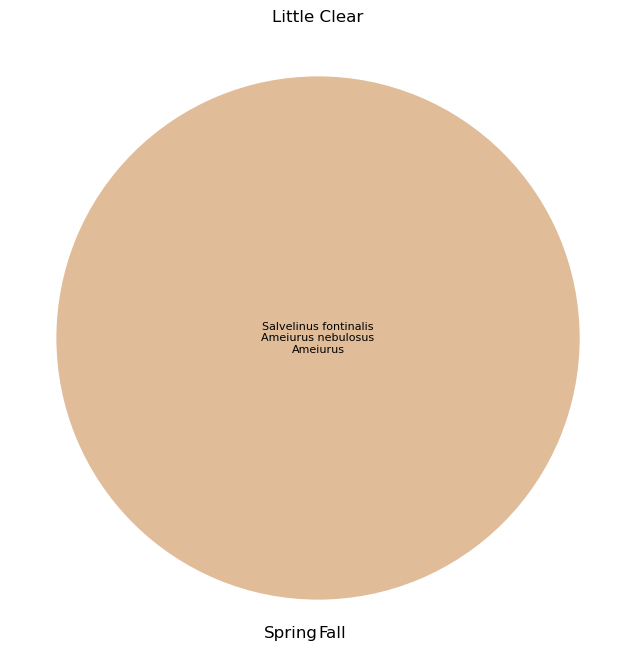

/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/1902295249.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  spring["sum"] = spring[spring.columns[0:-1].tolist()].sum(axis=1, numeric_only=True)
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/1902295249.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fall["sum"] = fall[fall.columns[0:-1].tolist()].sum(axis=1, numeric_only=True)
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/1902295249.py:34: SettingWithCopyWarning: 
A v

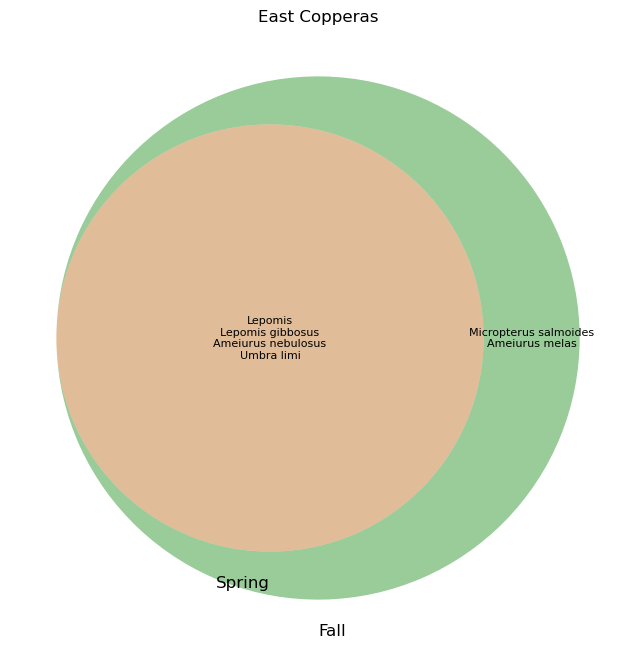

/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/1902295249.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  spring["sum"] = spring[spring.columns[0:-1].tolist()].sum(axis=1, numeric_only=True)
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/1902295249.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fall["sum"] = fall[fall.columns[0:-1].tolist()].sum(axis=1, numeric_only=True)
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/1902295249.py:34: SettingWithCopyWarning: 
A v

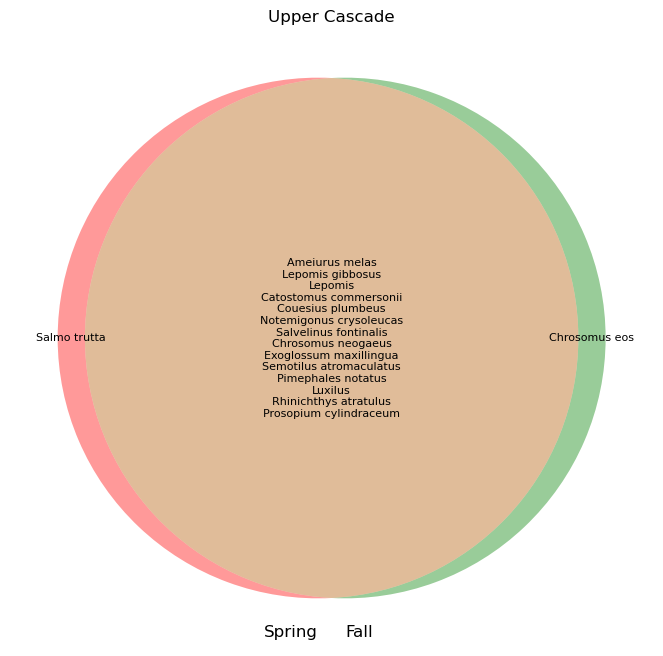

/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/1902295249.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  spring["sum"] = spring[spring.columns[0:-1].tolist()].sum(axis=1, numeric_only=True)
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/1902295249.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fall["sum"] = fall[fall.columns[0:-1].tolist()].sum(axis=1, numeric_only=True)
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/1902295249.py:34: SettingWithCopyWarning: 
A v

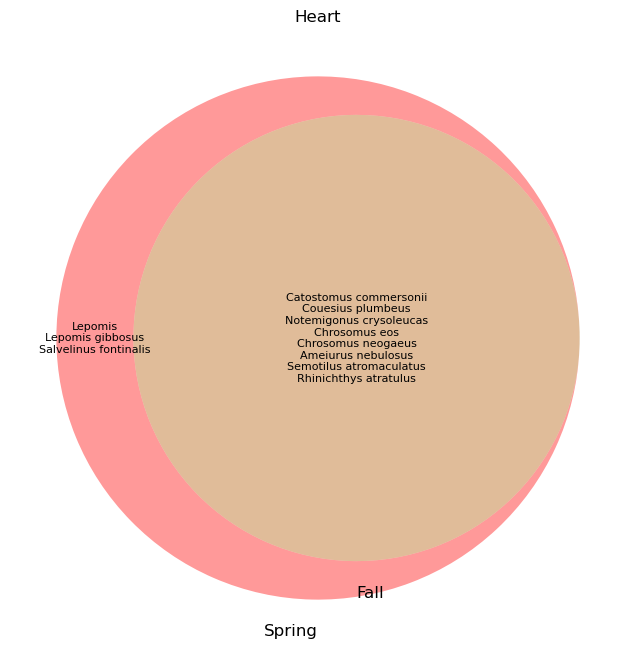

/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/1902295249.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  spring["sum"] = spring[spring.columns[0:-1].tolist()].sum(axis=1, numeric_only=True)
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/1902295249.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fall["sum"] = fall[fall.columns[0:-1].tolist()].sum(axis=1, numeric_only=True)
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/1902295249.py:34: SettingWithCopyWarning: 
A v

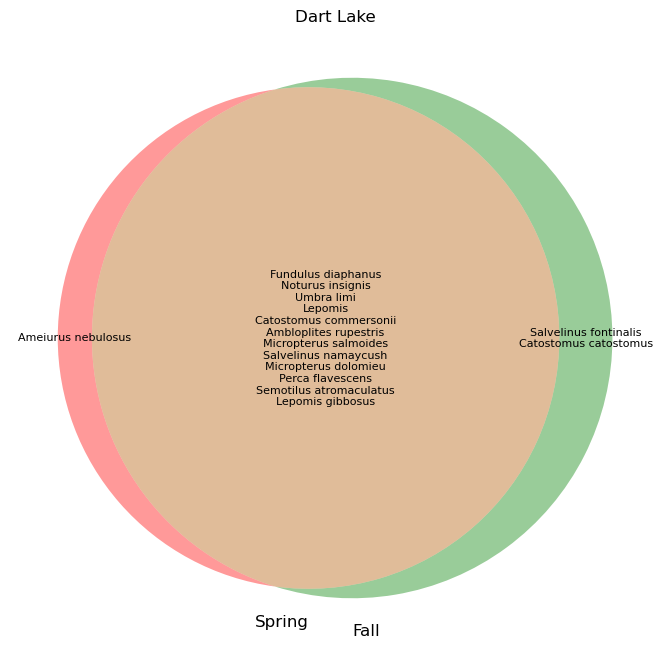

/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/1902295249.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  spring["sum"] = spring[spring.columns[0:-1].tolist()].sum(axis=1, numeric_only=True)
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/1902295249.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fall["sum"] = fall[fall.columns[0:-1].tolist()].sum(axis=1, numeric_only=True)
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/1902295249.py:34: SettingWithCopyWarning: 
A v

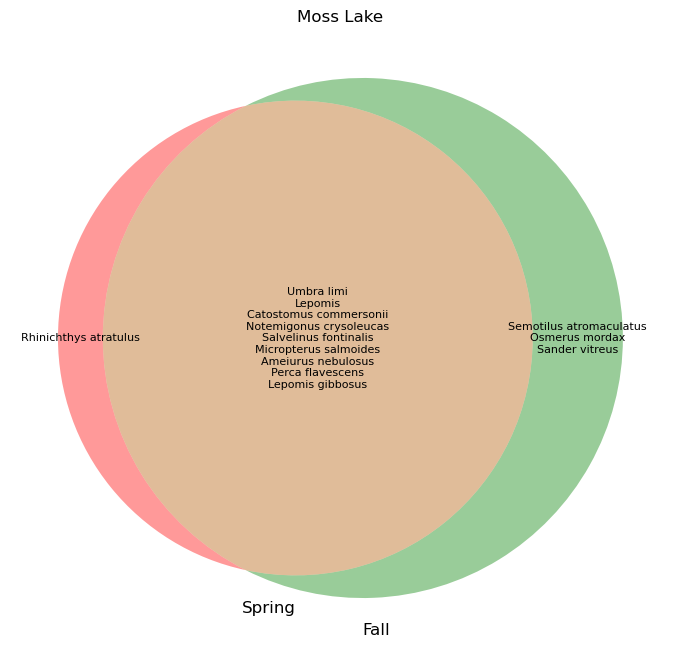

/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/1902295249.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  spring["sum"] = spring[spring.columns[0:-1].tolist()].sum(axis=1, numeric_only=True)
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/1902295249.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fall["sum"] = fall[fall.columns[0:-1].tolist()].sum(axis=1, numeric_only=True)
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/1902295249.py:34: SettingWithCopyWarning: 
A v

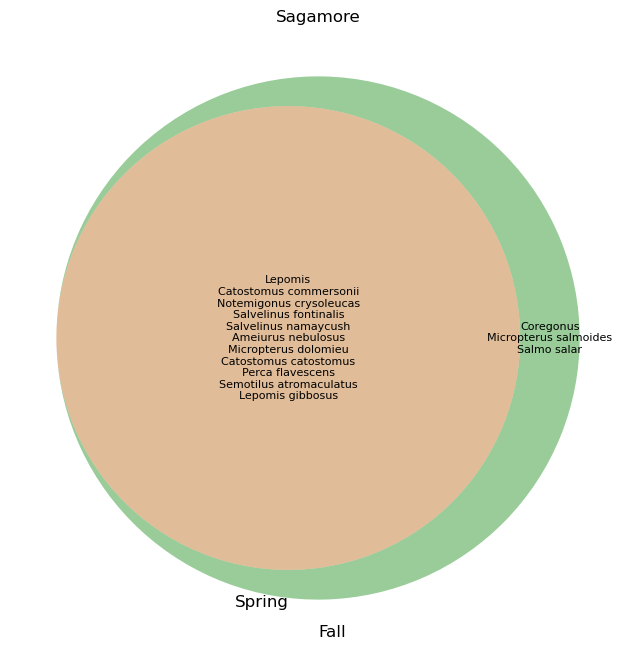

/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/1902295249.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  spring["sum"] = spring[spring.columns[0:-1].tolist()].sum(axis=1, numeric_only=True)
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/1902295249.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fall["sum"] = fall[fall.columns[0:-1].tolist()].sum(axis=1, numeric_only=True)
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/1902295249.py:34: SettingWithCopyWarning: 
A v

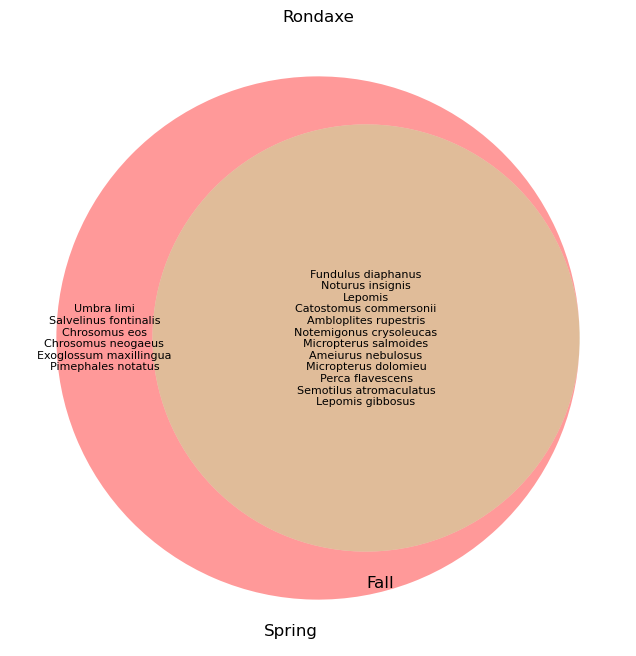

In [368]:
typeclassification = pd.DataFrame()
summary = pd.DataFrame()
mifish = joined[joined["Primer"] == "MiFish"].reset_index(drop=True)
for site_season in ['Little Clear',
 'East Copperas',
 'Upper Cascade',
 'Heart',
 'Dart Lake',
 'Moss Lake',
 'Sagamore',
 'Rondaxe']:
    if len(metadata["Season"][metadata["Name"] == site_season].unique()) > 0:
        plt.figure(figsize=(10, 8))
        spring = (mifish[metadata["EGCF-ID"]
                  [metadata["Name"] == site_season]
                  [metadata["Season"] == "Spring"].tolist() + 
                  ["Overall_Best"]])
        spring["sum"] = spring[spring.columns[0:-1].tolist()].sum(axis=1, numeric_only=True)
        spring = spring[spring["sum"] > 0].reset_index(drop=True)
        springsplist = spring["Overall_Best"].tolist()
        fall = (mifish[metadata["EGCF-ID"]
                  [metadata["Name"] == site_season]
                  [metadata["Season"] == "Early Fall"].tolist() + 
                  ["Overall_Best"]])
        fall["sum"] = fall[fall.columns[0:-1].tolist()].sum(axis=1, numeric_only=True)
        fall = fall[fall["sum"] > 0].reset_index(drop=True)
        fallsplist = fall["Overall_Best"].tolist()
        
        springsplist = set(springsplist)
        fallsplist = set(fallsplist)
        allyear = (mifish[metadata["EGCF-ID"]
                  [metadata["Name"] == site_season].tolist() + 
                  ["Overall_Best"]])
        allyear["sum"] = allyear[allyear.columns[0:-1].tolist()].sum(axis=1, numeric_only=True)
        allyear = allyear[allyear["sum"] > 0].reset_index(drop=True)
        allyear["nsites"] = allyear[allyear.columns[0:-2].tolist()].gt(0).sum(axis=1)
        allyearsplist = allyear["Overall_Best"].tolist()
        allyear["Classification"] = "Unclassified"
        for spp in range(len(allyear)):
            if allyear["nsites"][spp] == 1:
                if allyear["Overall_Best"][spp] in fallsplist:
                    allyear["Classification"][spp] = "Fall Ephemeral"
                if allyear["Overall_Best"][spp] in springsplist:
                    allyear["Classification"][spp] = "Spring Ephemeral"
            elif allyear["nsites"][spp] > 1:
                if allyear["Overall_Best"][spp] in (fallsplist - springsplist):
                    allyear["Classification"][spp] = "Fall Resident"
                if allyear["Overall_Best"][spp] in (springsplist - fallsplist):
                    allyear["Classification"][spp] = "Spring Resident"
                if allyear["Overall_Best"][spp] in (fallsplist & springsplist):
                    allyear["Classification"][spp] = "Year-round Resident"
            if allyear["nsites"][spp] <= (0.1* len(metadata[metadata["Name"] == site_season])):
                if allyear["Overall_Best"][spp] in (fallsplist & springsplist):
                    allyear["Classification"][spp] = "Rare Year-round Resident"
        tmp = allyear[['Overall_Best', 'sum', 'nsites', 'Classification']]
        tmp["Lake"] = site_season
        tmp7 = pd.DataFrame(data = [len(springsplist - fallsplist), len(fallsplist - springsplist), len(fallsplist & springsplist)]).T
        tmp7.columns = ["springonly", "fallonly", "intersect"]
        tmp7["lake"] = site_season
        summary = pd.concat([summary, tmp7]).reset_index(drop=True)
        typeclassification = pd.concat([typeclassification, tmp]).reset_index(drop=True)
                # Define your species sets for three habitats
        # Plot the Venn diagram
        venn = venn2([springsplist, 
                      fallsplist], 
                     ('Spring', 'Fall'))

        # Now manually set the labels for each subset
        # The subsets are labeled by region IDs, like '100', '010', '001', '110', etc.
        try:   # Example for region '100' (only in A)
            venn.get_label_by_id('10').set_text('\n'.join(springsplist - fallsplist))
        except:
            pass
        try:
            venn.get_label_by_id('01').set_text('\n'.join(fallsplist - springsplist))
        except:
            pass
        try:
            venn.get_label_by_id('11').set_text('\n'.join(fallsplist & springsplist))
        except:
            pass
        for subset in ('10', '01', '11'):
            label = venn.get_label_by_id(subset)
            if label:  # Some regions may be empty
                label.set_fontsize(8)

        plt.title(site_season)
        plt.show()

In [369]:
typeclassification = (typeclassification
                      [typeclassification["Overall_Best"] != "Lepomis"][typeclassification["Overall_Best"] != "Ameiurus"].reset_index(drop=True))

/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/1058751413.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  typeclassification = (typeclassification


In [370]:
size_migration = pd.DataFrame()
for i in typeclassification["Lake"].unique().tolist():
    tmp = pd.DataFrame(data = [i, (len(typeclassification[typeclassification["Lake"] == i]
                  [typeclassification["Classification"] == "Year-round Resident"]) / 
              len(typeclassification[typeclassification["Lake"] == i]))]).T
    tmp.columns = ["Name", "Percentage Resident"]
    size_migration = pd.concat([tmp, size_migration]).reset_index(drop=True)

/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/2228096954.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  tmp = pd.DataFrame(data = [i, (len(typeclassification[typeclassification["Lake"] == i]
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/2228096954.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  tmp = pd.DataFrame(data = [i, (len(typeclassification[typeclassification["Lake"] == i]
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/2228096954.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  tmp = pd.DataFrame(data = [i, (len(typeclassification[typeclassification["Lake"] == i]
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/2228096954.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  tmp = pd.DataFrame(data = [i, (len(typeclassification[typeclassification["Lake"] == i]
/fs/dss/scratch/7338030_noge4093_mpcs045

In [371]:
edna_spp = typeclassification.copy()
edna_spp.columns = ["Species", "Reads", "Nsites", "Classification", "Name"]
edna_spp["Year"] = 2023

In [372]:
new_spp_list = pd.concat([historical_spp, edna_spp]).reset_index(drop=True)
new_spp_list.loc[new_spp_list["Classification"].isna(), "Classification"] = "Catch"
new_spp_list["sort"] = np.nan
new_spp_list.loc[new_spp_list["Classification"] == "Catch", "sort"] = 0
new_spp_list.loc[new_spp_list["Classification"] == "Year-round Resident", "sort"] = 6
new_spp_list.loc[new_spp_list["Classification"] == "Rare Year-round Resident", "sort"] = 5
new_spp_list.loc[new_spp_list["Classification"] == 'Spring Resident', "sort"] = 4
new_spp_list.loc[new_spp_list["Classification"] == 'Spring Ephemeral', "sort"] = 3
new_spp_list.loc[new_spp_list["Classification"] == "Fall Resident", "sort"] = 2
new_spp_list.loc[new_spp_list["Classification"] == "Fall Ephemeral", "sort"] = 1
new_spp_list.loc[new_spp_list["Surveyor"] == "AFRP", "Year"] = 2022
new_spp_list = new_spp_list.loc[new_spp_list["Species"] != "Ameirus"].reset_index(drop=True)
new_spp_list.loc[new_spp_list["Species"] == "Coregonus", "Species"] = "Coregonus clupeaformis"
new_spp_list.loc[new_spp_list["Species"] == "Cottidae", "Species"] = "Cottus cognatus"
new_spp_list.loc[new_spp_list["Species"] == "Luxilus", "Species"] = "Luxilus cornatus"

In [373]:
new_spp_list = new_spp_list.drop_duplicates(["Name", "Year", "Species"]).reset_index(drop=True)

In [374]:
df = new_spp_list.sort_values("sort").reset_index(drop=True).copy()
# Define your categorical confidence levels and their order
confidence_levels = ['Catch', 
 'Year-round Resident',
 'Rare Year-round Resident',
 'Spring Resident',
 'Spring Ephemeral',
 'Fall Resident',
 'Fall Ephemeral'
]

# Map confidence levels to integers
confidence_map = {level: i for i, level in enumerate(confidence_levels)}
df['confidence_num'] = df['Classification'].map(confidence_map)

In [375]:
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.colors as mcolors

# Define colors
grey_color = "#5c5c5c"  # Grey for -1 < x < 0
start_color = "#305b37"
end_color = "#305b37"

# Create a segmented colormap
cmap = LinearSegmentedColormap.from_list(
    "custom_cmap",
    [(0, grey_color), (0.5, grey_color), (0.5, start_color), (1, end_color)]
)

In [376]:
df["Fraction"] = np.nan
for i in df.Name.unique().tolist():
    df.loc[(df["Name"] == i) & (df["Classification"] != "Catch"), "Fraction"] = df["Nsites"] / df["Nsites"][df["Name"] == i][df["Classification"] != "Catch"].max()

In [377]:
df.loc[df["Fraction"].isna(), "Fraction"] = -1

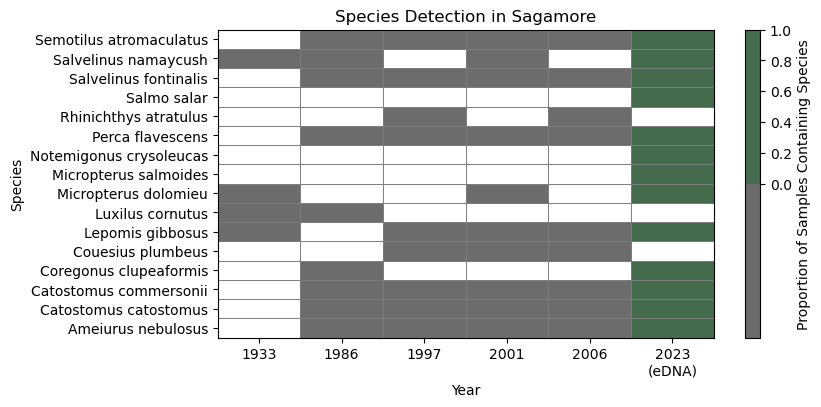

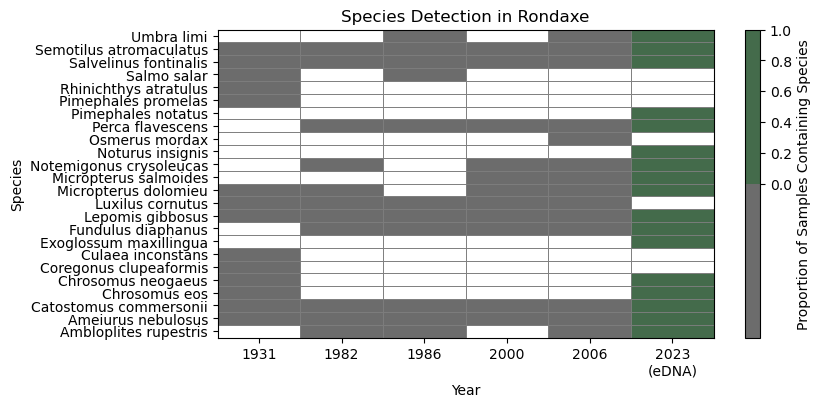

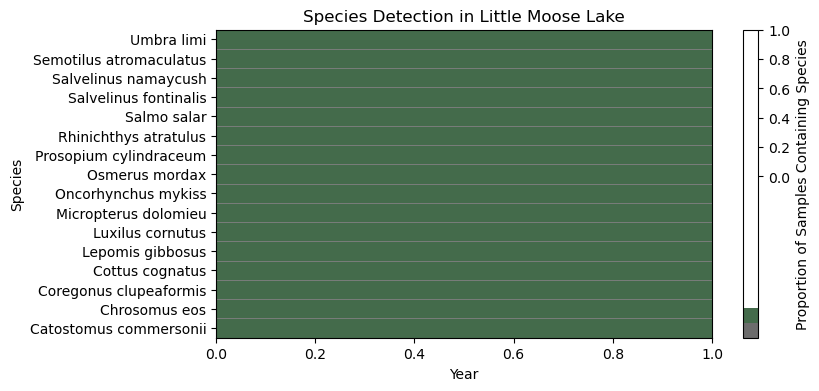

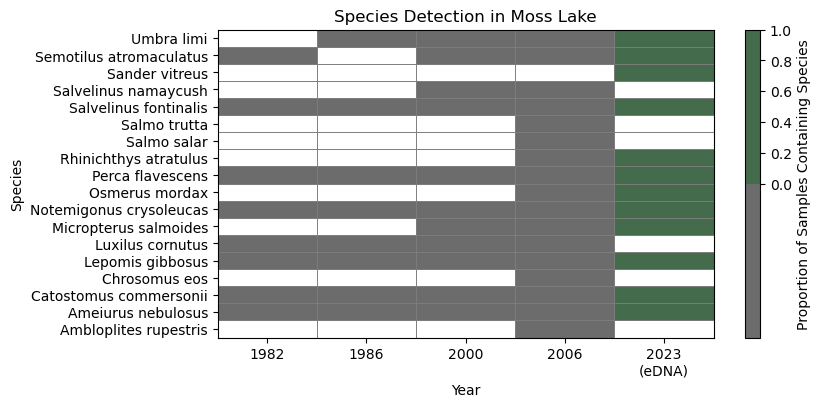

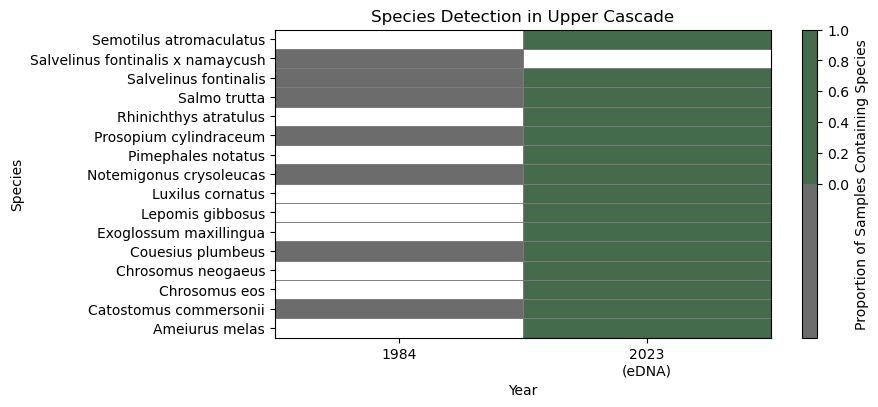

...

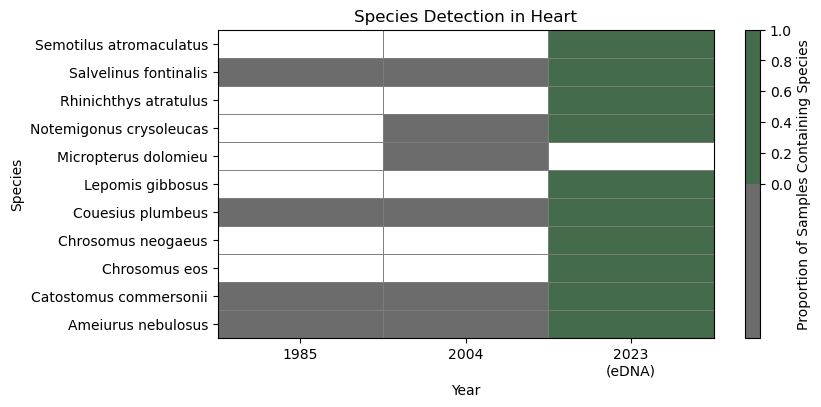

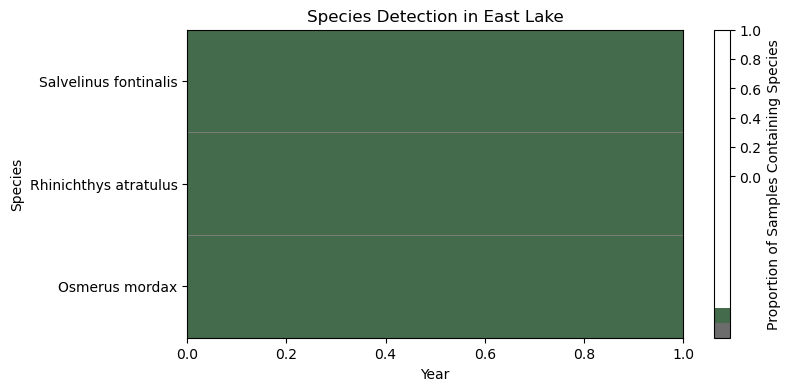

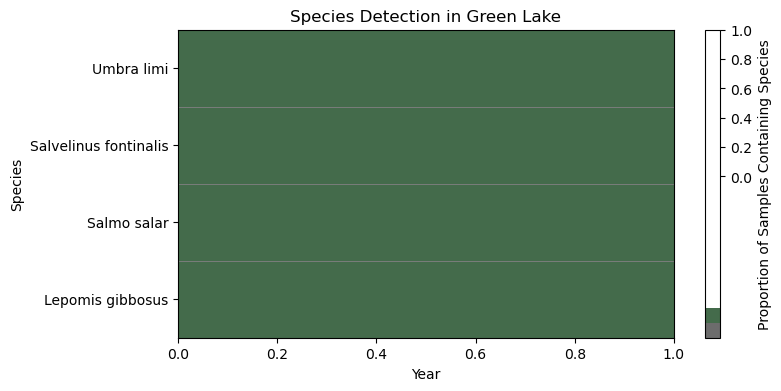

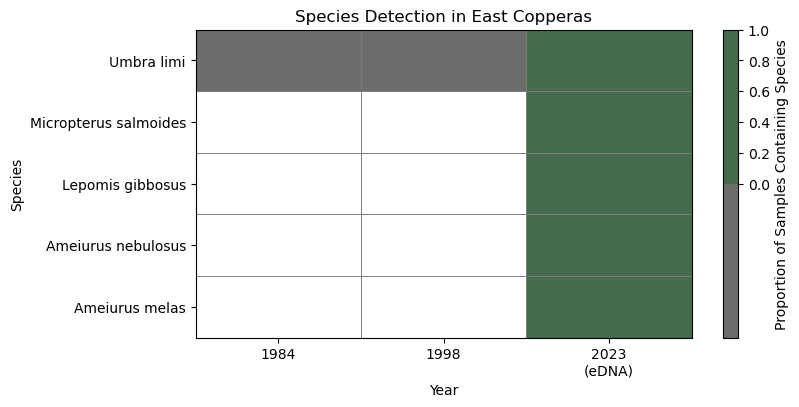

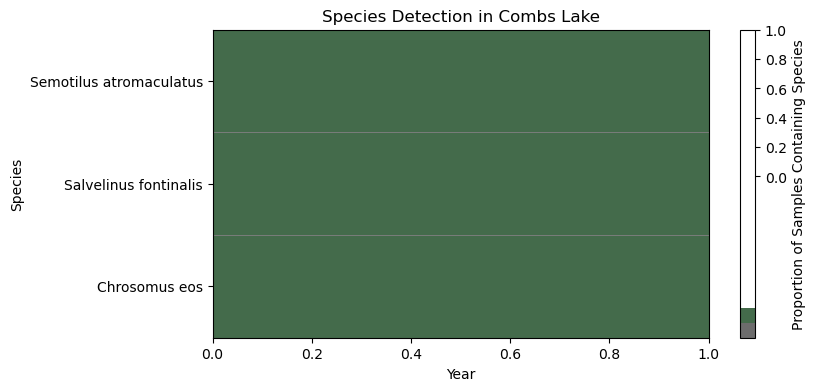

In [378]:
for lake_name in df.Name.unique():
    # Now create a pivot table: species as rows, years as columns, values as confidence category numbers
    lake_df = df[df['Name'] == lake_name].sort_values(["Species", "Fraction"], ascending = [False, True]).reset_index(drop=True)

    pivot = lake_df.pivot(index='Species', columns='Year', values='Fraction')

    # Set normalization boundaries between each category
    bounds = np.arange(len(confidence_levels) + 1) - 0.5
    norm = BoundaryNorm(bounds, cmap.N)

    # Plot
    plt.figure(figsize=(8, 4))
    heatmap = plt.pcolormesh(pivot.values, cmap=cmap, edgecolors='gray',# norm=norm, 
                             linewidth=0.5, shading='auto', alpha = 0.9)

    # Set ticks and labels
    if lake_name in ['East Lake', 'Green Lake', 'Combs Lake', 'Little Moose Lake']:
        pass
        #plt.xticks(ticks=np.arange(len(pivot.columns)) + 0.5, labels=["Prior to 2023", "2023\n(eDNA)"])
    else:
        plt.xticks(ticks=np.arange(len(pivot.columns)) + 0.5, labels=pivot.columns.tolist()[0:-1] + ["2023\n(eDNA)"])
    plt.yticks(ticks=np.arange(len(pivot.index)) + 0.5, labels=pivot.index)
    plt.title(f'Species Detection in {lake_name}')
    plt.xlabel('Year')
    plt.ylabel('Species')

    # Add a colorbar with confidence levels
    cbar = plt.colorbar(heatmap)
    cbar.set_label('Proportion of Samples Containing Species')
    cbar.set_ticks([0, 0.2, 0.4, 0.6, 0.8, 1])
    plt.savefig("../" + lake_name + "_change_curated_nsamples_color.pdf", dpi = 300,bbox_inches='tight')
    plt.savefig("../" + lake_name + "_change_curated_nsamples_color.jpg", dpi = 300,bbox_inches='tight')

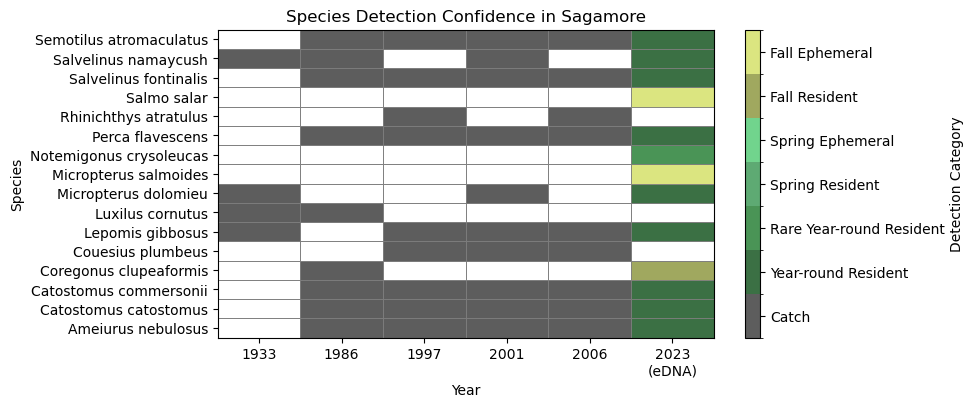

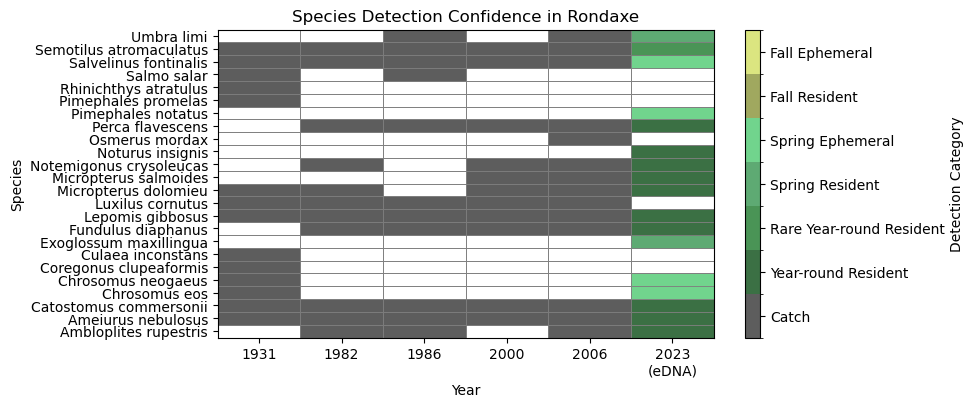

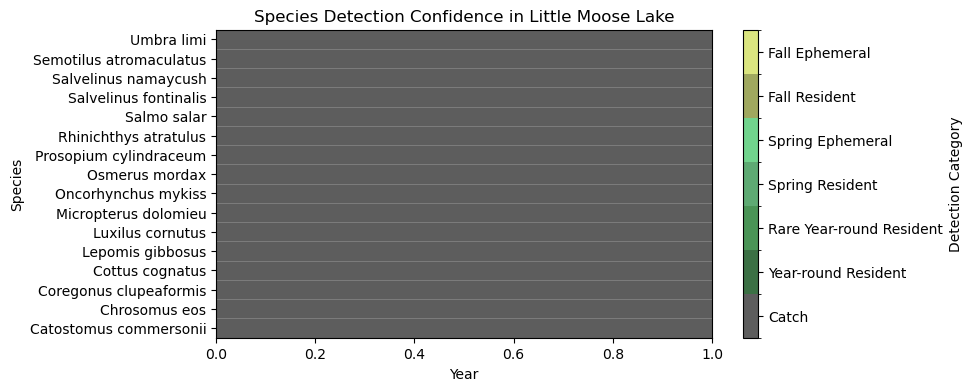

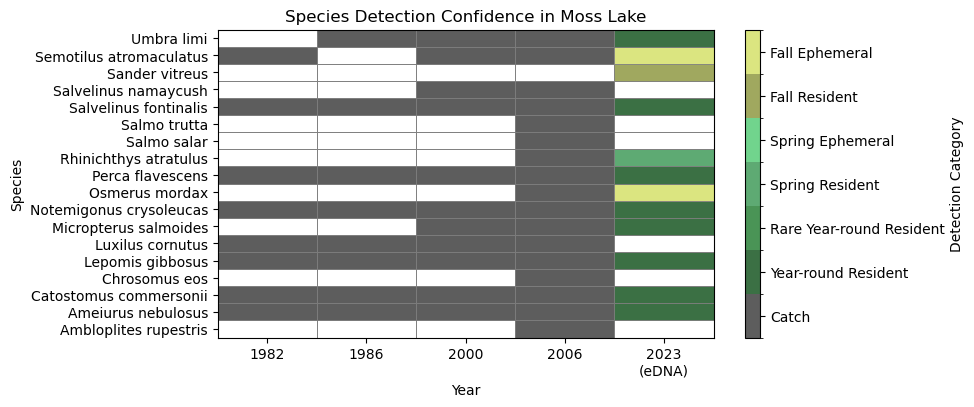

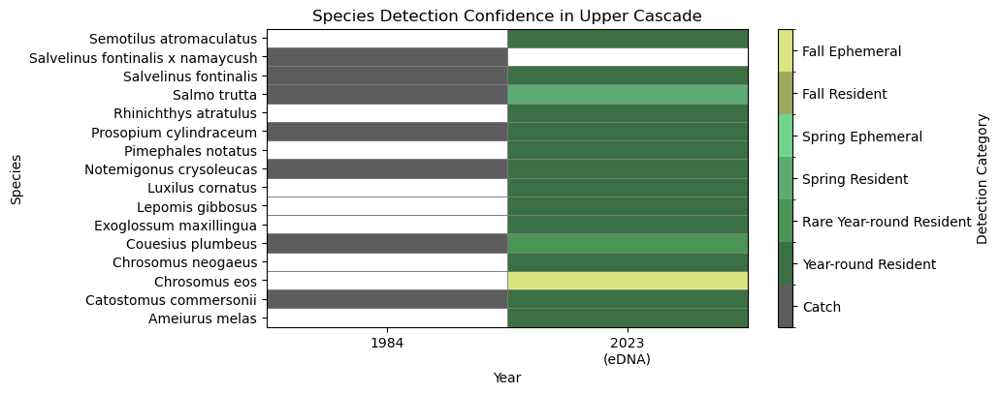

...

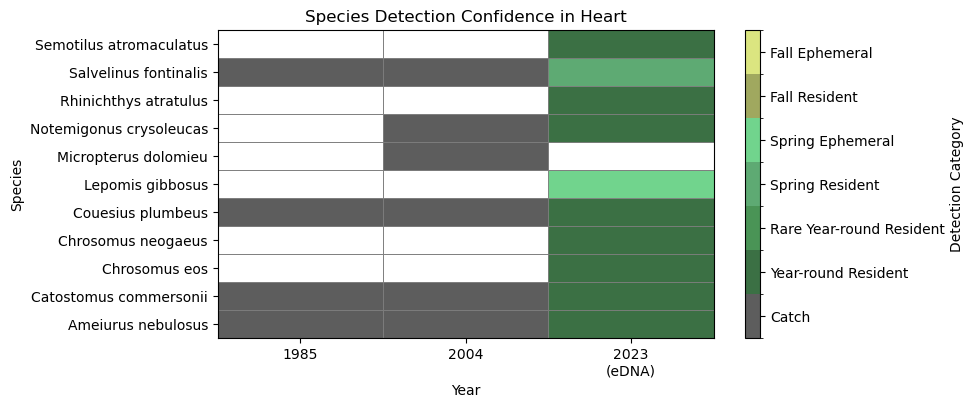

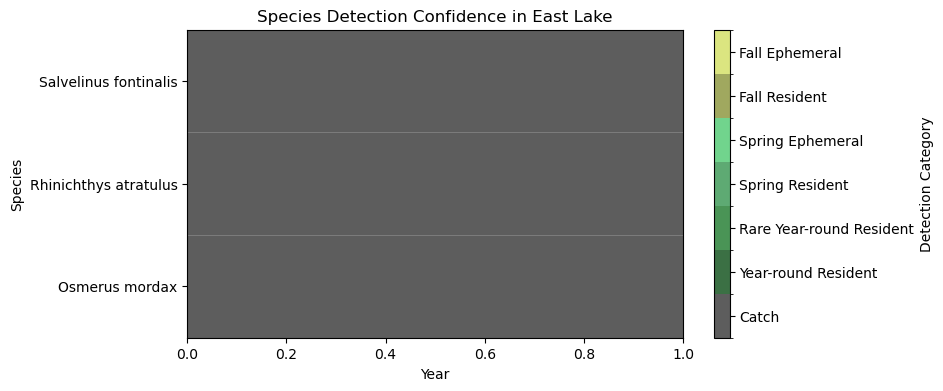

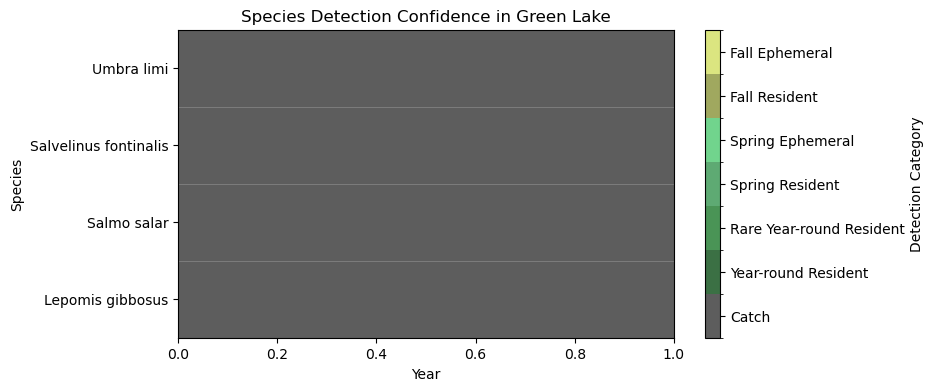

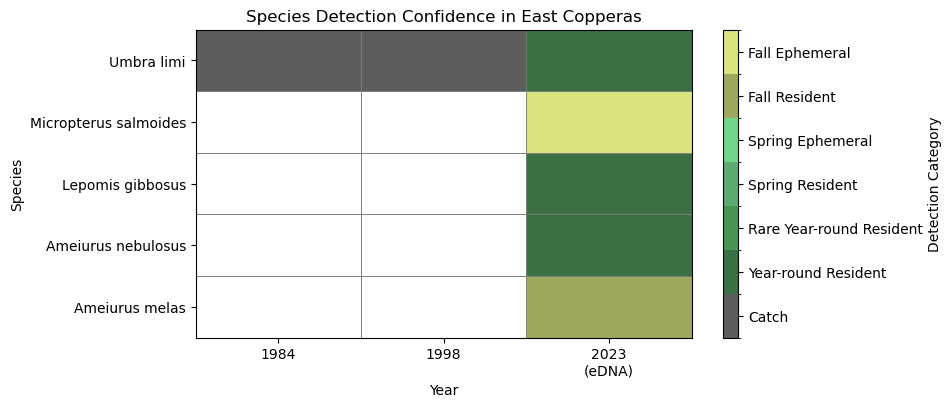

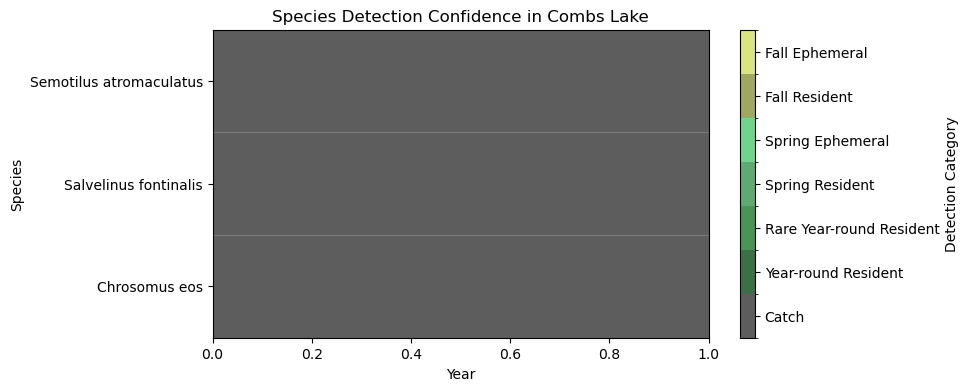

In [379]:
for lake_name in df.Name.unique():
    # Now create a pivot table: species as rows, years as columns, values as confidence category numbers
    lake_df = df[df['Name'] == lake_name].sort_values(["Species", "confidence_num"], ascending = [False, True]).reset_index(drop=True)

    pivot = lake_df.pivot(index='Species', columns='Year', values='confidence_num')

    # Create a color palette for the confidence levels
    colors = ['#4B4B4B',  # Dark grey
              '#25602f',  # Dark summery green
              '#368944', # light
              '#4ca164',  # dark spring
              '#62d081',  # light spring
              '#969f4d',  # dark fall
              '#d7e372']  # light fall
    cmap = ListedColormap(colors)

    # Set normalization boundaries between each category
    bounds = np.arange(len(confidence_levels) + 1) - 0.5
    norm = BoundaryNorm(bounds, cmap.N)

    # Plot
    plt.figure(figsize=(8, 4))
    heatmap = plt.pcolormesh(pivot.values, cmap=cmap, norm=norm, edgecolors='gray', 
                             linewidth=0.5, shading='auto', alpha = 0.9)

    # Set ticks and labels
    if lake_name in ['East Lake', 'Green Lake', 'Combs Lake', 'Little Moose Lake']:
        pass 
        #plt.xticks(ticks=np.arange(len(pivot.columns)) + 0.5, labels=["Prior to 2023", "2023\n(eDNA)"])
    else:
        plt.xticks(ticks=np.arange(len(pivot.columns)) + 0.5, labels=pivot.columns.tolist()[0:-1] + ["2023\n(eDNA)"])
    plt.yticks(ticks=np.arange(len(pivot.index)) + 0.5, labels=pivot.index)
    plt.title(f'Species Detection Confidence in {lake_name}')
    plt.xlabel('Year')
    plt.ylabel('Species')

    # Add a colorbar with confidence levels
    cbar = plt.colorbar(heatmap, ticks=range(len(confidence_levels)))
    cbar.ax.set_yticklabels(confidence_levels)
    cbar.set_label('Detection Category')

    plt.savefig("../" + lake_name + "_change_curated.pdf", dpi = 300)

In [435]:
accumulation_curves = pd.DataFrame()
for merge in metadata["Merged"][~metadata["Site"].isin(["PCR Blank", "Blank", "Extraction Blank"])][metadata["Merged"].notna()].unique().tolist()[-6:-5]:
    lake = merge.split("_")[0]
    season = merge.split("_")[1]
    tmp = (joined[metadata["EGCF-ID"]
                  [metadata["Name"] == lake]
                  [metadata["Season"] == season].tolist() + 
                  ["Overall_Best", "Overall_Best_Taxonomic_Level", "Genus", "Family"]]
           [joined["Primer"] == "MiFish"]).fillna(0).reset_index(drop=True)
    tmp = pd.concat([tmp[tmp.columns[0:-4]].loc[:, tmp[tmp.columns[0:-4]].sum(axis=0) > lowcov], tmp[tmp.columns[-4:]]], axis = 1)
    tmp['sum'] = tmp.sum(axis=1, numeric_only=True)
    tmp = tmp[tmp["sum"] > 0].reset_index(drop=True)
    
    for i in tmp["Overall_Best"][tmp["Overall_Best_Taxonomic_Level"] != "Species"]:
        tmp1 = tmp[tmp["Overall_Best"] == i]
        if tmp1["Overall_Best_Taxonomic_Level"].reset_index(drop=True)[0] == 'Family':
            tmp2 = tmp[tmp["Family"] == i]
            for col in tmp2.columns[:-5].tolist():
                tmp2[col] = (tmp2[col].values > 0).astype(np.uint8)
            tmp2 = tmp2.loc[tmp2[tmp2.columns[:-5].tolist()].duplicated(keep=False)]
            if len(tmp2) == 2:
                sp = tmp2["Overall_Best"][tmp2["Overall_Best_Taxonomic_Level"] == "Species"].reset_index(drop=True)[0]
                tmp.loc[tmp["Overall_Best"] == i, "Overall_Best"] = sp
        if tmp1["Overall_Best_Taxonomic_Level"].reset_index(drop=True)[0] == 'Genus':
            tmp2 = tmp[tmp["Genus"] == i]
            for col in tmp2.columns[:-5].tolist():
                tmp2[col] = (tmp2[col].values > 0).astype(np.uint8)
            tmp2 = tmp2.loc[tmp2[tmp2.columns[:-5].tolist()].duplicated(keep=False)]
            if len(tmp2) == 2:
                sp = tmp2["Overall_Best"][tmp2["Overall_Best_Taxonomic_Level"] == "Species"].reset_index(drop=True)[0]
                tmp.loc[tmp["Overall_Best"] == i, "Overall_Best"] = sp
    tmp = pd.concat([tmp[tmp.columns[:-4].tolist()].groupby('Overall_Best').transform('sum'), tmp["Overall_Best"]], axis = 1).drop_duplicates().reset_index(drop=True)
    tmp = tmp.set_index("Overall_Best").T.reset_index(drop=False)
    

/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3872142000.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tmp2[col] = (tmp2[col].values > 0).astype(np.uint8)


In [444]:
accumulation_curves = pd.DataFrame()
for merge in metadata["Merged"][~metadata["Site"].isin(["PCR Blank", "Blank", "Extraction Blank"])][metadata["Merged"].notna()].unique().tolist():
    lake = merge.split("_")[0]
    season = merge.split("_")[1]
    tmp = (joined[metadata["EGCF-ID"]
                  [metadata["Name"] == lake]
                  [metadata["Season"] == season].tolist() + 
                  ["Overall_Best", "Overall_Best_Taxonomic_Level", "Genus", "Family"]]
           [joined["Primer"] == "MiFish"]).fillna(0).reset_index(drop=True)
    tmp = pd.concat([tmp[tmp.columns[0:-4]].loc[:, tmp[tmp.columns[0:-4]].sum(axis=0) > lowcov], tmp[tmp.columns[-4:]]], axis = 1)
    tmp['sum'] = tmp.sum(axis=1, numeric_only=True)
    tmp = tmp[tmp["sum"] > 0].reset_index(drop=True)
    for i in tmp["Overall_Best"][tmp["Overall_Best_Taxonomic_Level"] != "Species"]:
        tmp1 = tmp[tmp["Overall_Best"] == i]
        if tmp1["Overall_Best_Taxonomic_Level"].reset_index(drop=True)[0] == 'Family':
            tmp2 = tmp[tmp["Family"] == i]
            for col in tmp2.columns[:-5].tolist():
                tmp2[col] = (tmp2[col].values > 0).astype(np.uint8)
            tmp2 = tmp2.loc[tmp2[tmp2.columns[:-5].tolist()].duplicated(keep=False)]
            if len(tmp2) == 2:
                sp = tmp2["Overall_Best"][tmp2["Overall_Best_Taxonomic_Level"] == "Species"].reset_index(drop=True)[0]
                tmp.loc[tmp["Overall_Best"] == i, "Overall_Best"] = sp
        if tmp1["Overall_Best_Taxonomic_Level"].reset_index(drop=True)[0] == 'Genus':
            tmp2 = tmp[tmp["Genus"] == i]
            for col in tmp2.columns[:-5].tolist():
                tmp2[col] = (tmp2[col].values > 0).astype(np.uint8)
            tmp2 = tmp2.loc[tmp2[tmp2.columns[:-5].tolist()].duplicated(keep=False)]
            if len(tmp2) == 2:
                sp = tmp2["Overall_Best"][tmp2["Overall_Best_Taxonomic_Level"] == "Species"].reset_index(drop=True)[0]
                tmp.loc[tmp["Overall_Best"] == i, "Overall_Best"] = sp
    tmp = pd.concat([tmp[tmp.columns[:-4].tolist()].groupby('Overall_Best').transform('sum'), tmp["Overall_Best"]], axis = 1).drop_duplicates().reset_index(drop=True)
    tmp = tmp.set_index("Overall_Best").T.reset_index(drop=False)
    tmp = tmp[tmp.columns[1:]]
    shuffles = []
    for shuff in list(range(0,1000)):
        tmp1 = tmp.copy()
        for tax in tmp.columns:
            tmp1[tax] = np.random.permutation(tmp[tax].values)
        for nsamps in list(range(1, len(tmp))):
            shuffles = shuffles + [[tmp1.sample(nsamps).agg({'sum'}).astype(bool).sum(axis=1).reset_index(drop=True)[0], nsamps]]
    shuffles = pd.DataFrame(shuffles, columns = ["Number of Species", "Number of Samples"])
    shuffles["Name"] = lake
    shuffles["Season"] = season
    accumulation_curves = pd.concat([accumulation_curves, shuffles]).reset_index(drop=True)

/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/2324387846.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tmp2[col] = (tmp2[col].values > 0).astype(np.uint8)
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/2324387846.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tmp2[col] = (tmp2[col].values > 0).astype(np.uint8)
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/2324387846.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

In [468]:
tmp

Overall_Best,Lepomis gibbosus,Catostomus commersonii,Semotilus atromaculatus,Umbra limi,Ameiurus nebulosus,Micropterus dolomieu,Salvelinus namaycush,Chrosomus eos,Osmerus mordax,Cottus cognatus
0,101585.0,0.0,12072.0,0.0,0.0,37406.0,0.0,0.0,3425.0,0.0
1,104257.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,27377.0,0.0
2,54946.0,0.0,58476.0,0.0,0.0,0.0,26966.0,5311.0,0.0,19760.0
3,114944.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,112972.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20229.0,0.0
5,48775.0,0.0,0.0,0.0,0.0,85986.0,0.0,0.0,6053.0,0.0
6,86284.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,252.0,0.0
7,96486.0,0.0,0.0,0.0,0.0,28449.0,0.0,0.0,518.0,0.0
8,110401.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,591.0,0.0
9,40103.0,10496.0,0.0,0.0,0.0,57639.0,0.0,0.0,0.0,0.0


In [467]:
accumulation_curves = pd.DataFrame()
for merge in metadata["Merged"][~metadata["Site"].isin(["PCR Blank", "Blank", "Extraction Blank"])][metadata["Merged"].notna()].unique().tolist()[-4:-3]:
    lake = merge.split("_")[0]
    season = merge.split("_")[1]
    tmp = (joined[metadata["EGCF-ID"]
                  [metadata["Name"] == lake]
                  [metadata["Season"] == season].tolist() + 
                  ["Overall_Best", "Overall_Best_Taxonomic_Level", "Genus", "Family"]]
           [joined["Primer"] == "MiFish"]).fillna(0).reset_index(drop=True)
    tmp['sum'] = tmp.sum(axis=1, numeric_only=True)
    tmp = tmp[tmp["sum"] > 0].reset_index(drop=True)
    for i in tmp["Overall_Best"][tmp["Overall_Best_Taxonomic_Level"] != "Species"]:
        tmp1 = tmp[tmp["Overall_Best"] == i]
        if tmp1["Overall_Best_Taxonomic_Level"].reset_index(drop=True)[0] == 'Family':
            tmp2 = tmp[tmp["Family"] == i]
            for col in tmp2.columns[:-5].tolist():
                tmp2[col] = (tmp2[col].values > 0).astype(np.uint8)
            tmp2 = tmp2.loc[tmp2[tmp2.columns[:-5].tolist()].duplicated(keep=False)]
            if len(tmp2) == 2:
                sp = tmp2["Overall_Best"][tmp2["Overall_Best_Taxonomic_Level"] == "Species"].reset_index(drop=True)[0]
                tmp.loc[tmp["Overall_Best"] == i, "Overall_Best"] = sp
        if tmp1["Overall_Best_Taxonomic_Level"].reset_index(drop=True)[0] == 'Genus':
            tmp2 = tmp[tmp["Genus"] == i]
            for col in tmp2.columns[:-5].tolist():
                tmp2[col] = (tmp2[col].values > 0).astype(np.uint8)
            tmp2 = tmp2.loc[tmp2[tmp2.columns[:-5].tolist()].duplicated(keep=False)]
            if len(tmp2) == 2:
                sp = tmp2["Overall_Best"][tmp2["Overall_Best_Taxonomic_Level"] == "Species"].reset_index(drop=True)[0]
                tmp.loc[tmp["Overall_Best"] == i, "Overall_Best"] = sp
    tmp = pd.concat([tmp[tmp.columns[:-4].tolist()].groupby('Overall_Best').transform('sum'), tmp["Overall_Best"]], axis = 1).drop_duplicates().reset_index(drop=True)
    tmp = tmp.set_index("Overall_Best").T.reset_index(drop=False)
    tmp['sum'] = tmp.sum(axis=1, numeric_only=True)
    tmp = tmp[tmp["sum"] > lowcov]
    tmp = tmp[tmp.columns[1:-1]]

/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3940774531.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tmp2[col] = (tmp2[col].values > 0).astype(np.uint8)
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3940774531.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tmp2[col] = (tmp2[col].values > 0).astype(np.uint8)


In [1029]:
accumulation_curves = pd.DataFrame()
for merge in ["Little Clear_Early Fall"]:
    lake = merge.split("_")[0]
    season = merge.split("_")[1]
    tmp = (joined[metadata["EGCF-ID"]
                  [metadata["Name"] == lake]
                  [metadata["Season"] == season].tolist() + 
                  ["Overall_Best", "Overall_Best_Taxonomic_Level", "Genus", "Family"]]
           [joined["Primer"] == "MiFish"]).fillna(0).reset_index(drop=True)
    tmp['sum'] = tmp.sum(axis=1, numeric_only=True)
    tmp = tmp[tmp["sum"] > 0].reset_index(drop=True)

In [1030]:
tmp

,387,378,379,380,385,...,Overall_Best,Overall_Best_Taxonomic_Level,Genus,Family,sum
0,13030.0,0.0,0.0,0.0,0.0,...,Lepomis,Genus,Lepomis,Centrarchidae,44621.0
1,17718.0,0.0,0.0,0.0,0.0,...,Lepomis gibbosus,Species,Lepomis,Centrarchidae,61723.0
2,57690.0,0.0,109171.0,0.0,52685.0,...,Salvelinus fontinalis,Species,Salvelinus,Salmonidae,442515.0
3,63038.0,85519.0,88936.0,115267.0,68897.0,...,Ameiurus nebulosus,Species,Ameiurus,Ictaluridae,1021517.0
4,0.0,0.0,0.0,0.0,0.0,...,Ameiurus,Genus,Ameiurus,Ictaluridae,156.0


In [1027]:
accumulation_curves = pd.DataFrame()
for merge in ["Little Clear_Early Fall"]:
    lake = merge.split("_")[0]
    season = merge.split("_")[1]
    tmp = (joined[metadata["EGCF-ID"]
                  [metadata["Name"] == lake]
                  [metadata["Season"] == season].tolist() + 
                  ["Overall_Best", "Overall_Best_Taxonomic_Level", "Genus", "Family"]]
           [joined["Primer"] == "MiFish"]).fillna(0).reset_index(drop=True)
    tmp['sum'] = tmp.sum(axis=1, numeric_only=True)
    tmp = tmp[tmp["sum"] > 0].reset_index(drop=True)
    for i in tmp["Overall_Best"][tmp["Overall_Best_Taxonomic_Level"] != "Species"]:
        tmp1 = tmp[tmp["Overall_Best"] == i]
        if tmp1["Overall_Best_Taxonomic_Level"].reset_index(drop=True)[0] == 'Family':
            tmp2 = tmp[tmp["Family"] == i]
            for col in tmp2.columns[:-5].tolist():
                tmp2[col] = (tmp2[col].values > 0).astype(np.uint8)
            tmp2 = tmp2.loc[tmp2[tmp2.columns[:-5].tolist()].duplicated(keep=False)]
            if len(tmp2) == 2:
                sp = tmp2["Overall_Best"][tmp2["Overall_Best_Taxonomic_Level"] == "Species"].reset_index(drop=True)[0]
                tmp.loc[tmp["Overall_Best"] == i, "Overall_Best"] = sp
        if tmp1["Overall_Best_Taxonomic_Level"].reset_index(drop=True)[0] == 'Genus':
            tmp2 = tmp[tmp["Genus"] == i]
            for col in tmp2.columns[:-5].tolist():
                tmp2[col] = (tmp2[col].values > 0).astype(np.uint8)
            tmp2 = tmp2.loc[tmp2[tmp2.columns[:-5].tolist()].duplicated(keep=False)]
            if len(tmp2) == 2:
                sp = tmp2["Overall_Best"][tmp2["Overall_Best_Taxonomic_Level"] == "Species"].reset_index(drop=True)[0]
                tmp.loc[tmp["Overall_Best"] == i, "Overall_Best"] = sp
    tmp = pd.concat([tmp[tmp.columns[:-4].tolist()].groupby('Overall_Best').transform('sum'), tmp["Overall_Best"]], axis = 1).drop_duplicates().reset_index(drop=True)
    tmp = tmp.set_index("Overall_Best").T.reset_index(drop=False)
    tmp['sum'] = tmp.sum(axis=1, numeric_only=True)
    tmp = tmp[tmp["sum"] > lowcov]
    tmp = tmp[tmp.columns[1:-1]]

/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/4252416158.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tmp2[col] = (tmp2[col].values > 0).astype(np.uint8)
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/4252416158.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tmp2[col] = (tmp2[col].values > 0).astype(np.uint8)


In [1028]:
tmp

Overall_Best,Lepomis gibbosus,Salvelinus fontinalis,Ameiurus nebulosus,Ameiurus
0,30748.0,57690.0,63038.0,0.0
1,0.0,0.0,85519.0,0.0
2,0.0,109171.0,88936.0,0.0
3,0.0,0.0,115267.0,0.0
4,0.0,52685.0,68897.0,0.0
6,75596.0,0.0,53319.0,0.0
8,0.0,0.0,122126.0,0.0
10,0.0,0.0,110520.0,0.0
11,0.0,0.0,109968.0,0.0
12,0.0,131998.0,10978.0,0.0


In [406]:
accumulation_curves = pd.DataFrame()
for merge in metadata["Merged"][~metadata["Site"].isin(["PCR Blank", "Blank", "Extraction Blank"])][metadata["Merged"].notna()].unique().tolist():
    lake = merge.split("_")[0]
    season = merge.split("_")[1]
    tmp = (joined[metadata["EGCF-ID"]
                  [metadata["Name"] == lake]
                  [metadata["Season"] == season].tolist() + 
                  ["Overall_Best", "Overall_Best_Taxonomic_Level", "Genus", "Family"]]
           [joined["Primer"] == "MiFish"]).fillna(0).reset_index(drop=True)
    tmp['sum'] = tmp.sum(axis=1, numeric_only=True)
    tmp = tmp[tmp["sum"] > 0].reset_index(drop=True)
    for i in tmp["Overall_Best"][tmp["Overall_Best_Taxonomic_Level"] != "Species"]:
        tmp1 = tmp[tmp["Overall_Best"] == i]
        if tmp1["Overall_Best_Taxonomic_Level"].reset_index(drop=True)[0] == 'Family':
            tmp2 = tmp[tmp["Family"] == i]
            for col in tmp2.columns[:-5].tolist():
                tmp2[col] = (tmp2[col].values > 0).astype(np.uint8)
            tmp2 = tmp2.loc[tmp2[tmp2.columns[:-5].tolist()].duplicated(keep=False)]
            if len(tmp2) == 2:
                sp = tmp2["Overall_Best"][tmp2["Overall_Best_Taxonomic_Level"] == "Species"].reset_index(drop=True)[0]
                tmp.loc[tmp["Overall_Best"] == i, "Overall_Best"] = sp
        if tmp1["Overall_Best_Taxonomic_Level"].reset_index(drop=True)[0] == 'Genus':
            tmp2 = tmp[tmp["Genus"] == i]
            for col in tmp2.columns[:-5].tolist():
                tmp2[col] = (tmp2[col].values > 0).astype(np.uint8)
            tmp2 = tmp2.loc[tmp2[tmp2.columns[:-5].tolist()].duplicated(keep=False)]
            if len(tmp2) == 2:
                sp = tmp2["Overall_Best"][tmp2["Overall_Best_Taxonomic_Level"] == "Species"].reset_index(drop=True)[0]
                tmp.loc[tmp["Overall_Best"] == i, "Overall_Best"] = sp
    tmp = pd.concat([tmp[tmp.columns[:-4].tolist()].groupby('Overall_Best').transform('sum'), tmp["Overall_Best"]], axis = 1).drop_duplicates().reset_index(drop=True)
    tmp = tmp.set_index("Overall_Best").T.reset_index(drop=False)
    tmp['sum'] = tmp.sum(axis=1, numeric_only=True)
    tmp = tmp[tmp["sum"] > lowcov]
    tmp = tmp[tmp.columns[1:-1]]
    shuffles = []
    for shuff in list(range(0,1000)):
        tmp1 = tmp.copy()
        for tax in tmp.columns:
            tmp1[tax] = np.random.permutation(tmp[tax].values)
        for nsamps in list(range(1, len(tmp))):
            shuffles = shuffles + [[tmp1.sample(nsamps).agg({'sum'}).astype(bool).sum(axis=1).reset_index(drop=True)[0], nsamps]]
    shuffles = pd.DataFrame(shuffles, columns = ["Number of Species", "Number of Samples"])
    shuffles["Name"] = lake
    shuffles["Season"] = season
    accumulation_curves = pd.concat([accumulation_curves, shuffles]).reset_index(drop=True)

/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/999699307.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tmp2[col] = (tmp2[col].values > 0).astype(np.uint8)
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/999699307.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tmp2[col] = (tmp2[col].values > 0).astype(np.uint8)
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/999699307.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.

In [445]:
accumulation_curves.to_csv("../accumulation_curves_curated_problematic_removed.csv", index = False)

In [983]:
accumulation_curves = pd.read_csv("../accumulation_curves_curated_problematic_removed.csv")

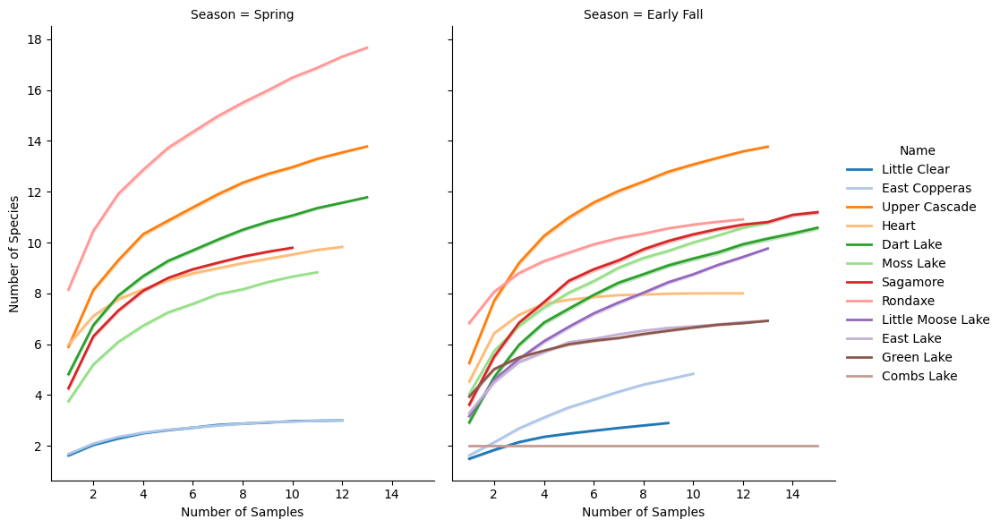

In [447]:
g = sns.FacetGrid(accumulation_curves[accumulation_curves["Number of Samples"] <= 15].reset_index(drop=True),
                  col="Season", hue = "Name", palette = "tab20", height=6, aspect=0.8)

# Map a scatterplot to the grid
g.map_dataframe(sns.lineplot, x = "Number of Samples", y = "Number of Species", lw = 2)
g.add_legend()
#plt.savefig("../accumulation_plot_15samps.pdf", dpi = 300, bbox_inches='tight')

In [984]:
# Function to calculate RSS
def calculate_rss(y_data, y_model):
    return np.sum((y_data - y_model) ** 2)

# 1. Michaelis-Menten model (Basic)
def michaelis_menten(x, K, C, B):
    return (K * x) / (x + C)

# 2. Hill function model
def hill_function(x, K, C, n):
    return (K * x**n) / (C**n + x**n)

# 3. Generalized Logistic model
def generalized_logistic(x, K, B, C):
    return K / (1 + np.exp(-B * (x - C)))

# 4. Logistic Growth (Standard S-shaped curve)
def logistic_growth(x, K, r, x0):
    return K / (1 + np.exp(-r * (x - x0)))

# 5. Richards Curve (generalized logistic curve)
def richards(x, K, r, x0, v):
    return K / (1 + np.exp(-r * (x - x0)))**(1/v)

# 6. Gompertz Curve (asymptotic curve)
def gompertz(x, K, r, x0):
    return K * np.exp(-np.exp(-r * (x - x0)))

# 7. Exponential Decay (Inverted)
def exp_decay(x, A, B, C):
    return A * np.exp(-B * (x - C))

# 8. Shifted Logistic Growth (shifted S-curve)
def shifted_logistic(x, K, r, x0):
    return K / (1 + np.exp(-r * (x - x0)))

# 9. Exponential Growth Model (inverse of decay)
def exp_growth(x, A, r, C):
    return A * np.exp(r * (x - C))

# 10. Monod Equation (a variant of Michaelis-Menten)
def monod(x, K, S, B):
    return (K * x) / (S + x)

# 11. Humboldt Growth Curve (another biological growth model)
def humboldt_growth(x, K, r, x0):
    return K / (1 + np.exp(-r * (x - x0)))

# 12. Barton Curve (used in environmental sciences)
def barton_curve(x, A, B, C):
    return A / (1 + np.exp(-B * (x - C)))

models = {
    "Michaelis-Menten": michaelis_menten,
    "Hill": hill_function,
    "Generalized Logistic": generalized_logistic,
    "Logistic Growth": logistic_growth,
    "Richards": richards,
    "Gompertz": gompertz,
    "Exponential Decay": exp_decay,
    "Shifted Logistic": shifted_logistic,
    "Exponential Growth": exp_growth,
    "Monod": monod,
    "Humboldt Growth": humboldt_growth,
    "Barton Curve": barton_curve
}

# Initial parameter guesses for each model
initial_guesses = {
    "Michaelis-Menten": [50, 10, 2],
    "Hill": [50, 20, 2],
    "Generalized Logistic": [50, 0.1, 20],
    "Logistic Growth": [50, 0.1, 20],
    "Richards": [50, 0.1, 20, 1],
    "Gompertz": [50, 0.1, 20],
    "Exponential Decay": [50, 0.1, 10],
    "Shifted Logistic": [50, 0.1, 20],
    "Exponential Growth": [50, 0.1, 10],
    "Monod": [50, 20, 0.1],
    "Humboldt Growth": [50, 0.1, 20],
    "Barton Curve": [50, 0.1, 20]
}

model_bounds = {
    "Michaelis-Menten": ([0, -np.inf, -np.inf], [80, np.inf, np.inf]),
    "Hill": ([0, -np.inf, -np.inf], [80, np.inf, np.inf]),
    "Generalized Logistic": ([0, -np.inf, -np.inf], [80, np.inf, np.inf]),
    "Logistic Growth": ([0, -np.inf, -np.inf], [80, np.inf, np.inf]),
    "Richards": ([0, -np.inf, -np.inf, -np.inf], [80, np.inf, np.inf, np.inf]),
    "Gompertz": ([0, -np.inf, -np.inf], [80, np.inf, np.inf]),
    "Exponential Decay": ([0, -np.inf, -np.inf], [80, np.inf, np.inf]),
    "Shifted Logistic": ([0, -np.inf, -np.inf], [80, np.inf, np.inf]),
    "Exponential Growth": ([0, -np.inf, -np.inf], [80, np.inf, np.inf]),
    "Monod": ([0, -np.inf, -np.inf], [80, np.inf, np.inf]),
    "Humboldt Growth": ([0, -np.inf, -np.inf], [80, np.inf, np.inf]),
    "Barton Curve": ([0, -np.inf, -np.inf], [80, np.inf, np.inf])
}

In [449]:
lakes = metadata[metadata["Merged"].notna()].reset_index(drop=True)
lakes = lakes["Merged"][~lakes["Merged"].str.contains("Blank")].unique().tolist()

In [450]:
best_models_by_lake = {}
fitted_data = pd.DataFrame()
for lake in lakes:
    # Store results
    best_rss = np.inf
    best_curve = None
    best_params = None
    best_y_fit = None
    
    rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]
           [accumulation_curves["Season"] == lake.split("_")[1]])
    rawdata = rawdata.groupby(["Name", "Season", "Number of Samples"]).mean().reset_index()
    x_data = np.append([0], np.array(rawdata["Number of Samples"]))
    y_data = np.append([0], np.array(rawdata["Number of Species"]))

    # Try fitting each curve type
    for curve_name in list(models.keys()):
        try:
            # Fit the curve
            popt, _ = curve_fit(models[curve_name], x_data, y_data, 
                                p0=initial_guesses[curve_name], 
                                bounds=model_bounds[curve_name],
                                maxfev=50000)

            # Calculate the fitted values
            y_fit = models[curve_name](x_data, *popt)

            # Calculate RSS
            rss = calculate_rss(y_data, y_fit)

            # Store the best model
            if rss < best_rss:
                best_rss = rss
                best_curve = curve_name
                best_params = popt
                best_y_fit = y_fit

            #print(f"Curve: {curve_name}, RSS: {rss}")

        except Exception as e:
            print(f"Error fitting {curve_name}: {e}")

    x_fit = np.linspace(min(x_data), max(x_data) + 1000, 1000)
    y_fit = models[best_curve](x_fit, *best_params)

    # Output best model and parameters
    print(f"\nBest curve: {best_curve}")
    print(f"Best parameters: {best_params}")
    print(f"Best RSS: {best_rss}")
    
    best_models_by_lake[lake] = [best_curve, best_params, best_rss]
    tmp = pd.DataFrame()
    tmp["Number of Samples"] = x_fit
    tmp["Number of Species"] = y_fit
    tmp["Name"] = lake.split("_")[0]
    tmp["Season"] = lake.split("_")[1]
    fitted_data = pd.concat([fitted_data, tmp]).reset_index(drop=True)

/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]



Best curve: Hill
Best parameters: [3.72172358 1.47815308 0.70868155]
Best RSS: 0.004283136036139031

Best curve: Hill
Best parameters: [5.86964517 9.5924976  0.48165627]
Best RSS: 0.003089437123170597


/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]



Best curve: Hill
Best parameters: [5.98210410e+01 1.06615997e+03 5.19085201e-01]
Best RSS: 0.014982344197525222

Best curve: Hill
Best parameters: [3.67264169 1.30276863 0.69099585]
Best RSS: 0.0015977584942162566


/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3696820392.py:11: RuntimeWarning: divide by zero encountered in power
  return (K * x**n) / (C**n + x**n)
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3696820392.py:11: RuntimeWarning: invalid value encountered in divide
  return (K * x**n) / (C**n + x**n)
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3696820392.py:11: RuntimeWarning: divide by zero encountered in power
  return (K * x**n) / (C**n + x**n)
/fs/dss/scratch/7338030_noge4093_mpc


Best curve: Hill
Best parameters: [19.5632286   3.5020809   0.65252745]
Best RSS: 0.059301484400464975

Best curve: Hill
Best parameters: [17.08906636  2.53197114  0.86223026]
Best RSS: 0.014207752450294448


/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3696820392.py:11: RuntimeWarning: divide by zero encountered in power
  return (K * x**n) / (C**n + x**n)
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3696820392.py:11: RuntimeWarning: invalid value encountered in divide
  return (K * x**n) / (C**n + x**n)
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3696820392.py:11: RuntimeWarning: divide by zero encountered in power
  return (K * x**n) / (C**n + x**n)
/fs/dss/scratch/7338030_noge4093_mpc


Best curve: Hill
Best parameters: [14.66845386  2.34573936  0.42769638]
Best RSS: 0.00855580139248194

Best curve: Hill
Best parameters: [8.1619094  0.87864753 1.63446873]
Best RSS: 0.014193270358129348


/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3696820392.py:11: RuntimeWarning: divide by zero encountered in power
  return (K * x**n) / (C**n + x**n)
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3696820392.py:11: RuntimeWarning: invalid value encountered in divide
  return (K * x**n) / (C**n + x**n)
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]



Best curve: Hill
Best parameters: [16.26518542  3.34438519  0.69789317]
Best RSS: 0.03688223903480358

Best curve: Hill
Best parameters: [18.63553258  9.74035866  0.67553603]
Best RSS: 0.45840276089809684


/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3696820392.py:11: RuntimeWarning: divide by zero encountered in power
  return (K * x**n) / (C**n + x**n)
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3696820392.py:11: RuntimeWarning: invalid value encountered in divide
  return (K * x**n) / (C**n + x**n)
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3696820392.py:11: RuntimeWarning: divide by zero encountered in power
  return (K * x**n) / (C**n + x**n)
/fs/dss/scratch/7338030_noge4093_mpc


Best curve: Hill
Best parameters: [12.38232741  3.14345063  0.7237741 ]
Best RSS: 0.005341298549568986

Best curve: Hill
Best parameters: [18.70766332  7.93438649  0.61080316]
Best RSS: 0.030481400471307204


/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3696820392.py:11: RuntimeWarning: divide by zero encountered in power
  return (K * x**n) / (C**n + x**n)
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3696820392.py:11: RuntimeWarning: invalid value encountered in divide
  return (K * x**n) / (C**n + x**n)



Best curve: Hill
Best parameters: [15.11750952  3.91712527  0.80558191]
Best RSS: 0.22235400719928775

Best curve: Hill
Best parameters: [11.29525234  1.61923456  1.02337036]
Best RSS: 0.007517534854704774


/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3696820392.py:11: RuntimeWarning: divide by zero encountered in power
  return (K * x**n) / (C**n + x**n)
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3696820392.py:11: RuntimeWarning: invalid value encountered in divide
  return (K * x**n) / (C**n + x**n)
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3696820392.py:11: RuntimeWarning: divide by zero encountered in power
  return (K * x**n) / (C**n + x**n)
/fs/dss/scratch/7338030_noge4093_mpc


Best curve: Hill
Best parameters: [39.30428396 21.08531711  0.43497194]
Best RSS: 0.05943858526453836

Best curve: Hill
Best parameters: [14.63467251  1.31304195  0.49017226]
Best RSS: 0.0036098110010792635


/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]



Best curve: Hill
Best parameters: [31.14783275 58.55744201  0.52726262]
Best RSS: 0.031962931102130575

Best curve: Hill
Best parameters: [7.65668772 1.34825047 0.98478102]
Best RSS: 0.011831912374564392


/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3873034399.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rawdata = (accumulation_curves[accumulation_curves["Name"] == lake.split("_")[0]]



Best curve: Hill
Best parameters: [8.26501105 1.1014499  0.64178089]
Best RSS: 0.03953852339037262

Best curve: Gompertz
Best parameters: [ 2.         28.34662651  0.11165296]
Best RSS: 1.41442112644788e-20


In [451]:
fitted_data.to_csv("../fitted_data_curated_problematic_removed.csv", index = False)

In [985]:
fitted_data = pd.read_csv("../fitted_data_curated_problematic_removed.csv")

In [453]:
best_models = pd.DataFrame(best_models_by_lake).T.reset_index(drop=False)
best_models.columns = ["Lake", "Function", "Parameters", "RSS"]

In [454]:
best_models.to_csv("../fitted_curves_curated_problematic_removed.csv", index = False)

In [986]:
best_models = pd.read_csv("../fitted_curves_curated_problematic_removed.csv")

In [987]:
plotting_accumulation = accumulation_curves.groupby(["Name", "Season", "Number of Samples"]).mean().reset_index()

In [1023]:
all_lakes = metadata["Name"].unique()
all_lakes = [i for i in all_lakes if i not in ["PCR Blank", "Extraction Blank", "Field Blank", np.nan]]

In [1024]:
ninety = pd.DataFrame()
for i in all_lakes:
    for season in ["Early Fall", "Spring"]:
        try:
            #if best_models_by_lake[i + "_" + season][0] in ["Hill",'Michaelis-Menten']:
            tmp = (fitted_data
             [fitted_data["Name"] == i]
             [fitted_data["Season"] == season]
             [fitted_data["Number of Species"] > (best_models_by_lake[i + "_" + season][1][0] * 0.8)]
             .reset_index(drop=True).head(1))
            ninety = pd.concat([ninety, tmp]).reset_index(drop=True)
        except:
            pass

/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/4237693457.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  tmp = (fitted_data
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/4237693457.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  tmp = (fitted_data
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/4237693457.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  tmp = (fitted_data
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/4237693457.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  tmp = (fitted_data
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/4237693457.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  tmp = (fitted_data
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/4237693457.py:6: UserWarning: Boolean Series key will be reindexed to match DataFr

In [1025]:
ninety

,Number of Samples,Number of Species,Name,Season
0,170.691692,4.696031,Little Clear,Early Fall
1,11.143143,3.003967,Little Clear,Spring
2,10.130130,2.956134,East Copperas,Spring
3,13.182182,13.769351,Upper Cascade,Early Fall
4,29.406406,15.657432,Upper Cascade,Spring
5,3.039039,7.212921,Heart,Early Fall
6,60.780781,11.748159,Heart,Spring
7,76.370370,14.922861,Dart Lake,Early Fall
8,25.350350,13.082600,Dart Lake,Spring
9,77.065065,14.973107,Moss Lake,Early Fall


In [459]:
for i in all_lakes:
    for season in ["Early Fall", "Spring"]:
        try:
            #if best_models_by_lake[i + "_" + season][0] in ["Hill",'Michaelis-Menten']:
            print((i, season, best_models_by_lake[i + "_" + season][1][0] * 0.9999))
        except:
            pass

('Little Clear', 'Early Fall', 5.869058205770717)
('Little Clear', 'Spring', 3.7213514081583523)
('East Copperas', 'Early Fall', 59.815058847140065)
('East Copperas', 'Spring', 3.672274429683206)
('Upper Cascade', 'Early Fall', 17.087357455370654)
('Upper Cascade', 'Spring', 19.56127227348263)
('Heart', 'Early Fall', 8.161093213673459)
('Heart', 'Spring', 14.66698701876297)
('Dart Lake', 'Early Fall', 18.63366902973092)
('Dart Lake', 'Spring', 16.263558903674973)
('Moss Lake', 'Early Fall', 18.705792550608784)
('Moss Lake', 'Spring', 12.381089177407995)
('Sagamore', 'Early Fall', 15.115997765476484)
('Sagamore', 'Spring', 11.294122813329624)
('Rondaxe', 'Early Fall', 14.633209047182525)
('Rondaxe', 'Spring', 39.300353530128454)
('Little Moose Lake', 'Early Fall', 31.144717969354282)
('East Lake', 'Early Fall', 7.655922046857528)
('Green Lake', 'Early Fall', 8.264184546690753)
('Combs Lake', 'Early Fall', 1.999800000015713)


In [460]:
plt.rcParams['pdf.fonttype'] = 42

/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3152928076.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.lineplot(data = (fitted_data[fitted_data["Name"] == i]
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3152928076.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.lineplot(data = (fitted_data[fitted_data["Name"] == i]
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3152928076.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.lineplot(data = (fitted_data[fitted_data["Name"] == i]
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3152928076.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.lineplot(data = (fitted_data[fitted_data["Name"] == i]
/fs/dss/scratch/7338030_noge4093_mpcs045/ipykernel_633155/3152928076.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
 

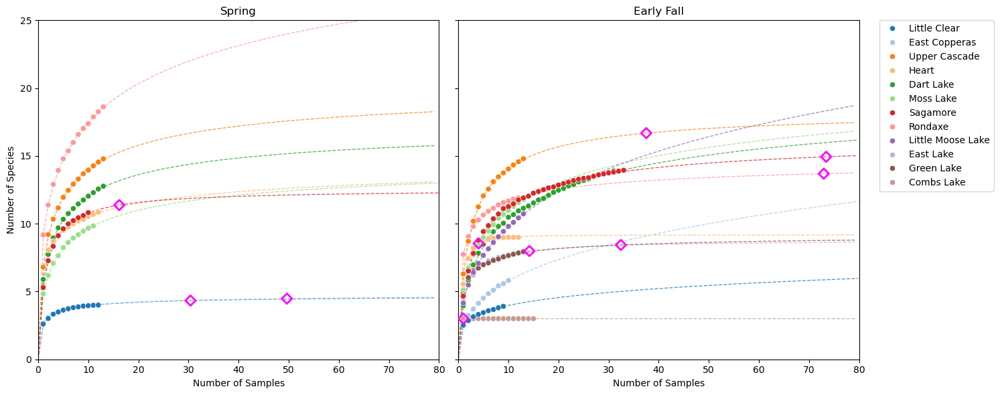

In [423]:
fig, axes = plt.subplots(1, 2, figsize=(15, 6), sharey=True)

for i in all_lakes:
    try:
        sns.lineplot(data = (fitted_data[fitted_data["Name"] == i]
                         [fitted_data["Season"] == "Spring"]
                         [fitted_data["Number of Samples"] <= 80]).reset_index(drop=True), 
                   x = "Number of Samples", y = "Number of Species", palette = "tab20", linestyle='--',
                     hue = "Name", lw = 1, legend = False, hue_order=all_lakes, ax=axes[0], alpha = 0.75)
    except:
        pass
sns.scatterplot(data = plotting_accumulation[plotting_accumulation["Season"] == "Spring"].reset_index(drop=True), 
               x = "Number of Samples", y = "Number of Species", palette = "tab20",
                hue = "Name", zorder=7, ax=axes[0], legend = False, hue_order=all_lakes)#, legend = False)
ax1 = axes[0]
ax1.scatter(x = ninety["Number of Samples"][ninety["Season"] == "Spring"], 
            y = ninety["Number of Species"][ninety["Season"] == "Spring"],
                edgecolors = "magenta", marker = 'D', facecolors='none', 
            s = 60, zorder=8, lw=2.0)


for i in all_lakes:
    try:
        sns.lineplot(data = (fitted_data[fitted_data["Name"] == i]
                         [fitted_data["Season"] == "Early Fall"]
                         [fitted_data["Number of Samples"] <= 80]).reset_index(drop=True), 
                   x = "Number of Samples", y = "Number of Species", palette = "tab20", linestyle='--',
                     hue = "Name", lw = 1, legend = False, hue_order=all_lakes, ax=axes[1], alpha = 0.75)
    except:
        pass
sns.scatterplot(data = plotting_accumulation[plotting_accumulation["Season"] == "Early Fall"].reset_index(drop=True), 
               x = "Number of Samples", y = "Number of Species", palette = "tab20",
                hue = "Name", zorder=7, ax=axes[1], hue_order=all_lakes)
ax2 = axes[1]
ax2.scatter(x = ninety["Number of Samples"][ninety["Season"] == "Early Fall"], 
            y = ninety["Number of Species"][ninety["Season"] == "Early Fall"],
                edgecolors = "magenta", marker = 'D', facecolors='none', 
            s = 60, zorder=8, lw=2.0)


axes[0].set_title("Spring")
axes[1].set_title("Early Fall")
# Add legend (shared between both subplots)
axes[0].set_xlim(0, 80)
axes[0].set_ylim(0, 25)
axes[1].set_xlim(0, 80)
axes[1].set_ylim(0, 25)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.tight_layout()
plt.savefig("../extrapolated_accumulation_curated_problematic_removed.pdf", dpi = 300)

In [38]:
import numpy as np
import pandas as pd
from scipy.spatial.distance import pdist, squareform
import matplotlib.pyplot as plt
import seaborn as sns

# ---- 2. Calculate full Jaccard dissimilarity matrix ----
jaccard_matrix = pd.DataFrame(
    squareform(pdist(edna_data, metric='jaccard')),
    index=edna_data.index,
    columns=edna_data.index
)

# ---- 3. Per-group outlier detection ----
outlier_records = []
unique_groups = metadata.Group.unique()

for group in unique_groups:
    group_samples = metadata[metadata['Group'] == group].index

    # Skip groups with ≤ 2 samples
    if len(group_samples) < 3:
        print(f"Skipping group {group} (only {len(group_samples)} samples)")
        continue

    group_distances = jaccard_matrix.loc[group_samples, group_samples]
    mean_dissim = group_distances.mean(axis=1)  # Average dissimilarity within the group
    threshold = np.percentile(mean_dissim, 90)  # Set threshold to 90th percentile
    outliers = mean_dissim[mean_dissim > threshold]  # Identify outliers based on threshold

    for sample_id, dissim_value in outliers.items():
        # Calculate mean dissimilarity to the rest of the group (excluding self)
        other_group_members = group_distances.loc[sample_id].drop(sample_id)
        mean_dissim_to_group = other_group_members.mean()

        # Extract lake name from group string (e.g., "LakeA_Spring")
        original_lake = group.split("_")[0]

        sample_distances = jaccard_matrix.loc[sample_id]

        group_avgs = {}
        group_sample_ids = {}
        for other_group in unique_groups:
            other_lake = other_group.split("_")[0]
            if other_lake == original_lake:
                continue  # skip same-lake groups

            other_ids = metadata[metadata['Group'] == other_group].index
            if len(other_ids) == 0:
                continue

            group_avg_dissim = sample_distances[other_ids].mean()
            group_avgs[other_group] = group_avg_dissim
            group_sample_ids[other_group] = other_ids

        # Fallbacks in case no valid comparison
        most_similar_group = None
        mean_dissim_to_most_similar_group = None
        most_similar_sample = None
        dissimilarity_to_most_similar_sample = None

        if group_avgs:
            most_similar_group = min(group_avgs, key=group_avgs.get)
            mean_dissim_to_most_similar_group = group_avgs[most_similar_group]

            # Find closest sample from the most similar group
            candidate_samples = group_sample_ids[most_similar_group]
            closest_sample = sample_distances[candidate_samples].idxmin()
            dissimilarity_to_most_similar_sample = sample_distances[closest_sample]
            most_similar_sample = closest_sample

        outlier_records.append({
            'Sample': sample_id,
            'Original_Group': group,
            'Mean_Within_Group_Dissimilarity': dissim_value,
            'Dissimilarity_to_Own_Group_Excl_Self': mean_dissim_to_group,
            'Most_Similar_Group': most_similar_group,
            'Mean_Dissimilarity_to_Most_Similar_Group': mean_dissim_to_most_similar_group,
            'Most_Similar_Sample': most_similar_sample,
            'Dissimilarity_to_Most_Similar_Sample': dissimilarity_to_most_similar_sample
        })


# ---- 4. Convert results to DataFrame ----
outliers_df = pd.DataFrame(outlier_records)

In [39]:
suspect = outliers_df[outliers_df["Mean_Dissimilarity_to_Most_Similar_Group"] > outliers_df["Dissimilarity_to_Most_Similar_Sample"]].reset_index(drop=True)

In [42]:
len(suspect)

36

In [43]:
suspect

,Sample,Original_Group,Mean_Within_Group_Dissimilarity,Dissimilarity_to_Own_Group_Excl_Self,Most_Similar_Group,Mean_Dissimilarity_to_Most_Similar_Group,Most_Similar_Sample,Dissimilarity_to_Most_Similar_Sample
0,221,East Copperas_Early Fall,0.923077,1.000000,Heart_Spring,0.864259,84,0.800000
1,214,East Copperas_Early Fall,0.923077,1.000000,Moss Lake_Spring,0.745748,24,0.500000
2,237,Upper Cascade_Early Fall,0.768624,0.819865,Sagamore_Early Fall,0.729730,320,0.000000
3,269,Moss Lake_Early Fall,0.660119,0.704127,Rondaxe_Early Fall,0.719206,253,0.500000
4,145,Little Moose Lake_Early Fall,0.705060,0.752063,Green Lake_Early Fall,0.738095,182,0.571429
5,155,Little Moose Lake_Early Fall,0.723661,0.771905,Green Lake_Early Fall,0.549107,182,0.285714
6,171,East Lake_Early Fall,0.609804,0.647917,Little Clear_Spring,0.800000,44,0.500000
7,76,Heart_Spring,0.744709,0.797902,Upper Cascade_Spring,0.709259,132,0.333333
8,79,Heart_Spring,0.606296,0.649603,Rondaxe_Early Fall,0.759312,256,0.600000
9,249,Rondaxe_Early Fall,0.482857,0.517347,Dart Lake_Spring,0.645511,2,0.428571


In [487]:
import numpy as np
import pandas as pd
from scipy.spatial.distance import pdist, squareform
import matplotlib.pyplot as plt
import seaborn as sns

# ---- 2. Calculate full Jaccard dissimilarity matrix ----
jaccard_matrix = pd.DataFrame(
    squareform(pdist(edna_data, metric='jaccard')),
    index=edna_data.index,
    columns=edna_data.index
)

# ---- 3. Per-group outlier detection ----
outlier_records = []
unique_groups = metadata.Group.unique()

for group in unique_groups:
    group_samples = metadata[metadata['Group'] == group].index

    # Skip groups with ≤ 2 samples
    if len(group_samples) < 3:
        print(f"Skipping group {group} (only {len(group_samples)} samples)")
        continue

    group_distances = jaccard_matrix.loc[group_samples, group_samples]
    mean_dissim = group_distances.mean(axis=1)  # Average dissimilarity within the group
    threshold = np.percentile(mean_dissim, 90)  # Set threshold to 90th percentile
    outliers = mean_dissim[mean_dissim > threshold]  # Identify outliers based on threshold

    for sample_id, dissim_value in outliers.items():
        # Calculate mean dissimilarity to the rest of the group (excluding self)
        other_group_members = group_distances.loc[sample_id].drop(sample_id)
        mean_dissim_to_group = other_group_members.mean()

        # Compare to other groups
        sample_distances = jaccard_matrix.loc[sample_id]
        group_avgs = {}
        for other_group in unique_groups:
            if other_group == group:
                continue
            other_ids = metadata[metadata['Group'] == other_group].index
            group_avg_dissim = sample_distances[other_ids].mean()
            group_avgs[other_group] = group_avg_dissim

        most_similar_group = min(group_avgs, key=group_avgs.get)

        outlier_records.append({
            'Sample': sample_id,
            'Original_Group': group,
            'Mean_Within_Group_Dissimilarity': dissim_value,  # Add this column
            'Dissimilarity_to_Own_Group_Excl_Self': mean_dissim_to_group,
            'Most_Similar_Group': most_similar_group,
            'Dissimilarity_to_Most_Similar': group_avgs[most_similar_group]
        })

# ---- 4. Convert results to DataFrame ----
outliers_df = pd.DataFrame(outlier_records)

In [429]:
def sample_number_to_plate_well(sample_number, wells_per_plate=96):
    """
    Convert any sample number (1+) to a (Plate#, Well ID) tuple.
    Defaults to 96-well plates, but can handle other plate sizes too.
    """
    if sample_number < 1:
        raise ValueError("Sample number must be >= 1")

    # Plate dimensions for 96-well (8 rows x 12 cols)
    row_labels = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H']

    # Allow for arbitrary plate sizes if needed
    num_rows = len(row_labels)
    num_cols = wells_per_plate // num_rows

    # Which plate and which position within that plate
    plate_number = (sample_number - 1) // wells_per_plate + 1
    well_number = (sample_number - 1) % wells_per_plate

    row_idx = well_number // num_cols
    col_idx = well_number % num_cols + 1

    well_id = f"{row_labels[row_idx]}{col_idx}"
    return plate_number, well_id


In [460]:
def sample_number_to_plate_well_columnwise(sample_number, wells_per_plate=96):
    """
    Convert a sample number to (Plate#, Well ID) assuming column-wise plate loading.
    For example: A1, B1, C1, ..., H1, A2, B2, ..., H12, then Plate 2.
    """
    if sample_number < 1:
        raise ValueError("Sample number must be >= 1")

    row_labels = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H']
    num_rows = len(row_labels)
    num_cols = wells_per_plate // num_rows

    # Plate number and index within plate
    plate_number = (sample_number - 1) // wells_per_plate + 1
    index_within_plate = (sample_number - 1) % wells_per_plate

    col_idx = index_within_plate // num_rows
    row_idx = index_within_plate % num_rows

    well_id = f"{row_labels[row_idx]}{col_idx + 1}"
    return plate_number, well_id


In [529]:
suspect["Well"] = np.nan
suspect["Plate"] = np.nan
for i in range(len(suspect)):
    plate, well = sample_number_to_plate_well(int(suspect["Sample"][i]))
    suspect["Plate"][i] = f"{plate}"
    suspect["Well"][i] = f"{well}"

/fs/dss/scratch/7332770_noge4093_mpcs045/ipykernel_3974412/1854488346.py:5: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  suspect["Plate"][i] = f"{plate}"
/fs/dss/scratch/7332770_noge4093_mpcs045/ipykernel_3974412/1854488346.py:5: SettingWit

In [476]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def plot_plate_heatmap(well_ids, values, title="Plate Heatmap"):
    """
    Create a heatmap of values mapped to well positions (96-well format).
    
    Parameters:
        well_ids (list of str): Well IDs like "A1", "H12", etc.
        values (list of float): Corresponding values to plot.
        title (str): Plot title.
    """
    # Set up 8x12 plate
    rows = list("ABCDEFGH")
    cols = list(range(1, 13))

    # Initialize matrix with NaNs
    heatmap_data = pd.DataFrame(np.nan, index=rows, columns=cols)

    for well, val in zip(well_ids, values):
        row = well[0].upper()
        col = int(well[1:])
        if row in rows and col in cols:
            heatmap_data.loc[row, col] = val

    # Plot
    plt.figure(figsize=(12, 6))
    sns.heatmap(heatmap_data, annot=True, fmt=".1f", cmap="viridis", cbar=True, linewidths=0.5, linecolor='gray')
    plt.title(title)
    plt.xlabel("Column")
    plt.ylabel("Row")
    plt.gca().invert_yaxis()  # Row A at top
    plt.tight_layout()
    plt.show()

In [480]:
def plate_well_to_sample_number_columnwise(plate_number, well_id, wells_per_plate=96):
    """
    Convert (Plate#, Well ID) to sample number using column-wise plate filling.
    For example: A1 = 1, B1 = 2, ..., H1 = 8, A2 = 9, ..., H12 = 96, Plate 2 A1 = 97
    """
    row_labels = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H']
    num_rows = len(row_labels)
    num_cols = wells_per_plate // num_rows

    # Extract row and column from well_id
    row = well_id[0].upper()
    col = int(well_id[1:])

    if row not in row_labels or not (1 <= col <= num_cols):
        raise ValueError(f"Invalid well ID: {well_id}")

    row_idx = row_labels.index(row)
    col_idx = col - 1

    # Compute position within the plate
    index_within_plate = col_idx * num_rows + row_idx

    # Add offset for plate number
    sample_number = (plate_number - 1) * wells_per_plate + index_within_plate + 1
    return sample_number


In [479]:
sample_number_to_plate_well(46)

(1, 'D10')

In [477]:
outliers_df.sort_values("Sample")

,Sample,Original_Group,Mean_Within_Group_Dissimilarity,Dissimilarity_to_Own_Group_Excl_Self,Most_Similar_Group,Dissimilarity_to_Most_Similar,Well,Plate
15,4,Sagamore_Spring,0.764,0.818,Sagamore_Early Fall,0.701,A4,1
16,7,Sagamore_Spring,0.887,0.950,Sagamore_Early Fall,0.941,A7,1
14,23,Moss Lake_Spring,0.747,0.804,Little Clear_Early Fall,0.706,B11,1
13,24,Moss Lake_Spring,0.731,0.787,Moss Lake_Early Fall,0.798,B12,1
35,45,Little Clear_Spring,0.544,0.583,Little Clear_Early Fall,0.577,D9,1
9,53,Dart Lake_Spring,0.809,0.863,Combs Lake_Early Fall,0.667,E5,1
8,64,Dart Lake_Spring,0.733,0.782,Sagamore_Early Fall,0.730,F4,1
36,68,Little Clear_Spring,0.544,0.583,Little Clear_Early Fall,0.577,F8,1
17,76,Heart_Spring,0.745,0.798,Upper Cascade_Spring,0.709,G4,1
18,79,Heart_Spring,0.606,0.650,Heart_Early Fall,0.695,G7,1


In [485]:
plate_well_to_sample_number_columnwise(1, "E10")

77

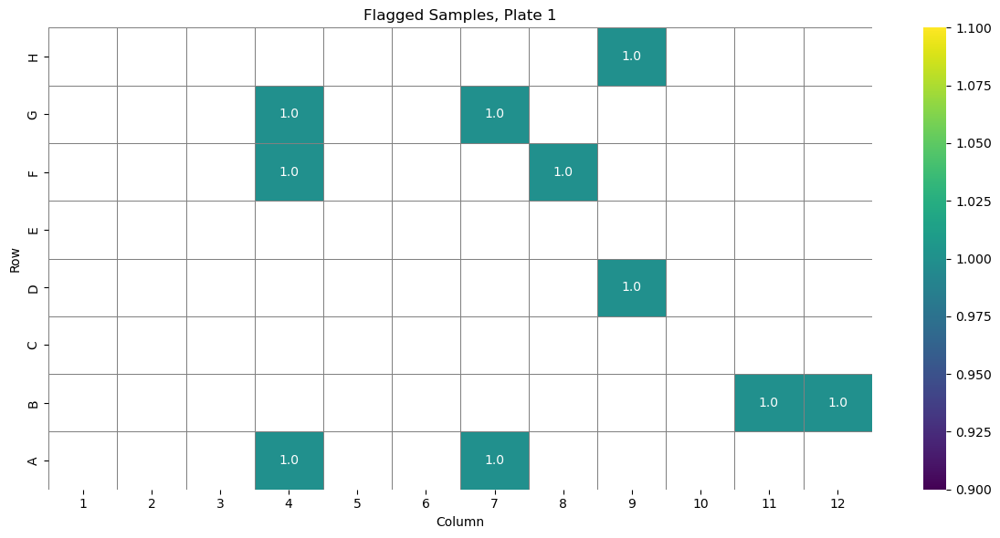

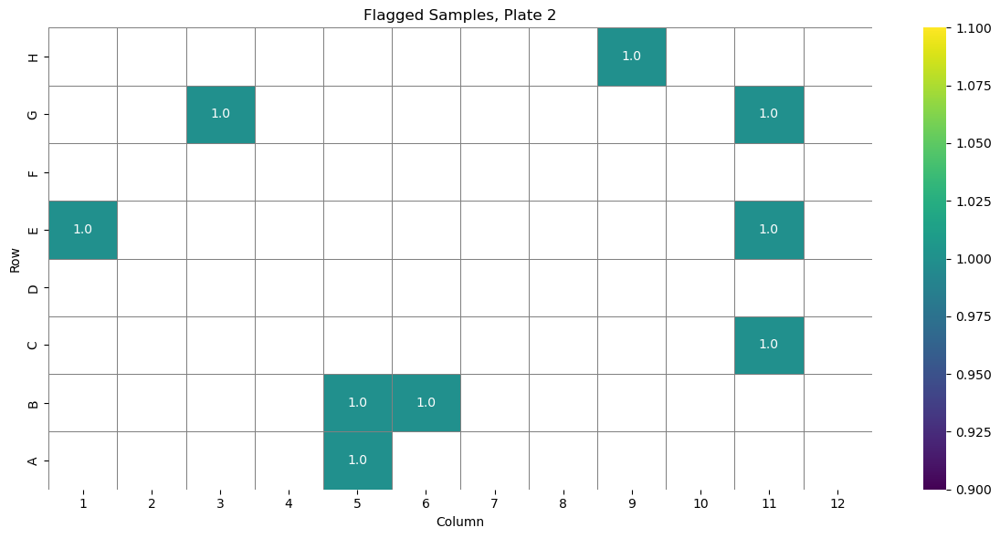

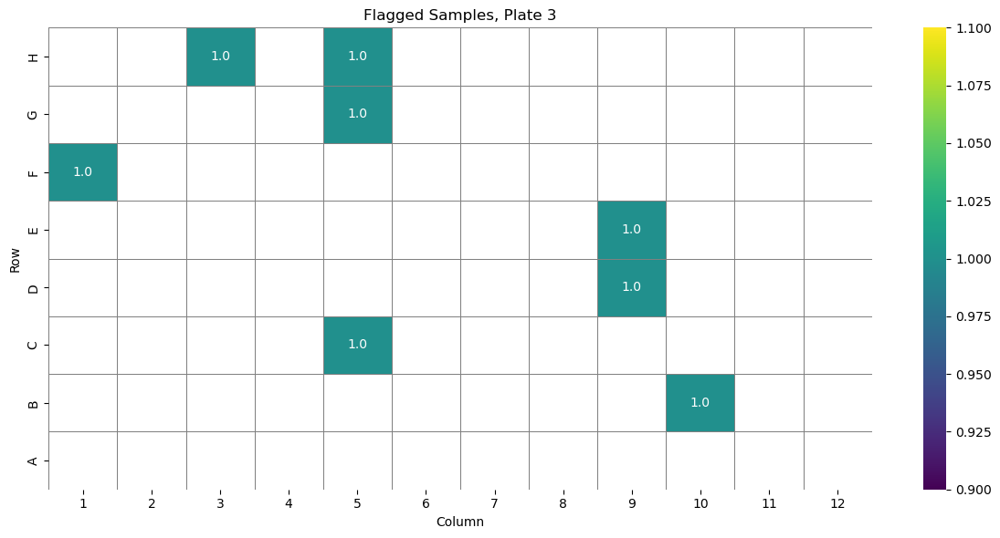

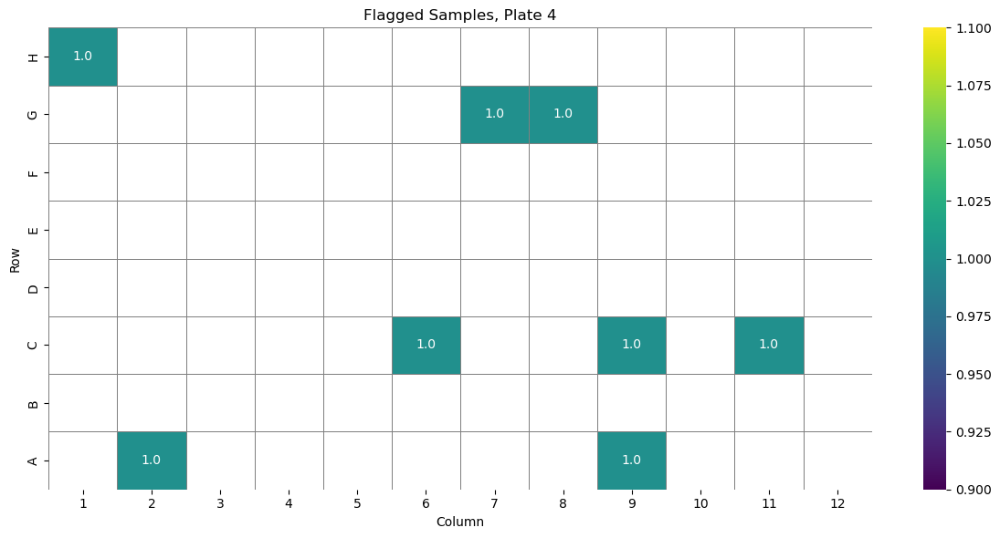

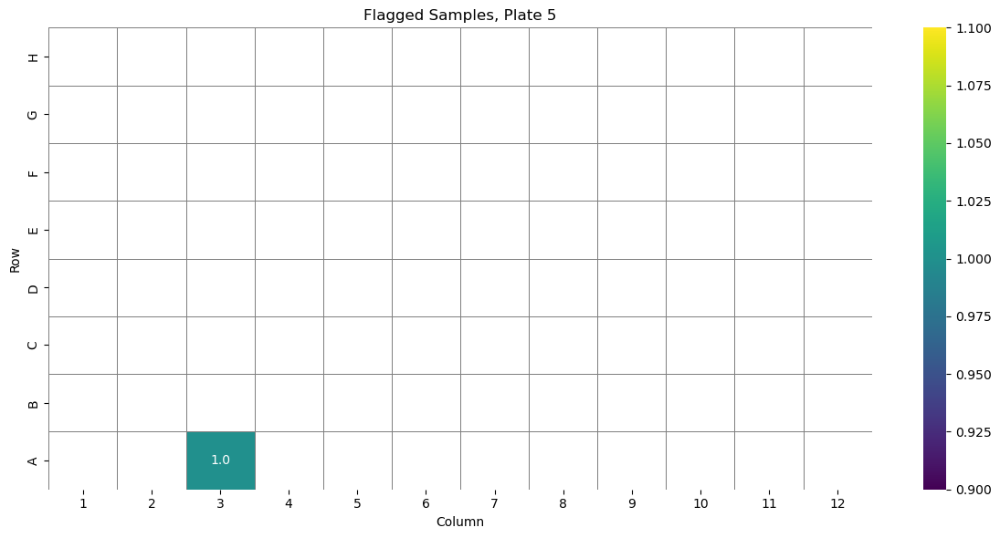

In [530]:
for i in [1, 2, 3, 4, 5]:
    plot_plate_heatmap(suspect["Well"][suspect["Plate"] == str(i)].tolist(), 
                       [1] * len(suspect["Well"][suspect["Plate"] == str(i)].tolist()), 
                       title="Flagged Samples, Plate " + str(i))

In [ ]:
import numpy as np
import pandas as pd
from scipy.spatial.distance import pdist, squareform
import matplotlib.pyplot as plt
import seaborn as sns

# ---- 2. Calculate full Bray-Curtis dissimilarity matrix ----
from scipy.spatial.distance import braycurtis

bray_curtis_matrix = pd.DataFrame(
    squareform(pdist(edna_data, metric='braycurtis')),
    index=edna_data.index,
    columns=edna_data.index
)

# ---- 3. Per-group outlier detection ----
outlier_records = []

for group in unique_groups:
    group_samples = metadata[metadata['Group'] == group].index

    # Skip groups with ≤ 2 samples
    if len(group_samples) < 3:
        print(f"Skipping group {group} (only {len(group_samples)} samples)")
        continue

    group_distances = bray_curtis_matrix.loc[group_samples, group_samples]
    mean_dissim = group_distances.mean(axis=1)
    threshold = np.percentile(mean_dissim, 90)
    outliers = mean_dissim[mean_dissim > threshold]

    for sample_id, dissim_value in outliers.items():
        # Calculate mean dissimilarity to the rest of the group (excluding self)
        other_group_members = group_distances.loc[sample_id].drop(sample_id)
        mean_dissim_to_group = other_group_members.mean()

        # Compare to other groups
        sample_distances = bray_curtis_matrix.loc[sample_id]
        group_avgs = {}
        for other_group in unique_groups:
            if other_group == group:
                continue
            other_ids = metadata[metadata['Group'] == other_group].index
            group_avg_dissim = sample_distances[other_ids].mean()
            group_avgs[other_group] = group_avg_dissim

        most_similar_group = min(group_avgs, key=group_avgs.get)

        outlier_records.append({
            'Sample': sample_id,
            'Original_Group': group,
            'Mean_Within_Group_Dissimilarity': dissim_value,
            'Dissimilarity_to_Own_Group_Excl_Self': mean_dissim_to_group,
            'Most_Similar_Group': most_similar_group,
            'Dissimilarity_to_Most_Similar': group_avgs[most_similar_group]
        })

# ---- 4. Convert results to DataFrame ----
outliers_df = pd.DataFrame(outlier_records)
print("\n🚨 Potential Within-Group Outliers + Most Similar Alternate Group:")
print(outliers_df.sort_values(by='Mean_Within_Group_Dissimilarity', ascending=False))

# ---- 5. (Optional) Visualize NMDS for context ----
from sklearn.manifold import MDS
mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
coords = mds.fit_transform(bray_curtis_matrix)
nmds_df = pd.DataFrame(coords, columns=['NMDS1', 'NMDS2'], index=edna_data.index)
nmds_df = nmds_df.join(metadata)

plt.figure(figsize=(10, 6))
sns.scatterplot(data=nmds_df, x='NMDS1', y='NMDS2', hue='Group', s=100)

# Highlight outliers
for sid in outliers_df['Sample']:
    x, y = nmds_df.loc[sid, ['NMDS1', 'NMDS2']]
    plt.scatter(x, y, color='red', edgecolor='black', s=200, label='Outlier')

plt.title("NMDS (Bray-Curtis) with Flagged Outliers")
plt.tight_layout()
plt.show()

Skipping group Dart Lake_Spring (only 0 samples)
Skipping group Moss Lake_Spring (only 0 samples)
Skipping group Sagamore_Spring (only 0 samples)
Skipping group Heart_Spring (only 0 samples)
Skipping group Rondaxe_Spring (only 0 samples)
Skipping group Upper Cascade_Spring (only 0 samples)
Skipping group East Copperas_Spring (only 0 samples)
Skipping group Little Clear_Spring (only 0 samples)
Skipping group PCR Blank_Early Fall (only 1 samples)
Skipping group Field Blank_Early Fall (only 2 samples)
Skipping group Field Blank_Spring (only 0 samples)
Skipping group Extraction Blank_Spring (only 0 samples)

🚨 Potential Within-Group Outliers + Most Similar Alternate Group:
   Sample                Original_Group  Mean_Within_Group_Dissimilarity  \
6     281          Dart Lake_Early Fall                            0.973   
4     290          Dart Lake_Early Fall                            0.964   
5     297          Dart Lake_Early Fall                            0.961   
10    323         

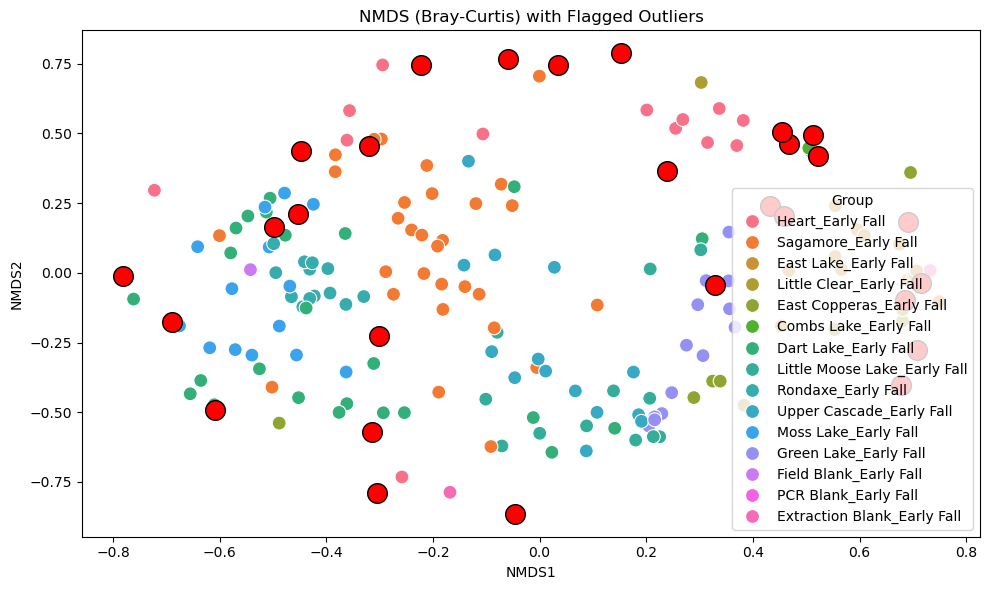

In [290]:
import numpy as np
import pandas as pd
from scipy.spatial.distance import pdist, squareform
import matplotlib.pyplot as plt
import seaborn as sns

# ---- 2. Calculate full Bray-Curtis dissimilarity matrix ----
from scipy.spatial.distance import braycurtis

bray_curtis_matrix = pd.DataFrame(
    squareform(pdist(edna_data, metric='braycurtis')),
    index=edna_data.index,
    columns=edna_data.index
)

# ---- 3. Per-group outlier detection ----
outlier_records = []

for group in unique_groups:
    group_samples = metadata[metadata['Group'] == group].index

    # Skip groups with ≤ 2 samples
    if len(group_samples) < 3:
        print(f"Skipping group {group} (only {len(group_samples)} samples)")
        continue

    group_distances = bray_curtis_matrix.loc[group_samples, group_samples]
    mean_dissim = group_distances.mean(axis=1)
    threshold = np.percentile(mean_dissim, 90)
    outliers = mean_dissim[mean_dissim > threshold]

    for sample_id, dissim_value in outliers.items():
        # Calculate mean dissimilarity to the rest of the group (excluding self)
        other_group_members = group_distances.loc[sample_id].drop(sample_id)
        mean_dissim_to_group = other_group_members.mean()

        # Compare to other groups
        sample_distances = bray_curtis_matrix.loc[sample_id]
        group_avgs = {}
        for other_group in unique_groups:
            if other_group == group:
                continue
            other_ids = metadata[metadata['Group'] == other_group].index
            group_avg_dissim = sample_distances[other_ids].mean()
            group_avgs[other_group] = group_avg_dissim

        most_similar_group = min(group_avgs, key=group_avgs.get)

        outlier_records.append({
            'Sample': sample_id,
            'Original_Group': group,
            'Mean_Within_Group_Dissimilarity': dissim_value,
            'Dissimilarity_to_Own_Group_Excl_Self': mean_dissim_to_group,
            'Most_Similar_Group': most_similar_group,
            'Dissimilarity_to_Most_Similar': group_avgs[most_similar_group]
        })

# ---- 4. Convert results to DataFrame ----
outliers_df = pd.DataFrame(outlier_records)
print("\n🚨 Potential Within-Group Outliers + Most Similar Alternate Group:")
print(outliers_df.sort_values(by='Mean_Within_Group_Dissimilarity', ascending=False))

# ---- 5. (Optional) Visualize NMDS for context ----
from sklearn.manifold import MDS
mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
coords = mds.fit_transform(bray_curtis_matrix)
nmds_df = pd.DataFrame(coords, columns=['NMDS1', 'NMDS2'], index=edna_data.index)
nmds_df = nmds_df.join(metadata)

plt.figure(figsize=(10, 6))
sns.scatterplot(data=nmds_df, x='NMDS1', y='NMDS2', hue='Group', s=100)

# Highlight outliers
for sid in outliers_df['Sample']:
    x, y = nmds_df.loc[sid, ['NMDS1', 'NMDS2']]
    plt.scatter(x, y, color='red', edgecolor='black', s=200, label='Outlier')

plt.title("NMDS (Bray-Curtis) with Flagged Outliers")
plt.tight_layout()
plt.show()

In [291]:
nmds_df[nmds_df["Group"] == "Little Clear_Early Fall"]

,NMDS1,NMDS2,Group
377,0.686,-0.096,Little Clear_Early Fall
378,0.303,0.683,Little Clear_Early Fall
385,0.681,-0.173,Little Clear_Early Fall
374,0.677,-0.404,Little Clear_Early Fall
381,0.303,0.683,Little Clear_Early Fall
379,0.681,-0.132,Little Clear_Early Fall
382,0.677,-0.404,Little Clear_Early Fall
375,0.677,-0.404,Little Clear_Early Fall
384,0.677,-0.404,Little Clear_Early Fall
380,0.303,0.683,Little Clear_Early Fall


<Axes: xlabel='NMDS1', ylabel='NMDS2'>

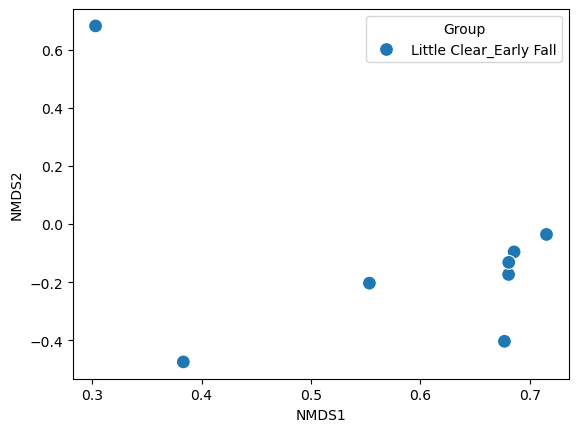

In [292]:
sns.scatterplot(data=nmds_df[nmds_df["Group"] == "Little Clear_Early Fall"], x='NMDS1', y='NMDS2', hue='Group', s=100)

In [265]:
nmds_df

,NMDS1,NMDS2,Group
367,-0.729,-0.192,Heart_Early Fall
349,-0.168,-0.222,Sagamore_Early Fall
166,0.566,0.296,East Lake_Early Fall
377,0.266,0.570,Little Clear_Early Fall
212,0.359,-0.711,East Copperas_Early Fall
...,...,...,...
153,0.009,-0.548,Little Moose Lake_Early Fall
176,0.329,-0.286,Green Lake_Early Fall
168,0.587,-0.456,East Lake_Early Fall
170,0.322,-0.256,East Lake_Early Fall


<Axes: xlabel='NMDS1', ylabel='NMDS2'>

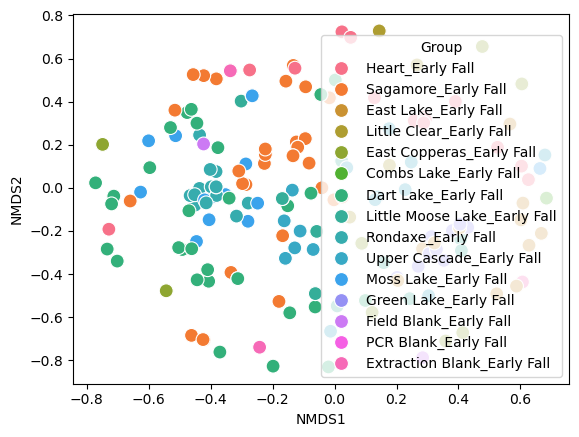

In [264]:
sns.scatterplot(data=nmds_df, x='NMDS1', y='NMDS2', hue='Group', s=100)

In [293]:
outliers_df

,Sample,Original_Group,Mean_Within_Group_Dissimilarity,Dissimilarity_to_Own_Group_Excl_Self,Most_Similar_Group,Dissimilarity_to_Most_Similar
0,162,East Lake_Early Fall,0.613,0.651,Green Lake_Early Fall,0.508
1,165,East Lake_Early Fall,0.562,0.597,Combs Lake_Early Fall,0.741
2,202,Combs Lake_Early Fall,0.107,0.114,Green Lake_Early Fall,0.725
3,196,Combs Lake_Early Fall,0.242,0.258,Green Lake_Early Fall,0.742
4,290,Dart Lake_Early Fall,0.964,0.991,Sagamore_Early Fall,0.869
5,297,Dart Lake_Early Fall,0.961,0.987,Rondaxe_Early Fall,1.000
6,281,Dart Lake_Early Fall,0.973,1.000,East Copperas_Early Fall,0.267
7,279,Dart Lake_Early Fall,0.917,0.942,Rondaxe_Early Fall,0.973
8,141,Little Moose Lake_Early Fall,0.682,0.728,Sagamore_Early Fall,0.720
9,155,Little Moose Lake_Early Fall,0.787,0.839,Combs Lake_Early Fall,0.716


In [214]:
edna_data

Overall_Best,Lepomis gibbosus,Perca flavescens,Micropterus salmoides,Salvelinus fontinalis,Catostomus commersonii,Semotilus atromaculatus,Umbra limi,Notemigonus crysoleucas,Ameiurus nebulosus,Micropterus dolomieu,...,Coregonus clupeaformis,Luxilus cornutus,Catostomus catostomus,Salmo salar,Noturus insignis,Ameiurus melas,Exoglossum maxillingua,Sander vitreus,Cottus cognatus,Salmo trutta
166,False,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
195,False,False,False,False,False,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
301,False,True,True,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
142,True,False,False,False,True,False,True,False,False,True,...,False,False,False,False,False,False,False,False,False,False
57,False,True,True,False,True,True,False,False,False,True,...,False,False,False,False,True,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102,True,True,True,False,True,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
181,True,False,False,True,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
215,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
288,True,True,False,False,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [199]:
import numpy as np
import pandas as pd
from scipy.spatial.distance import pdist, squareform, braycurtis
from scipy.optimize import nnls
import matplotlib.pyplot as plt
import seaborn as sns

# ---- 1. Load your real eDNA data ----
# Assuming you have 'edna_data' as the count matrix (samples x species)
# and 'metadata' as the sample metadata (containing at least a 'Group' column for lake labels)

# For example:
# edna_data = pd.read_csv('your_edna_data.csv', index_col=0)
# metadata = pd.read_csv('your_metadata.csv', index_col=0)

# ---- 2. Calculate Bray-Curtis Dissimilarity with Zero Handling ----
# Bray-Curtis can handle zeros directly, but let's explicitly ensure that we ignore species
# with zero counts in both samples during distance calculations

def braycurtis_with_zeros(a, b):
    # Only consider species where both a and b are non-zero
    nonzero_species = np.nonzero(a + b)[0]
    a_nonzero = a[nonzero_species]
    b_nonzero = b[nonzero_species]
    return braycurtis(a_nonzero, b_nonzero)

bray_curtis_matrix = pd.DataFrame(
    squareform(pdist(edna_data.values, metric=braycurtis_with_zeros)),
    index=edna_data.index,
    columns=edna_data.index
)

# ---- 3. Identify within-group outliers ----
outlier_records = []

unique_groups = metadata['Group'].unique()
for group in unique_groups:
    group_samples = metadata[metadata['Group'] == group].index
    group_distances = bray_curtis_matrix.loc[group_samples, group_samples]
    
    mean_dissim = group_distances.mean(axis=1)
    threshold = np.percentile(mean_dissim, 90)  # Top 10% are flagged as outliers
    outliers = mean_dissim[mean_dissim > threshold]
    
    for sample_id, dissim_value in outliers.items():
        sample_distances = bray_curtis_matrix.loc[sample_id]
        group_avgs = {}
        for other_group in unique_groups:
            if other_group == group:
                continue
            other_ids = metadata[metadata['Group'] == other_group].index
            group_avg_dissim = sample_distances[other_ids].mean()
            group_avgs[other_group] = group_avg_dissim
        
        # Identify the most similar group (lake)
        most_similar_group = min(group_avgs, key=group_avgs.get)
        outlier_records.append({
            'Sample': sample_id,
            'Original_Group': group,
            'Mean_Within_Group_Dissimilarity': dissim_value,
            'Most_Similar_Group': most_similar_group,
            'Dissimilarity_to_Most_Similar': group_avgs[most_similar_group]
        })

outliers_df = pd.DataFrame(outlier_records)

# ---- 4. NNLS Mixing Model on each outlier ----
# Build source matrix: mean profiles of main lakes
sources = unique_groups  # We now use all unique lakes
A = np.column_stack([
    edna_data[metadata['Group'] == lake].mean().values for lake in sources
])

nnls_results = []

for idx, row in outliers_df.iterrows():
    sid = row['Sample']
    b = edna_data.loc[sid].values
    
    # NNLS: ignore zeros in b (sample) but use corresponding values in A (lake profiles)
    mask = b > 0  # Mask to ignore zeros in the target sample
    A_masked = A[mask, :]
    b_masked = b[mask]
    
    # NNLS to get proportions (ignoring zeros)
    mix_props, _ = nnls(A_masked, b_masked, maxiter=10000)
    mix_props_normalized = mix_props / mix_props.sum()  # Normalize proportions
    reconstructed = A @ mix_props_normalized  # Reconstruct sample from mixture
    bc_dist = braycurtis_with_zeros(reconstructed, b)
    
    result = {
        'Sample': sid,
        'Original_Group': row['Original_Group'],
        'Most_Similar_Group': row['Most_Similar_Group'],
        'Mean_Within_Group_Dissimilarity': row['Mean_Within_Group_Dissimilarity'],
        'Bray-Curtis_to_Mixture': bc_dist,
    }
    
    for lake, prop in zip(sources, mix_props_normalized):
        result[f'Prop_{lake}'] = prop
    
    nnls_results.append(result)

nnls_df = pd.DataFrame(nnls_results)

# ---- 5. Output results ----
pd.set_option("display.precision", 3)
print("\n🚨 Outlier Samples with NNLS Mixing Model Estimates:")
print(nnls_df.sort_values('Bray-Curtis_to_Mixture'))

# ---- 6. (Optional) NMDS Plot ----
from sklearn.manifold import MDS
mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
coords = mds.fit_transform(bray_curtis_matrix)
nmds_df = pd.DataFrame(coords, columns=['NMDS1', 'NMDS2'], index=edna_data.index)
nmds_df = nmds_df.join(metadata)

plt.figure(figsize=(10, 6))
sns.scatterplot(data=nmds_df, x='NMDS1', y='NMDS2', hue='Group', s=100)

for sid in nnls_df['Sample']:
    x, y = nmds_df.loc[sid, ['NMDS1', 'NMDS2']]
    plt.scatter(x, y, color='red', edgecolor='black', s=200, label='Outlier')

plt.title("NMDS (Bray-Curtis) with NNLS-Flagged Outliers")
plt.tight_layout()
plt.show()


/user/noge4093/miniconda3/envs/orbicella/lib/python3.9/site-packages/scipy/spatial/distance.py:1128: RuntimeWarning: invalid value encountered in scalar divide
  return l1_diff.sum() / l1_sum.sum()
/fs/dss/scratch/7332770_noge4093_mpcs045/ipykernel_3974412/2416453882.py:71: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  edna_data[metadata['Group'] == lake].mean().values for lake in sources
/fs/dss/scratch/7332770_noge4093_mpcs045/ipykernel_3974412/2416453882.py:71: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  edna_data[metadata['Group'] == lake].mean().values for lake in sources
/fs/dss/scratch/7332770_noge4093_mpcs045/ipykernel_3974412/2416453882.py:71: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  edna_data[metadata['Group'] == lake].mean().values for lake in sources
/fs/dss/scratch/7332770_noge4093_mpcs045/ipykernel_3974412/2416453882.py:71: UserWarning: Boolean Series key will be reindex

RuntimeError: Maximum number of iterations reached.

In [198]:
A_masked

array([[2.32890667e+04, 2.95010000e+04, 0.00000000e+00, 0.00000000e+00,
        2.00223750e+04, 2.27012500e+03, 1.10531250e+04, 0.00000000e+00,
        0.00000000e+00, 4.72337838e+03, 4.24181250e+03, 3.13956250e+03,
        4.86929730e+03, 2.64737500e+03, 8.33500000e+02, 0.00000000e+00,
        2.11176471e+02, 6.08862353e+04, 1.89352500e+04, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 1.14285714e+00, 2.12500000e+00,
        0.00000000e+00],
       [7.74247333e+04, 6.81011333e+04, 2.81375000e+02, 4.86333333e+02,
        0.00000000e+00, 0.00000000e+00, 1.26956250e+03, 5.87037500e+03,
        2.01812500e+02, 0.00000000e+00, 1.00500000e+03, 4.37187500e+03,
        3.02567568e+02, 6.19000000e+02, 3.63750000e+02, 1.62733333e+02,
        5.90588235e+01, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        1.50000000e+00]])

In [71]:
# ---- 1. Simulate eDNA-like count data ----
np.random.seed(42)
num_species = 10
group_means = {
    'Lake_A': np.random.poisson(20, num_species),
    'Lake_B': np.random.poisson(10, num_species),
    'Lake_C': np.random.poisson(5, num_species),
    'Weird':  np.random.poisson(30, num_species)
}

group_labels = ['Lake_A'] * 10 + ['Lake_B'] * 10 + ['Lake_C'] * 10 + ['Weird'] * 2
samples = []

for label in group_labels:
    counts = group_means[label] + np.random.poisson(2, num_species)
    samples.append(counts)

species_cols = [f"Species_{i+1}" for i in range(num_species)]
df = pd.DataFrame(samples, columns=species_cols)
df.index = [f"Sample_{i+1}" for i in range(len(df))]
df['Group'] = group_labels

edna_data = df[species_cols]
metadata = df[['Group']]
metadata.loc[metadata["Group"] == "Weird", "Group"] = "Lake_C"


🚨 Outlier Samples with NNLS Mixing Model Estimates:
      Sample Original_Group Most_Similar_Group  \
0   Sample_5         Lake_A             Lake_B   
1  Sample_14         Lake_B             Lake_A   
2  Sample_31         Lake_C             Lake_A   
3  Sample_32         Lake_C             Lake_A   

   Mean_Within_Group_Dissimilarity  Bray-Curtis_to_Mixture  Prop_Lake_A  \
0                            0.043                   0.041        0.924   
1                            0.086                   0.075        0.194   
2                            0.582                   0.419        0.323   
3                            0.579                   0.449        0.213   

   Prop_Lake_B  Prop_Lake_C  
0        0.076        0.000  
1        0.806        0.000  
2        0.000        0.677  
3        0.189        0.598  


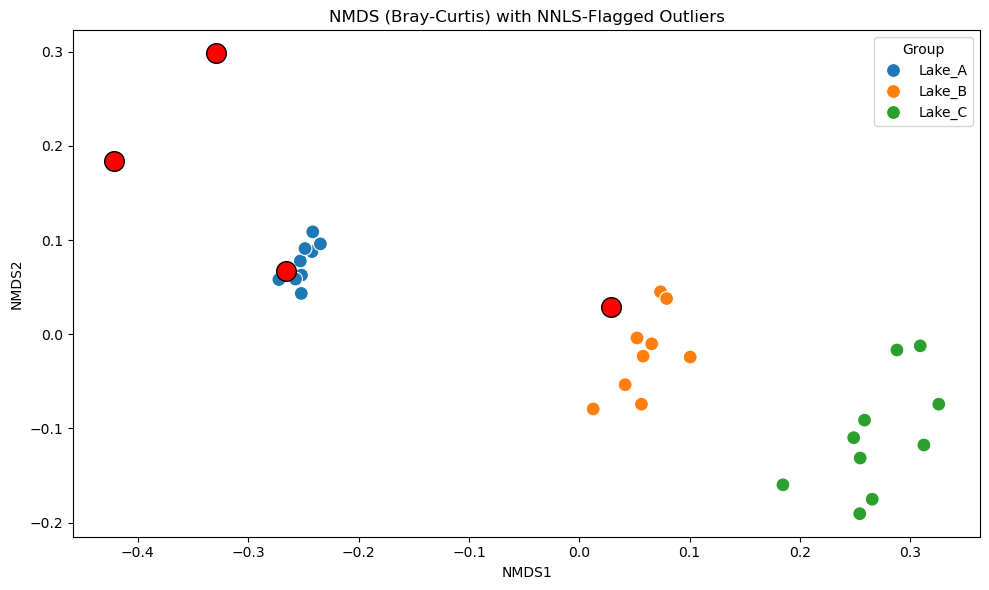

In [81]:
import numpy as np
import pandas as pd
from scipy.spatial.distance import pdist, squareform, braycurtis
from scipy.optimize import nnls
import matplotlib.pyplot as plt
import seaborn as sns

# ---- 1. Load your real eDNA data ----
# Assuming you have 'edna_data' as the count matrix (samples x species)
# and 'metadata' as the sample metadata (containing at least a 'Group' column for lake labels)

# For example:
# edna_data = pd.read_csv('your_edna_data.csv', index_col=0)
# metadata = pd.read_csv('your_metadata.csv', index_col=0)

# ---- 2. Calculate Bray-Curtis Dissimilarity with Zero Handling ----
# Bray-Curtis can handle zeros directly, but let's explicitly ensure that we ignore species
# with zero counts in both samples during distance calculations

def braycurtis_with_zeros(a, b):
    # Only consider species where both a and b are non-zero
    nonzero_species = np.nonzero(a + b)[0]
    a_nonzero = a[nonzero_species]
    b_nonzero = b[nonzero_species]
    return braycurtis(a_nonzero, b_nonzero)

bray_curtis_matrix = pd.DataFrame(
    squareform(pdist(edna_data.values, metric=braycurtis_with_zeros)),
    index=edna_data.index,
    columns=edna_data.index
)

# ---- 3. Identify within-group outliers ----
outlier_records = []

unique_groups = metadata['Group'].unique()
for group in unique_groups:
    group_samples = metadata[metadata['Group'] == group].index
    group_distances = bray_curtis_matrix.loc[group_samples, group_samples]
    
    mean_dissim = group_distances.mean(axis=1)
    threshold = np.percentile(mean_dissim, 90)  # Top 10% are flagged as outliers
    outliers = mean_dissim[mean_dissim > threshold]
    
    for sample_id, dissim_value in outliers.items():
        sample_distances = bray_curtis_matrix.loc[sample_id]
        group_avgs = {}
        for other_group in unique_groups:
            if other_group == group:
                continue
            other_ids = metadata[metadata['Group'] == other_group].index
            group_avg_dissim = sample_distances[other_ids].mean()
            group_avgs[other_group] = group_avg_dissim
        
        # Identify the most similar group (lake)
        most_similar_group = min(group_avgs, key=group_avgs.get)
        outlier_records.append({
            'Sample': sample_id,
            'Original_Group': group,
            'Mean_Within_Group_Dissimilarity': dissim_value,
            'Most_Similar_Group': most_similar_group,
            'Dissimilarity_to_Most_Similar': group_avgs[most_similar_group]
        })

outliers_df = pd.DataFrame(outlier_records)

# ---- 4. NNLS Mixing Model on each outlier ----
# Build source matrix: mean profiles of main lakes
sources = unique_groups  # We now use all unique lakes
A = np.column_stack([
    edna_data[metadata['Group'] == lake].mean().values for lake in sources
])

nnls_results = []

for idx, row in outliers_df.iterrows():
    sid = row['Sample']
    b = edna_data.loc[sid].values
    
    # NNLS: ignore zeros in b (sample) but use corresponding values in A (lake profiles)
    mask = b > 0  # Mask to ignore zeros in the target sample
    A_masked = A[mask, :]
    b_masked = b[mask]
    
    # NNLS to get proportions (ignoring zeros)
    mix_props, _ = nnls(A_masked, b_masked)
    mix_props_normalized = mix_props / mix_props.sum()  # Normalize proportions
    reconstructed = A @ mix_props_normalized  # Reconstruct sample from mixture
    bc_dist = braycurtis_with_zeros(reconstructed, b)
    
    result = {
        'Sample': sid,
        'Original_Group': row['Original_Group'],
        'Most_Similar_Group': row['Most_Similar_Group'],
        'Mean_Within_Group_Dissimilarity': row['Mean_Within_Group_Dissimilarity'],
        'Bray-Curtis_to_Mixture': bc_dist,
    }
    
    for lake, prop in zip(sources, mix_props_normalized):
        result[f'Prop_{lake}'] = prop
    
    nnls_results.append(result)

nnls_df = pd.DataFrame(nnls_results)

# ---- 5. Output results ----
pd.set_option("display.precision", 3)
print("\n🚨 Outlier Samples with NNLS Mixing Model Estimates:")
print(nnls_df.sort_values('Bray-Curtis_to_Mixture'))

# ---- 6. (Optional) NMDS Plot ----
from sklearn.manifold import MDS
mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
coords = mds.fit_transform(bray_curtis_matrix)
nmds_df = pd.DataFrame(coords, columns=['NMDS1', 'NMDS2'], index=edna_data.index)
nmds_df = nmds_df.join(metadata)

plt.figure(figsize=(10, 6))
sns.scatterplot(data=nmds_df, x='NMDS1', y='NMDS2', hue='Group', s=100)

for sid in nnls_df['Sample']:
    x, y = nmds_df.loc[sid, ['NMDS1', 'NMDS2']]
    plt.scatter(x, y, color='red', edgecolor='black', s=200, label='Outlier')

plt.title("NMDS (Bray-Curtis) with NNLS-Flagged Outliers")
plt.tight_layout()
plt.show()



🚨 Outlier Samples with NNLS Mixing Model Estimates:
      Sample Original_Group Most_Similar_Group  \
2  Sample_29         Lake_C             Lake_A   
3  Sample_31         Lake_C             Lake_A   
0   Sample_5         Lake_A             Lake_C   
1  Sample_14         Lake_B             Lake_A   

   Mean_Within_Group_Dissimilarity  Bray-Curtis_to_Mixture  Prop_Lake_A  \
2                            0.023                   0.021        0.000   
3                            0.023                   0.039        0.137   
0                            0.043                   0.041        0.924   
1                            0.086                   0.075        0.194   

   Prop_Lake_B  Prop_Lake_C  
2        0.000        1.000  
3        0.000        0.863  
0        0.076        0.000  
1        0.806        0.000  


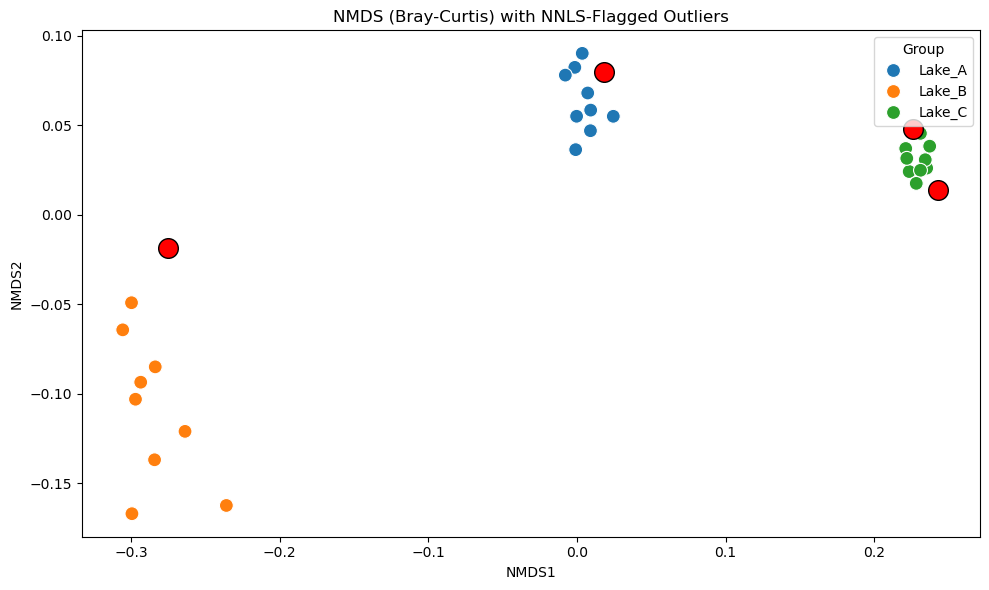

In [69]:
import numpy as np
import pandas as pd
from scipy.spatial.distance import pdist, squareform, braycurtis
from scipy.optimize import nnls
import matplotlib.pyplot as plt
import seaborn as sns


metadata = df[['Group']]

# ---- 2. Calculate full Bray-Curtis dissimilarity matrix ----
bray_curtis_matrix = pd.DataFrame(
    squareform(pdist(edna_data, metric='braycurtis')),
    index=edna_data.index,
    columns=edna_data.index
)

# ---- 3. Identify within-group outliers ----
outlier_records = []

unique_groups = metadata['Group'].unique()
for group in unique_groups:
    group_samples = metadata[metadata['Group'] == group].index
    group_distances = bray_curtis_matrix.loc[group_samples, group_samples]
    
    mean_dissim = group_distances.mean(axis=1)
    threshold = np.percentile(mean_dissim, 90)
    outliers = mean_dissim[mean_dissim > threshold]
    
    for sample_id, dissim_value in outliers.items():
        sample_distances = bray_curtis_matrix.loc[sample_id]
        group_avgs = {}
        for other_group in unique_groups:
            if other_group == group:
                continue
            other_ids = metadata[metadata['Group'] == other_group].index
            group_avg_dissim = sample_distances[other_ids].mean()
            group_avgs[other_group] = group_avg_dissim
        
        most_similar_group = min(group_avgs, key=group_avgs.get)
        outlier_records.append({
            'Sample': sample_id,
            'Original_Group': group,
            'Mean_Within_Group_Dissimilarity': dissim_value,
            'Most_Similar_Group': most_similar_group,
            'Dissimilarity_to_Most_Similar': group_avgs[most_similar_group]
        })

outliers_df = pd.DataFrame(outlier_records)

# ---- 4. NNLS Mixing Model on each outlier ----
# Build source matrix: mean profiles of main lakes
sources = ['Lake_A', 'Lake_B', 'Lake_C']
A = np.column_stack([
    edna_data[metadata['Group'] == lake].mean().values for lake in sources
])

nnls_results = []

for idx, row in outliers_df.iterrows():
    sid = row['Sample']
    b = edna_data.loc[sid].values
    
    # NNLS to get proportions
    mix_props, _ = nnls(A, b)
    mix_props_normalized = mix_props / mix_props.sum()
    reconstructed = A @ mix_props_normalized
    bc_dist = braycurtis(reconstructed, b)
    
    result = {
        'Sample': sid,
        'Original_Group': row['Original_Group'],
        'Most_Similar_Group': row['Most_Similar_Group'],
        'Mean_Within_Group_Dissimilarity': row['Mean_Within_Group_Dissimilarity'],
        'Bray-Curtis_to_Mixture': bc_dist,
    }
    
    for lake, prop in zip(sources, mix_props_normalized):
        result[f'Prop_{lake}'] = prop
    
    nnls_results.append(result)

nnls_df = pd.DataFrame(nnls_results)

# ---- 5. Output results ----
pd.set_option("display.precision", 3)
print("\n🚨 Outlier Samples with NNLS Mixing Model Estimates:")
print(nnls_df.sort_values('Bray-Curtis_to_Mixture'))

# ---- 6. (Optional) NMDS Plot ----
from sklearn.manifold import MDS
mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
coords = mds.fit_transform(bray_curtis_matrix)
nmds_df = pd.DataFrame(coords, columns=['NMDS1', 'NMDS2'], index=edna_data.index)
nmds_df = nmds_df.join(metadata)

plt.figure(figsize=(10, 6))
sns.scatterplot(data=nmds_df, x='NMDS1', y='NMDS2', hue='Group', s=100)

for sid in nnls_df['Sample']:
    x, y = nmds_df.loc[sid, ['NMDS1', 'NMDS2']]
    plt.scatter(x, y, color='red', edgecolor='black', s=200, label='Outlier')

plt.title("NMDS (Bray-Curtis) with NNLS-Flagged Outliers")
plt.tight_layout()
plt.show()


In [52]:
df

,Species_1,Species_2,Species_3,Species_4,Species_5,Species_6,Species_7,Species_8,Species_9,Species_10,Group
Sample_1,26,17,21,27,17,18,22,23,20,21,Lake_A
Sample_2,23,17,22,26,18,18,23,23,17,23,Lake_A
Sample_3,28,17,21,25,16,18,21,23,22,20,Lake_A
Sample_4,25,19,22,27,16,21,24,23,18,22,Lake_A
Sample_5,25,20,26,30,16,17,20,23,18,19,Lake_A
Sample_6,25,17,22,25,18,20,20,21,17,23,Lake_A
Sample_7,24,18,25,26,16,17,19,21,20,21,Lake_A
Sample_8,25,16,23,27,15,18,22,25,20,19,Lake_A
Sample_9,23,15,22,27,17,22,20,24,21,21,Lake_A
Sample_10,26,17,22,29,16,20,20,22,20,19,Lake_A



🚨 Potential Within-Group Outliers + Most Similar Alternate Group:
      Sample Original_Group  Mean_Within_Group_Dissimilarity  \
2  Sample_29         Lake_C                            0.123   
1  Sample_14         Lake_B                            0.086   
0   Sample_5         Lake_A                            0.043   

  Most_Similar_Group  Dissimilarity_to_Most_Similar  
2             Lake_B                          0.271  
1             Lake_C                          0.297  
0              Weird                          0.234  


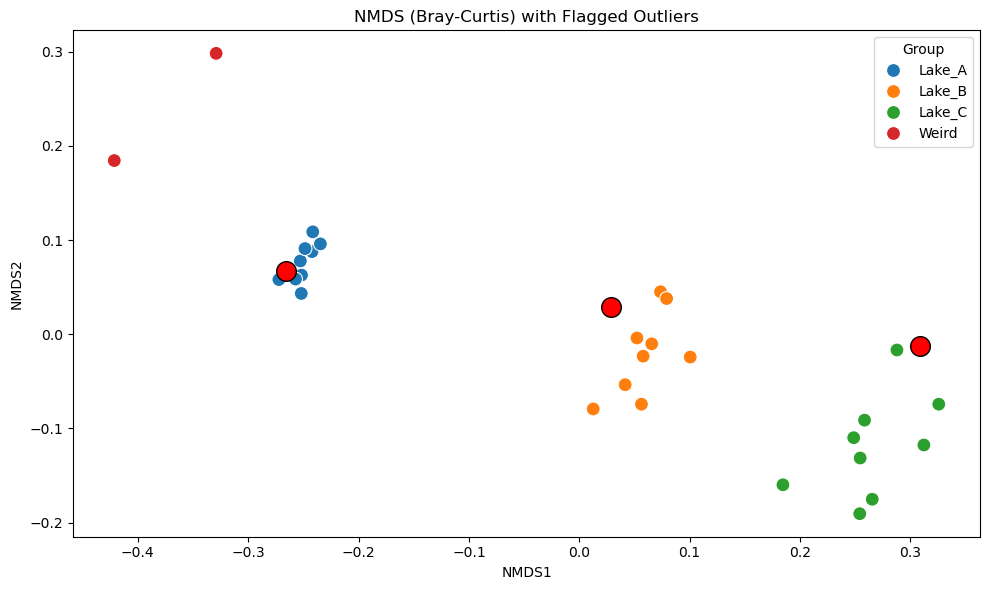

In [70]:
import numpy as np
import pandas as pd
from scipy.spatial.distance import pdist, squareform
import matplotlib.pyplot as plt
import seaborn as sns

# ---- 1. Simulate eDNA-like count data ----
np.random.seed(42)
num_species = 10
group_means = {
    'Lake_A': np.random.poisson(20, num_species),
    'Lake_B': np.random.poisson(10, num_species),
    'Lake_C': np.random.poisson(5, num_species),
    'Weird':  np.random.poisson(30, num_species)
}

group_labels = ['Lake_A'] * 10 + ['Lake_B'] * 10 + ['Lake_C'] * 10 + ['Weird'] * 2
samples = []

for label in group_labels:
    counts = group_means[label] + np.random.poisson(2, num_species)
    samples.append(counts)

species_cols = [f"Species_{i+1}" for i in range(num_species)]
df = pd.DataFrame(samples, columns=species_cols)
df.index = [f"Sample_{i+1}" for i in range(len(df))]
df['Group'] = group_labels

edna_data = df[species_cols]
metadata = df[['Group']]

# ---- 2. Calculate full Bray-Curtis dissimilarity matrix ----
from scipy.spatial.distance import braycurtis

bray_curtis_matrix = pd.DataFrame(
    squareform(pdist(edna_data, metric='braycurtis')),
    index=edna_data.index,
    columns=edna_data.index
)

# ---- 3. Per-group outlier detection ----
outlier_records = []

unique_groups = metadata['Group'].unique()
for group in unique_groups:
    group_samples = metadata[metadata['Group'] == group].index
    group_distances = bray_curtis_matrix.loc[group_samples, group_samples]
    
    # Compute average dissimilarity for each sample to others in its group
    mean_dissim = group_distances.mean(axis=1)
    
    # Define threshold (e.g., top 10% most dissimilar samples)
    threshold = np.percentile(mean_dissim, 90)
    outliers = mean_dissim[mean_dissim > threshold]
    
    for sample_id, dissim_value in outliers.items():
        # For each outlier, check similarity to other groups
        sample_distances = bray_curtis_matrix.loc[sample_id]
        group_avgs = {}
        for other_group in unique_groups:
            if other_group == group:
                continue
            other_ids = metadata[metadata['Group'] == other_group].index
            group_avg_dissim = sample_distances[other_ids].mean()
            group_avgs[other_group] = group_avg_dissim
        
        # Identify most similar group
        most_similar_group = min(group_avgs, key=group_avgs.get)
        outlier_records.append({
            'Sample': sample_id,
            'Original_Group': group,
            'Mean_Within_Group_Dissimilarity': dissim_value,
            'Most_Similar_Group': most_similar_group,
            'Dissimilarity_to_Most_Similar': group_avgs[most_similar_group]
        })

# ---- 4. Convert results to DataFrame ----
outliers_df = pd.DataFrame(outlier_records)
print("\n🚨 Potential Within-Group Outliers + Most Similar Alternate Group:")
print(outliers_df.sort_values(by='Mean_Within_Group_Dissimilarity', ascending=False))

# ---- 5. (Optional) Visualize NMDS for context ----
from sklearn.manifold import MDS
mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
coords = mds.fit_transform(bray_curtis_matrix)
nmds_df = pd.DataFrame(coords, columns=['NMDS1', 'NMDS2'], index=edna_data.index)
nmds_df = nmds_df.join(metadata)

plt.figure(figsize=(10, 6))
sns.scatterplot(data=nmds_df, x='NMDS1', y='NMDS2', hue='Group', s=100)

# Highlight outliers
for sid in outliers_df['Sample']:
    x, y = nmds_df.loc[sid, ['NMDS1', 'NMDS2']]
    plt.scatter(x, y, color='red', edgecolor='black', s=200, label='Outlier')

plt.title("NMDS (Bray-Curtis) with Flagged Outliers")
plt.tight_layout()
plt.show()


In [55]:
import numpy as np
import pandas as pd
from scipy.optimize import nnls
from scipy.spatial.distance import braycurtis

# ---- 1. Simulate count data (same as before) ----
np.random.seed(42)
num_species = 10
group_means = {
    'Lake_A': np.random.poisson(20, num_species),
    'Lake_B': np.random.poisson(10, num_species),
    'Lake_C': np.random.poisson(5, num_species),
    'Weird':  np.random.poisson(30, num_species)
}

group_labels = ['Lake_A'] * 10 + ['Lake_B'] * 10 + ['Lake_C'] * 10 + ['Weird'] * 2
samples = []

for label in group_labels:
    counts = group_means[label] + np.random.poisson(2, num_species)
    samples.append(counts)

species_cols = [f"Species_{i+1}" for i in range(num_species)]
df = pd.DataFrame(samples, columns=species_cols)
df.index = [f"Sample_{i+1}" for i in range(len(df))]
df['Group'] = group_labels

edna_data = df[species_cols]
metadata = df[['Group']]

# ---- 2. Compute mean profile for each lake group ----
lake_profiles = {}
for lake in metadata['Group'].unique():
    lake_profiles[lake] = edna_data[metadata['Group'] == lake].mean().values

# ---- 3. Pick a sample to test mixing (e.g., an outlier or weird sample) ----
sample_id = 'Sample_31'  # Choose a "Weird" or outlier sample
target_sample = edna_data.loc[sample_id].values

# ---- 4. Prepare matrix A (each column = lake profile) and vector b (sample) ----
sources = ['Lake_A', 'Lake_B', 'Lake_C']
A = np.column_stack([lake_profiles[lake] for lake in sources])
b = target_sample

# ---- 5. Run non-negative least squares ----
mix_props, residual = nnls(A, b)

# ---- 6. Normalize to get proportions ----
mix_props_normalized = mix_props / mix_props.sum()

# ---- 7. Show results ----
print(f"\n📊 NNLS Mixing Proportions for {sample_id}:")
for lake, prop in zip(sources, mix_props_normalized):
    print(f"  {lake}: {prop:.2%}")

# ---- 8. Optional: Check fit quality ----
reconstructed = A @ mix_props
bc_dist = braycurtis(reconstructed, b)
print(f"\nBray-Curtis distance between sample and NNLS mixture: {bc_dist:.4f}")



📊 NNLS Mixing Proportions for Sample_31:
  Lake_A: 43.65%
  Lake_B: 16.03%
  Lake_C: 40.32%

Bray-Curtis distance between sample and NNLS mixture: 0.0553


In [46]:
(metadata["EGCF-ID"]
                [metadata["Name"] == "Little Clear"]
                [metadata["Season"] == "Spring"].tolist())

['69',
 '47',
 '45',
 '46',
 '66',
 '67',
 '42',
 '43',
 '44',
 '68',
 '37',
 '38',
 '40',
 '41',
 '39']

In [36]:
subset[random.choices((metadata["EGCF-ID"]
                [metadata["Name"] == "Little Clear"]
                [metadata["Season"] == "Spring"]
                [metadata["Description"] == "Deep"].tolist()), 
               k = 13)].sum(axis=1)

0          0.0
1          0.0
2          0.0
3     108820.0
4     826679.0
5          0.0
6          0.0
7          0.0
8          0.0
9     424341.0
10         0.0
11         0.0
12         0.0
13         0.0
14         0.0
15         0.0
16         0.0
17         0.0
18         0.0
19         0.0
20         0.0
21         0.0
22         0.0
23         0.0
24         0.0
25         0.0
26         0.0
27         0.0
28         0.0
29         0.0
30         0.0
31         0.0
32         0.0
33         0.0
dtype: float64

In [39]:
samples = random.choices((metadata["EGCF-ID"]
                [metadata["Name"] == "Little Clear"]
                [metadata["Season"] == "Spring"]
                [metadata["Description"] == "Deep"].tolist()), 
               k = 13)

In [41]:
subset

,1,10,100,101,102,103,104,105,106,107,...,Best_Hit_Taxonomic_level,Best_Hit_Refseq,Best_Hit_Taxonomic_level_Refseq,Overall_Best,Overall_Best_Percent_ID,Overall_Best_Taxonomic_Level,Primer,in_nsamps,388,389
0,2967.0,32479.0,9916.0,0.0,5528.0,13543.0,9.0,25507.0,18.0,27673.0,...,Genus,Lepomis gibbosus,Species,Lepomis,98.742,Genus,MiFish,174,NaN,NaN
1,2964.0,33188.0,13362.0,0.0,3972.0,13647.0,0.0,29938.0,0.0,34786.0,...,Genus,Lepomis gibbosus,Species,Lepomis gibbosus,98.148,Species,MiFish,172,NaN,NaN
2,8819.0,0.0,52128.0,85285.0,17028.0,53605.0,0.0,0.0,0.0,0.0,...,Species,Perca flavescens,Species,Perca flavescens,98.765,Species,MiFish,106,NaN,NaN
3,38406.0,0.0,40817.0,0.0,11540.0,18078.0,0.0,0.0,0.0,0.0,...,Species,Micropterus salmoides,Species,Micropterus salmoides,98.758,Species,MiFish,87,NaN,NaN
4,0.0,0.0,13336.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,Species,Salvelinus fontinalis,Species,Salvelinus fontinalis,98.750,Species,MiFish,76,NaN,NaN
5,8184.0,0.0,31754.0,0.0,10180.0,31977.0,0.0,0.0,0.0,0.0,...,Species,Catostomus commersonii,Species,Catostomus commersonii,98.171,Species,MiFish,173,NaN,NaN
6,1355.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,Species,Semotilus atromaculatus,Species,Semotilus atromaculatus,98.795,Species,MiFish,80,NaN,NaN
7,3344.0,0.0,0.0,0.0,0.0,0.0,0.0,71315.0,0.0,110455.0,...,Genus,Umbra limi,Species,Umbra limi,98.113,Species,MiFish,50,NaN,NaN
8,0.0,0.0,18222.0,0.0,8044.0,305.0,0.0,0.0,0.0,0.0,...,Species,Notemigonus crysoleucas,Species,Notemigonus crysoleucas,98.824,Species,MiFish,63,NaN,NaN
9,0.0,426.0,902.0,0.0,0.0,0.0,0.0,1497.0,0.0,0.0,...,Genus,Ameiurus nebulosus,Species,Ameiurus nebulosus,98.802,Species,MiFish,88,NaN,NaN


In [40]:
subset[samples].sum(axis=1)

0          0.0
1          0.0
2          0.0
3     326460.0
4     571020.0
5          0.0
6          0.0
7          0.0
8          0.0
9     577960.0
10         0.0
11         0.0
12         0.0
13         0.0
14         0.0
15         0.0
16         0.0
17         0.0
18         0.0
19         0.0
20         0.0
21         0.0
22         0.0
23         0.0
24         0.0
25         0.0
26         0.0
27         0.0
28         0.0
29         0.0
30         0.0
31         0.0
32         0.0
33         0.0
dtype: float64

In [27]:
import random

my_list = [1, 2, 3, 4, 5]
sample_size = 10

# Sample with replacement
sampled_list = random.choices(my_list, k=sample_size)

print(sampled_list)

[2, 5, 3, 1, 5, 3, 1, 3, 4, 3]
